# Итоговый проект "Анализ временных рядов"
Эта работа студента второго курса магистратуры УрФУ "Инженерия машинного обучения" Голубева Артёма Алексеевича, посвященная анализу временных рядов.

В качестве объекта для изучения был выбран датасет [открытые данные энергетических систем](https://open-power-system-data.org/) с выборкой по показателям для **Франции** в период **с 2015 по 2019 годы**.

# Оглавление

1. **Визуализация временных рядов**

    1.1. Необходимые импорты

    1.2. Загрузка данных в Pandas

    1.3. Визуализация временного ряда

    1.4. Вывод по разделу

2. **Простые предсказания**

    2.1. Необходимые импорты

    2.2. Загрузка данных

    2.3. По последнему значению

    2.4. NaiveForecaster

    2.5. Экспоненциальное сглаживание

    2.6. Ансамбль моделей

    2.7. Автоподбор параметров экспоненциального сглаживания

    2.8. Разбиение ряда на компоненты

    2.9. KNeighborsRegressor

    2.10. TBATS

    2.11. Prophet

    2.12. Вывод по простым предсказаниям

3. **SARIMA**

    3.1. Импорты, загрузка и разбиение датасета

    3.2. Проверка на стационарность

    3.3. Подбор порядков AR / MA

    3.4. Вывод по SARIMA

4. **Классификация ВР, классическое МО**

    4.1. Импорты, загрузка и разбиение датасета на времена года

    4.2. Сплит на трейн/тест выборки

    4.3. Классификация от sklearn

    4.4. Классификация от sktime

    4.5. Вывод по классификациям с помощью классического МО

5. **Классификация, нейросеточки (TSAI)**

    5.1. Импорты, загрузка и разбиение датасета

    5.2. Пробуем разные архитектуры нейросеток

    5.3. ResNet

    5.4. InceptionTime

    5.5. Вывод по классификации с помощью нейросеточек

6. **Поиск аномалий**

    6.1. Импорты, загрузка и разбиение датасета

    6.2. Визуализации: скользящие окна, дифференцирование, разложения

    6.3. ADTK

    6.4. SKLEARN

    6.5. PYOD

    6.6. Вывод по аномалиям

7. **Общий вывод по работе**

# 1. Визуализация временных рядов


## 1.1. Необходимые импорты

In [1]:
import os

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import seaborn as sns
sns.set_style("dark")
sns.set(rc={"figure.figsize":(15, 5)})

from google.colab import drive
drive.mount("/content/drive")
DATA_PATH = "/content/drive/MyDrive/data/TSA_Golubev_AA"
CSV_PATH = os.path.join(DATA_PATH, "fr_data.csv")
CSV_CLF_PATH = os.path.join(DATA_PATH, "fr_data_clf.csv")
CSV_HRLY_PATH = os.path.join(DATA_PATH, "fr_data_hrly.csv")

class Config:
    pass

config = Config()
config.download_df = True

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1.2. Загрузка данных в Pandas

In [2]:
if config.download_df:
    URL = "https://data.open-power-system-data.org/time_series/2020-10-06"
    DATAFILE = f"{URL}/time_series_60min_singleindex.csv"
    df_all = pd.read_csv(
        DATAFILE,
        index_col="utc_timestamp",
        parse_dates=True,
        low_memory=False,
    )
    display(df_all)
else:
    print("df is already saved")

,cet_cest_timestamp,AT_load_actual_entsoe_transparency,AT_load_forecast_entsoe_transparency,AT_price_day_ahead,AT_solar_generation_actual,AT_wind_onshore_generation_actual,BE_load_actual_entsoe_transparency,BE_load_forecast_entsoe_transparency,BE_solar_generation_actual,BE_wind_generation_actual,...,SI_load_actual_entsoe_transparency,SI_load_forecast_entsoe_transparency,SI_solar_generation_actual,SI_wind_onshore_generation_actual,SK_load_actual_entsoe_transparency,SK_load_forecast_entsoe_transparency,SK_solar_generation_actual,SK_wind_onshore_generation_actual,UA_load_actual_entsoe_transparency,UA_load_forecast_entsoe_transparency
utc_timestamp,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,2015-01-01T00:00:00+0100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01 00:00:00+00:00,2015-01-01T01:00:00+0100,5946.0,6701.0,35.0,NaN,69.0,9484.0,9897.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01 01:00:00+00:00,2015-01-01T02:00:00+0100,5726.0,6593.0,45.0,NaN,64.0,9152.0,9521.0,NaN,734.81,...,1045.47,816.0,NaN,1.17,2728.0,2860.0,3.8,NaN,NaN,NaN
2015-01-01 02:00:00+00:00,2015-01-01T03:00:00+0100,5347.0,6482.0,41.0,NaN,65.0,8799.0,9135.0,NaN,766.64,...,1004.79,805.0,NaN,1.04,2626.0,2810.0,3.8,NaN,NaN,NaN
2015-01-01 03:00:00+00:00,2015-01-01T04:00:00+0100,5249.0,6454.0,38.0,NaN,64.0,8567.0,8909.0,NaN,733.13,...,983.79,803.0,NaN,1.61,2618.0,2780.0,3.8,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-30 19:00:00+00:00,2020-09-30T21:00:00+0200,6661.0,6656.0,NaN,NaN,1847.0,9402.0,9720.0,NaN,1889.72,...,1506.95,1530.0,5.32,0.44,3324.0,3170.0,1.7,1.1,NaN,NaN
2020-09-30 20:00:00+00:00,2020-09-30T22:00:00+0200,6336.0,6310.0,NaN,NaN,1723.0,9219.0,9418.0,NaN,2154.67,...,1391.15,1388.0,5.57,0.62,3099.0,3010.0,1.7,1.0,NaN,NaN
2020-09-30 21:00:00+00:00,2020-09-30T23:00:00+0200,5932.0,5813.0,NaN,NaN,1771.0,8763.0,8873.0,NaN,2187.48,...,1250.17,1274.0,5.58,0.66,2940.0,2890.0,1.6,1.0,NaN,NaN


Вытащим только данные для Франции за период с 2015 по 2019 годы:

In [3]:
def extract_country(
    df_all: pd.DataFrame,
    country_code: str,
    year_min: int = None,
    year_max: int = None,
) -> pd.DataFrame:
    """Extract data for a single country"""
    # List of columns to extract
    columns = [col for col in df_all.columns if col.startswith(country_code)]
    # Extract columns and remove country codes from column labels
    columns_map = {col: col[3:] for col in columns}
    df_out = df_all[columns].rename(columns=columns_map)
    # Exclude years outside of specified range, if any
    if year_min is not None:
        df_out = df_out[df_out.index.year >= year_min]
    if year_max is not None:
        df_out = df_out[df_out.index.year <= year_max]
    return df_out

if config.download_df:
    df_hrly = extract_country(
        df_all,
        country_code='FR',
        year_min=2015,
        year_max=2019,
    )
    display(df_hrly)
else:
    print("df is already saved")

,load_actual_entsoe_transparency,load_forecast_entsoe_transparency,solar_generation_actual,wind_onshore_generation_actual
utc_timestamp,,,,
2015-01-01 00:00:00+00:00,NaN,NaN,NaN,NaN
2015-01-01 01:00:00+00:00,69773.0,69750.0,NaN,1464.0
2015-01-01 02:00:00+00:00,66417.0,66300.0,NaN,1543.0
2015-01-01 03:00:00+00:00,64182.0,63250.0,NaN,1579.0
2015-01-01 04:00:00+00:00,63859.0,61500.0,NaN,1482.0
...,...,...,...,...
2019-12-31 19:00:00+00:00,64771.0,66950.0,0.0,2695.0
2019-12-31 20:00:00+00:00,62259.0,64150.0,0.0,2831.0
2019-12-31 21:00:00+00:00,63774.0,64100.0,0.0,3031.0


Выделим необходимые столбцы, приведем их к более интерпретируемому виду и сохраним датасет на гуглдиск для более удобного взаимодействия:

In [5]:
def transform_dataframe(
    df: pd.DataFrame,
    cols_map: dict[str],
) -> pd.DataFrame:
    # Rename columns for convenience
    df = df[list(cols_map.keys())].rename(columns=cols_map)
    # Convert from MW to GW
    df = df / 1000
    df = df.resample("D").sum(min_count=24)
    df = df.rename_axis("Date")
    df.index = df.index.strftime("%Y-%m-%d")
    return df


if config.download_df:
    cols_map = {
        "load_actual_entsoe_transparency" : "Consumption",
        "wind_onshore_generation_actual" : "Wind",
        "solar_generation_actual" : "Solar",
    }
    df_daily = transform_dataframe(df_hrly, cols_map)

    # Compute wind + solar generation
    df_daily["Wind+Solar"] = df_daily[["Wind", "Solar"]].sum(axis=1, skipna=False)
    df_daily.to_csv(CSV_PATH)
    display(df_daily)
else:
    print("df is already saved")

,Consumption,Wind,Solar,Wind+Solar
Date,,,,
2015-01-01,NaN,NaN,NaN,NaN
2015-01-02,1637.422,67.921,7.255,75.176
2015-01-03,1510.660,96.577,6.270,102.847
2015-01-04,1404.165,27.539,7.294,34.833
2015-01-05,1708.152,16.511,8.474,24.985
...,...,...,...,...
2019-12-27,1374.587,91.967,13.192,105.159
2019-12-28,1350.615,53.403,16.869,70.272
2019-12-29,1424.184,58.537,14.700,73.237


После преобразований выше полученный набор представляет собой ежедневное потребление электричества (в гига-Ваттах в час) во Франции. Набор включает следующие временные ряды в виде столбцов:
* Date — дата в формате гггг-мм-дд;
* Consumption — Общее потребление, ГВт/ч;
* Wind — Потребление ветряной энергии, ГВт/ч;
* Solar — Потребление солнечной энергии, ГВт/ч;
* Wind+Solar — Потребление энергии из альтернативных источников, ГВт/ч.

Загрузим полученную таблицу из гуглдиска:

In [52]:
df = pd.read_csv(
    CSV_PATH,
    parse_dates=["Date"],
    index_col="Date",
)
df

,Consumption,Wind,Solar,Wind+Solar
Date,,,,
2015-01-01,NaN,NaN,NaN,NaN
2015-01-02,1637.422,67.921,7.255,75.176
2015-01-03,1510.660,96.577,6.270,102.847
2015-01-04,1404.165,27.539,7.294,34.833
2015-01-05,1708.152,16.511,8.474,24.985
...,...,...,...,...
2019-12-27,1374.587,91.967,13.192,105.159
2019-12-28,1350.615,53.403,16.869,70.272
2019-12-29,1424.184,58.537,14.700,73.237


Информация о столбцах в наборе:

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1826 entries, 2015-01-01 to 2019-12-31
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Consumption  1819 non-null   float64
 1   Wind         1824 non-null   float64
 2   Solar        1824 non-null   float64
 3   Wind+Solar   1824 non-null   float64
dtypes: float64(4)
memory usage: 71.3 KB


Описание суммарных статистик данных:

In [ ]:
df.describe()

,Consumption,Wind,Solar,Wind+Solar
count,1819.000000,1824.000000,1824.000000,1824.000000
mean,1294.121502,66.580085,24.692739,91.272825
std,255.374988,46.362251,12.251879,44.134955
min,855.507000,8.940000,4.355000,20.344000
25%,1115.412500,33.286250,13.930750,61.001750
50%,1210.580000,51.936000,23.812000,79.294500
75%,1482.892000,85.157750,33.210250,109.452500
max,2120.560000,270.789000,58.507000,279.994000


Посмотрим, сколько у нас пропущенных значений:

In [ ]:
df.isna().sum()

Consumption    7
Wind           2
Solar          2
Wind+Solar     2
dtype: int64

Теперь заполним пропуски с помощью метода ffill() и удалим оставшиеся пустые значения:

In [ ]:
df.ffill(inplace=True)
df.dropna(inplace=True)
df.isna().sum()

Consumption    0
Wind           0
Solar          0
Wind+Solar     0
dtype: int64

Всё дропнулось, теперь можно приступать к визуализации.

## 1.3. Визуализация временного ряда


Рассчитаем потребление для традиционных источников и визуализируем все столбцы:

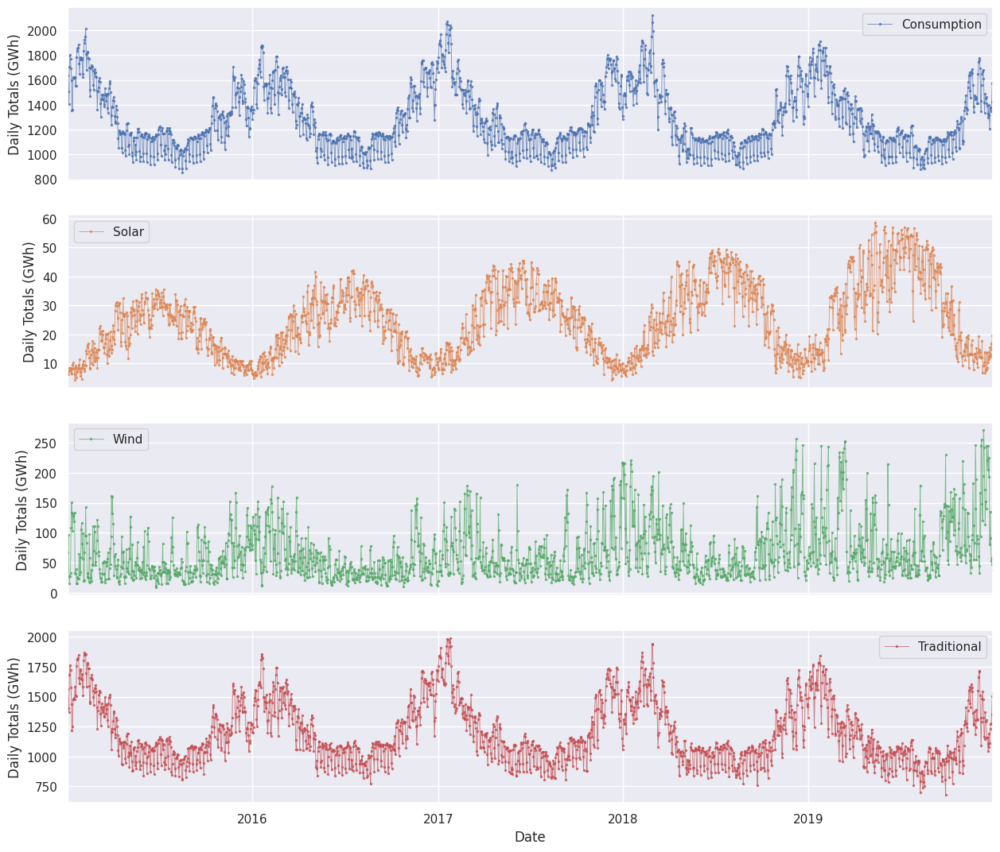

In [ ]:
df["Traditional"] = df["Consumption"] - df["Solar"] - df["Wind"]
cols_plot = ["Consumption", "Solar", "Wind", "Traditional"]
axes = df[cols_plot].plot(
    marker=".",
    markersize=3,
    alpha=0.7,
    linestyle="-",
    figsize=(15, 13),
    subplots=True,
    linewidth=0.7,
)
for ax in axes:
    ax.set_ylabel("Daily Totals (GWh)")

Теперь попробуем провести визуализацию на одном графике, с периодом 1 месяц

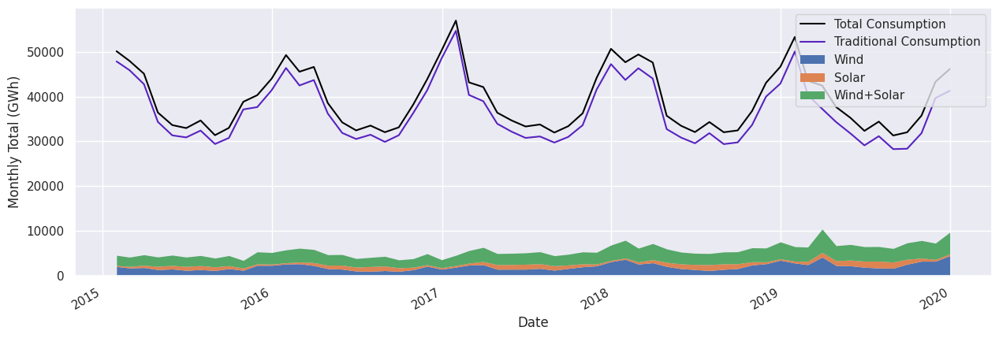

In [ ]:
df_monthly = df.resample("M").sum(min_count=7)

fig, ax = plt.subplots()
ax.plot(
    df_monthly["Consumption"],
    color="black",
    label="Total Consumption",
)
ax.plot(
    df_monthly["Traditional"],
    color="#5723c0",
    label="Traditional Consumption",
)
df_monthly[["Wind", "Solar", "Wind+Solar"]].plot.area(ax=ax, linewidth=0)
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.set_ylabel("Monthly Total (GWh)")
ax.legend()

И дополнительно отдельно глянем на ветровое и солнечное потребление:

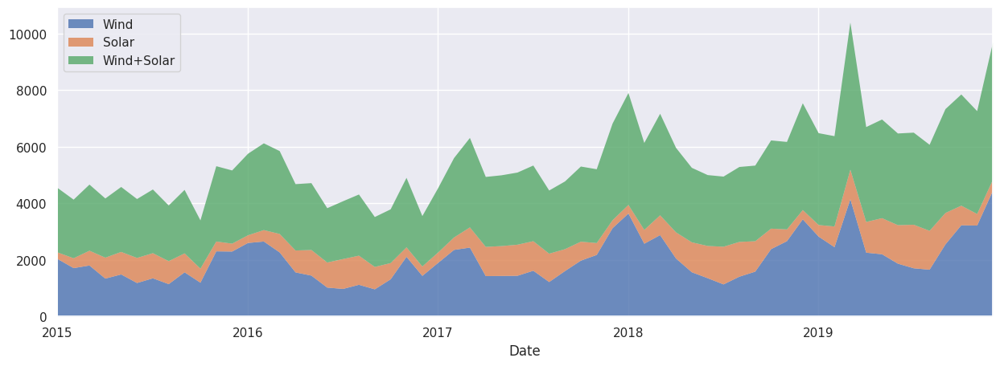

In [ ]:
fig, ax = plt.subplots()
df_monthly[["Wind", "Solar", "Wind+Solar"]].plot.area(
    ax=ax,
    linewidth=0,
    alpha=0.8,
)
ax.legend();

Дополнительно построим графики с ресемплингом в год для примерной оценки тренда:

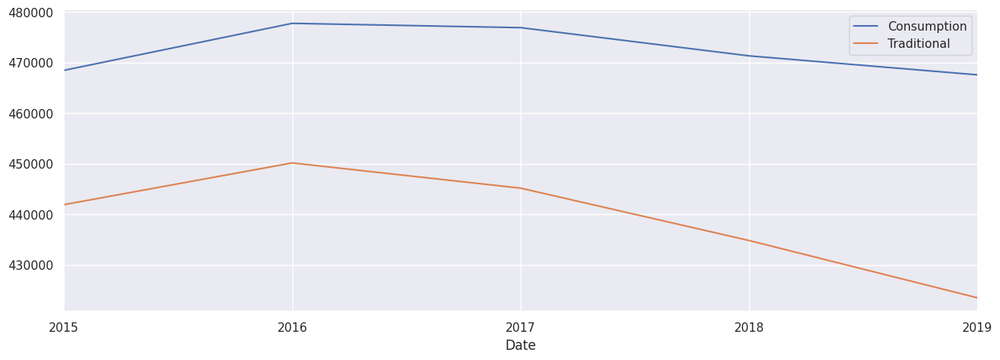

In [ ]:
df.resample("1y").sum()[['Consumption', 'Traditional']].plot.line();

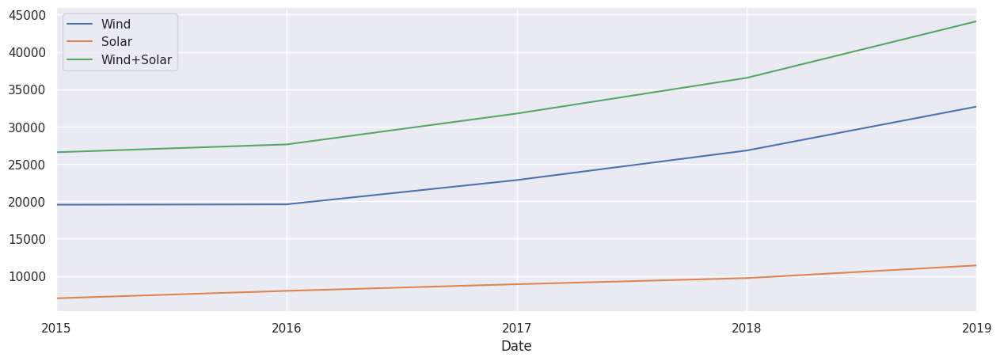

In [ ]:
df.resample("1y").sum()[['Wind', 'Solar', "Wind+Solar"]].plot.line();

Анализ графиков:

1. У всех показателей присутствует сезонность, связанная (вероятно и что звучит крайне логично) с разной погодой в разные времена года.
1. Зимой наблюдается пиковое потребление энергии, летом оно понижается до минимального.
1. Пиковые и минимальные значения совпадают для всех графиков.
1. Доля использования альтернативных источников энергии во Франции достаточно мала (до 10% на каждый источник). Оно в целом и понятно, во Франции очень развита атомная генерация по сравнению со многими странами Европы.
> **[Выжимка из википедии](https://ru.wikipedia.org/wiki/%D0%90%D1%82%D0%BE%D0%BC%D0%BD%D0%B0%D1%8F_%D1%8D%D0%BD%D0%B5%D1%80%D0%B3%D0%B5%D1%82%D0%B8%D0%BA%D0%B0_%D0%A4%D1%80%D0%B0%D0%BD%D1%86%D0%B8%D0%B8)**. Атомная энергетика вырабатывает 70,6 % электроэнергии во Франции. По состоянию на июль 2020 года, Франция имеет 56 действующих промышленных ядерных реакторов суммарной мощностью 61,4 ГВт. По количеству вырабатываемой атомными электростанциями энергии Франция занимает второе место в мире, а по доле атомной энергетики — первое место в мире. Франция является крупнейшим экспортёром электроэнергии в мире.
1. С 2015 года наблюдается некоторое увеличение потребления альтернативных источников небольшое общее снижение снижение потребления. Но и там и там скорость довольно низкая, скорее всего при оценке специальными методами этого будет фактически незаметно.
1. В рамках альтернативных источников энергии преобладает солнечная по сравнению с ветровой.

В качестве целевого временного ряда для анализа выберем **общее потребление**. Посмторим на гистограмму:

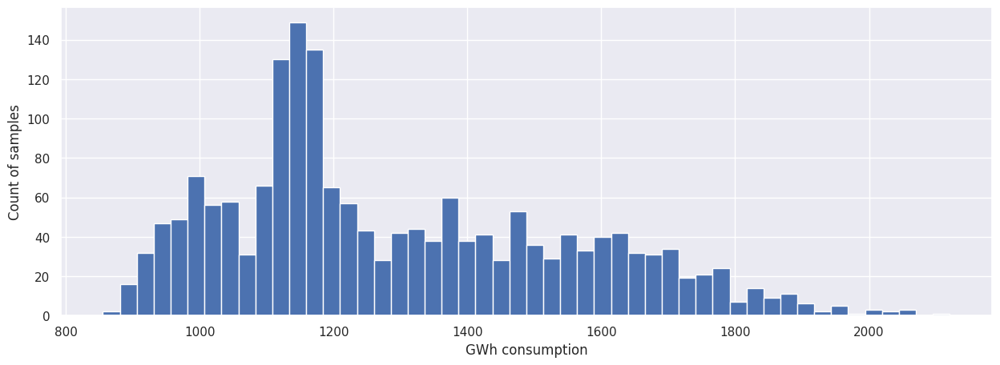

In [ ]:
ax = df.Consumption.hist(bins=50)
ax.set_ylabel('Count of samples')
ax.set_xlabel('GWh consumption')
plt.show()

В распределении мы видим одну ярковыраженную составляющую в районе 1150 ГВт, в остальном распределение достаточно равномерное с небольшим количеством условных выбросов. Может быть я бы смог ещё выделить величину в районе 1000 ГВт, но она не сильно выражена. Возможно, она отвечает за потребление в выходные.

Построим график потребления для периода в 2 месяца, включая начала и конец года:


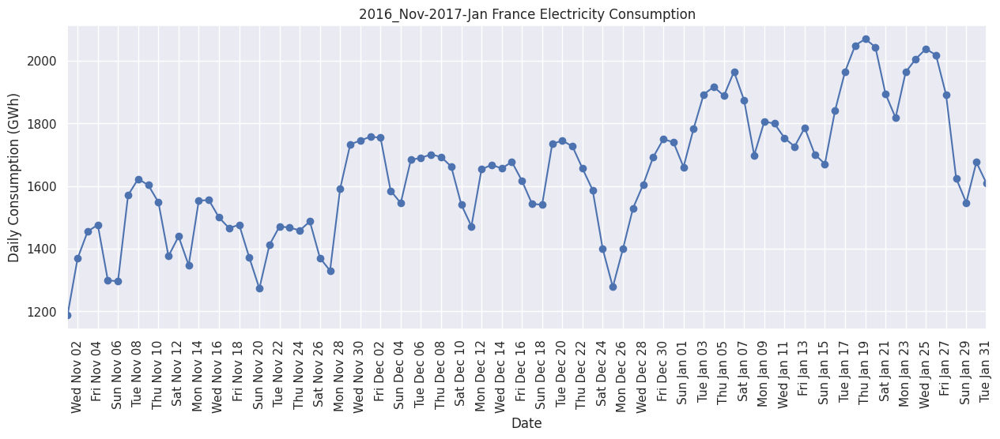

In [ ]:
ax = df.loc['2016-11':'2017-01', 'Consumption'].plot(marker='o', linestyle='-')
ax.set_ylabel('Daily Consumption (GWh)')
ax.set_title('2016_Nov-2017-Jan France Electricity Consumption')
ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%a %b %d'))
plt.xticks(rotation=90)
plt.show()

* Здесь наблюдается достаточно очевидное снижение потребления в выходные (вторая сезонная компонента).
* Забавно, что 25 декабря (католическое рождество) наблюдается самое ярковыраженное снижение потребления.

Построим поближе на общее потребление с ресемплом в неделю:

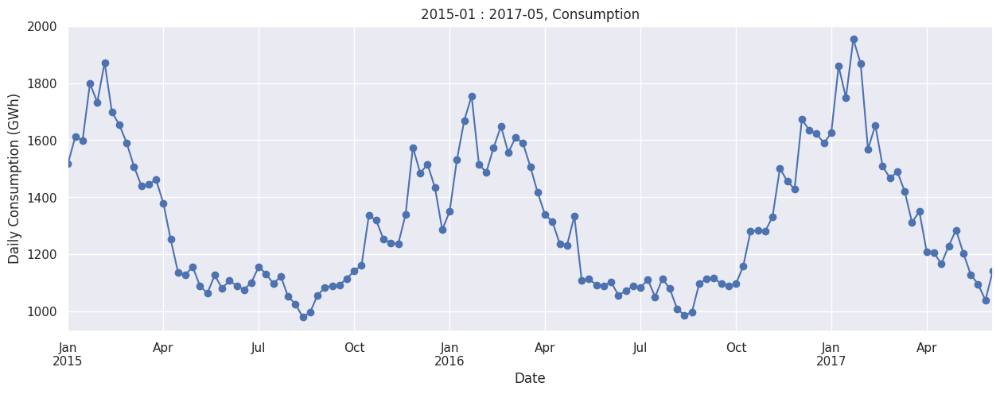

In [ ]:
ax = (
    df.loc["2015-01":"2017-05", "Consumption"]
    .resample("W")
    .mean()
    .plot(
        marker="o",
        linestyle="-",
        linewidth=1.5,
    )
)
ax.set_title("2015-01 : 2017-05, Consumption")
ax.set_ylabel("Daily Consumption (GWh)")
plt.show()

Проверим наличие или отсуствие тренда с помощью скользящего среднего:

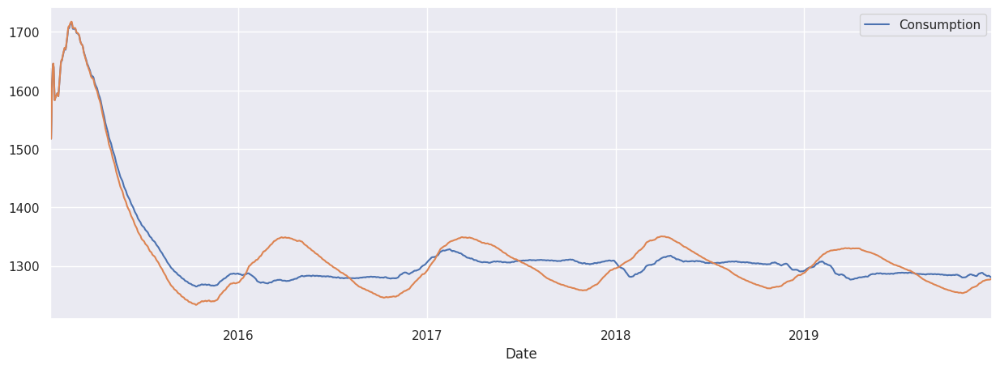

In [ ]:
df[["Consumption"]].rolling("365d").mean().plot();
df.Consumption.ewm(halflife=365, min_periods=0, adjust=True).mean().plot();

Тут тренд, на мой вкус, неочевиден.



Также проверим тренд при помощи построения BBox:

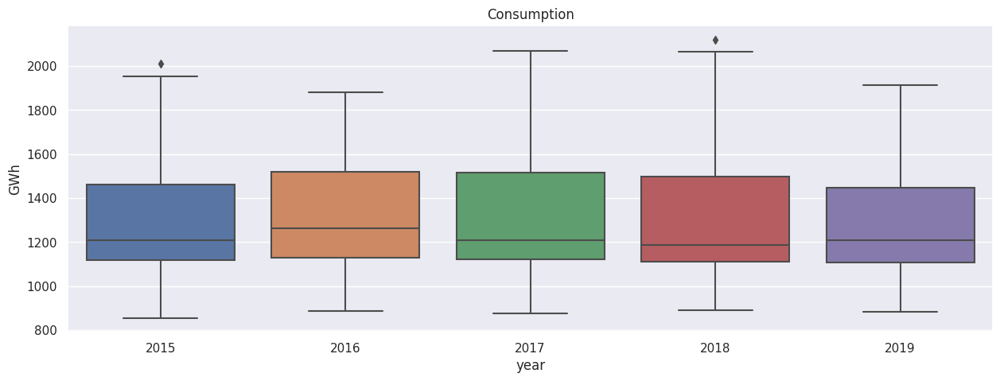

In [ ]:
ax = sns.boxplot(
    data=df,
    x=df.index.year,
    y="Consumption",
)
ax.set_ylabel("GWh")
ax.set_xlabel("year")
ax.set_title("Consumption")
plt.show()

Ну тут будто бы тренда тоже не видно, все средние очень близко, разбросы относительно похожи. Теперь ещё одну картиночку построим про то же самое:

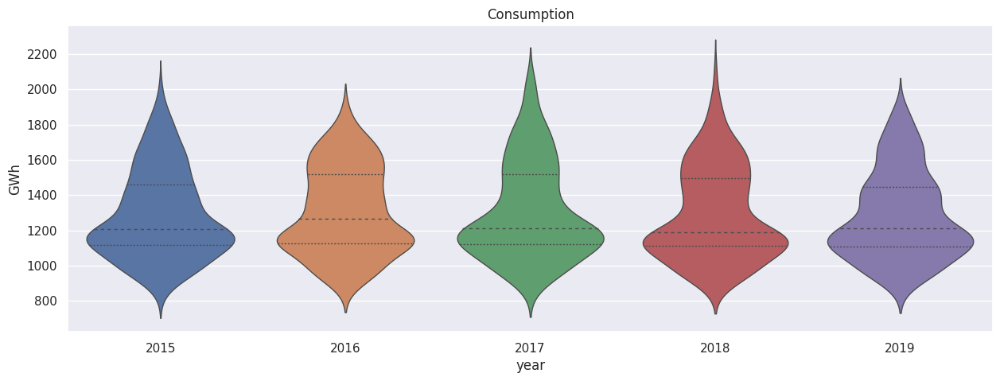

In [ ]:
ax = sns.violinplot(
    data=df,
    x=df.index.year,
    y="Consumption",
    split=True,
    inner="quart",
    linewidth=1,
)
ax.set_ylabel("GWh")
ax.set_xlabel("year")
ax.set_title("Consumption")
plt.show()

Построим в ту же тему барплот:

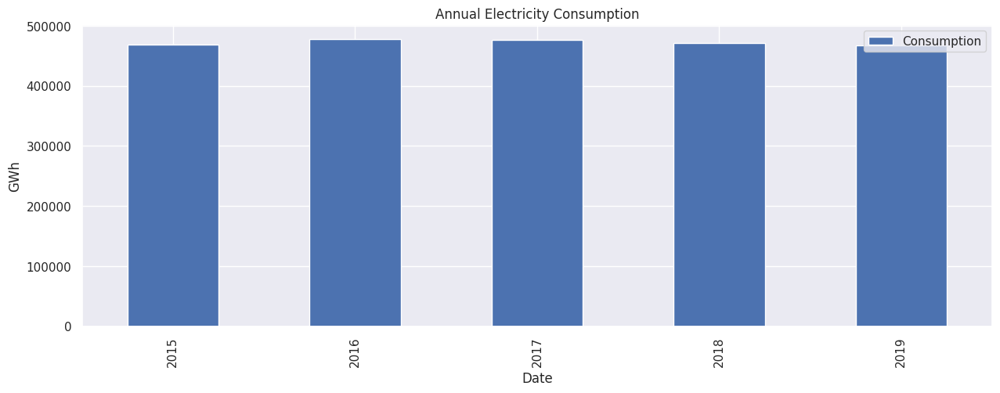

In [ ]:
df_test = df[["Consumption"]].resample("Y").sum()

ax = df_test.set_index(df_test.index.year).plot.bar()
ax.set_title("Annual Electricity Consumption")
ax.set_ylabel("GWh");

Ну тоже особо сильных перепадов не видно. Интересно, как влияет масштаб на восприятие: в самом начале я строил почти такой же график по годам, но зависимость там выражалась линией и была в другом масштабе (по оси y начало координат было не от ноля) – там "тренд" был значительно более заметен. А тут относительно полной картины – фактически не виден.

Проверим наличие сезонных составляющих:
    


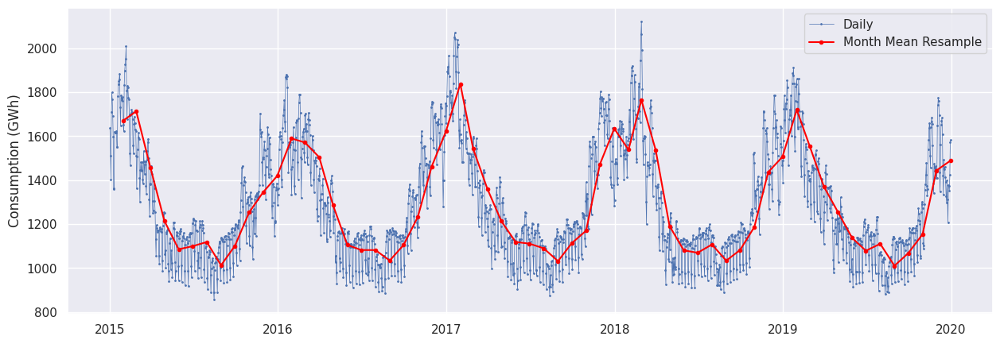

In [ ]:
start, end = "2015-01", "2019-12"

fig, ax = plt.subplots()
ax.plot(
    df.loc[start:end, "Consumption"],
    marker=".",
    markersize=2,
    linestyle="-",
    linewidth=0.5,
    label="Daily",
)
ax.plot(
    df.resample("M").mean().loc[start:end, "Consumption"],
    marker="o",
    markersize=3,
    linestyle="-",
    label="Month Mean Resample",
    color="red",
)
ax.set_ylabel("Consumption (GWh)")
ax.legend();

Видно, что сезонность достаточно заметная и ярковыраженная. Давайте дополнительно построим ещё и коробочки:

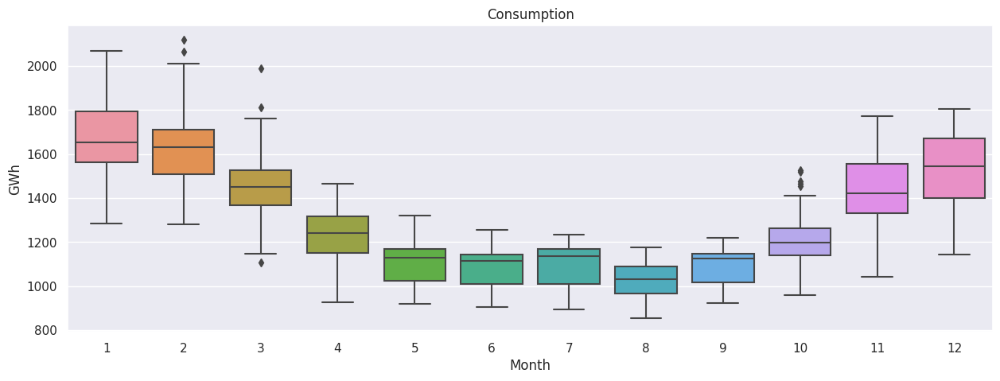

In [ ]:
ax = sns.boxplot(
    data=df,
    x=df.index.month,
    y="Consumption",
)
ax.set_ylabel("GWh")
ax.set_xlabel("Month")
ax.set_title("Consumption")
plt.show();

На коробках тоже видно заметное изменение общего потребления по месяцам: теплые месяцы имеют значительно меньшие средние значения и разбросы по сравнению с холодными месяцами. Интересно, что в июле среди всех летних месяцев есть подъем, возможно связанный с увеличением потребления солнечной генерацией.

Построим график скользящего среднего по годам:

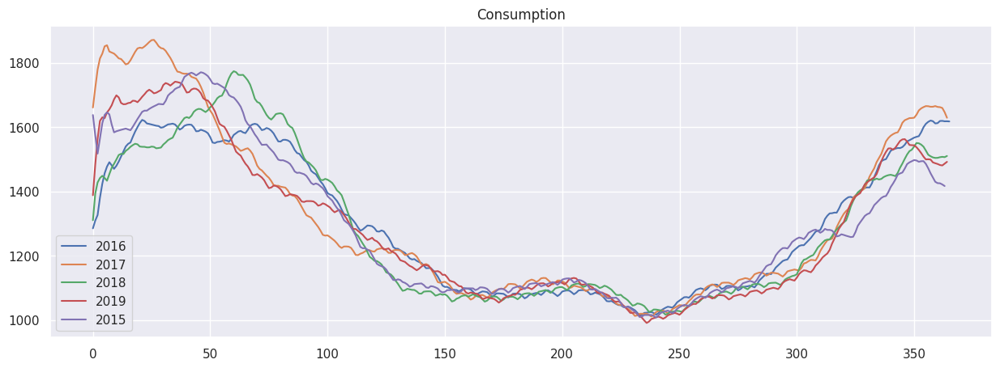

In [ ]:
for year in list(set(df.index.year)):
    plt.plot(
        df.loc[
            str(year) : str(year),
            "Consumption",
        ]
        .rolling("30d")
        .mean()
        .values,
        label=year,
    )
plt.title("Consumption")
plt.legend();

Наиболее сильно графики расходятся в зимние дни, в то время как летом они лежат очень близко. Наблюдаем нестационарность сезонности по годам.

Также оценим сезонность дней недели:

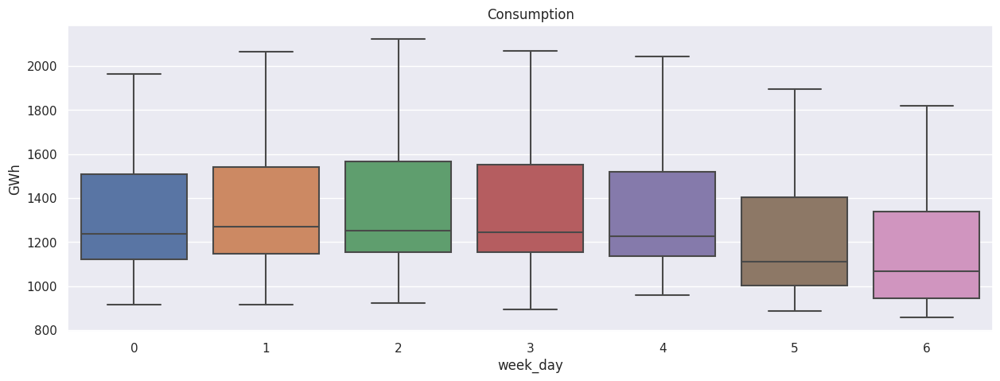

In [ ]:
ax = sns.boxplot(
    data=df,
    x=df.index.weekday,
    y="Consumption",
)
ax.set_ylabel("GWh")
ax.set_xlabel("week_day")
ax.set_title("Consumption");

Тут очевиден уже сделанный вывод о том, что в выходные потребление электроэнергии заметно снижено по сравнению с рабочими днями. Люди отдыхают :)

## 1.4. Вывод по разделу

Во Франции можно сделать следующие выводы по общему потреблению электроэнергии:

1. Точно есть сезонность (разные виды). Чтобы привести ряд к стационарному от неё нужно будет избавиться.
1. Тренд не выражен, потребление достаточно стабильное.
1. В выходные дни (в том числе праздники) потребление снижено относительно рабочих дней.

# 2. Простые предсказания



## 2.1. Необходимые импорты

In [ ]:
try:
    import sktime
except:
    print("Start sktime[all_extras] instalation")
    !pip install --quiet --upgrade sktime[all_extras]
    print("sktime[all_extras] was installed")
import sktime

Start sktime[all_extras] instalation
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.7/21.7 MB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.9/122.9 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.7/981.7 kB 46.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 45.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 745.0/745.0 kB 42.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 40.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 kB 4.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/1

In [ ]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sktime
from statsmodels.tools.sm_exceptions import ConvergenceWarning

warnings.simplefilter("ignore", ConvergenceWarning)

from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.compose import (
    EnsembleForecaster,
    MultiplexForecaster,
    TransformedTargetForecaster,
    make_reduction,
)
from sktime.forecasting.exp_smoothing import ExponentialSmoothing
from sktime.forecasting.fbprophet import Prophet
from sktime.forecasting.model_evaluation import evaluate
from sktime.forecasting.model_selection import (
    ExpandingWindowSplitter,
    ForecastingGridSearchCV,
    SlidingWindowSplitter,
    temporal_train_test_split,
)
from sktime.forecasting.naive import NaiveForecaster
from sktime.forecasting.tbats import TBATS
from sktime.forecasting.theta import ThetaForecaster
from sktime.forecasting.trend import PolynomialTrendForecaster
from sktime.performance_metrics.forecasting import (
    MeanAbsolutePercentageError,
    MeanSquaredError,
)
from sktime.transformations.panel.tsfresh import TSFreshFeatureExtractor
from sktime.transformations.series.detrend import Deseasonalizer, Detrender
from sktime.utils.plotting import plot_series

smape = MeanAbsolutePercentageError(symmetric=True)
rmse = MeanSquaredError(square_root=True)

from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.pipeline import make_pipeline

# r2_score = lambda y_pred, y_test: 1 - np.sum(np.square(y_pred - y_test)) / np.sum(
#     np.square(y_test - np.mean(y_test))
# )

warnings.simplefilter("ignore", FutureWarning)

## 2.2. Загрузка данных

Для начала загрузим табличку (для удобства воткну эту ячейку и сюда):

In [ ]:
df = pd.read_csv(
    CSV_PATH,
    parse_dates=["Date"],
    index_col="Date",
)
df.ffill(inplace=True)
df.dropna(inplace=True)
df

,Consumption,Wind,Solar,Wind+Solar
Date,,,,
2015-01-02,1637.422,67.921,7.255,75.176
2015-01-03,1510.660,96.577,6.270,102.847
2015-01-04,1404.165,27.539,7.294,34.833
2015-01-05,1708.152,16.511,8.474,24.985
2015-01-06,1798.834,28.357,7.814,36.171
...,...,...,...,...
2019-12-27,1374.587,91.967,13.192,105.159
2019-12-28,1350.615,53.403,16.869,70.272
2019-12-29,1424.184,58.537,14.700,73.237


Теперь определим целевую переменную. Как и в прошлом пункте, это будет общее потребление, но по аналогии с учебным примером пересемплируем с шагом в неделю, чтобы избавиться от "быстрой" сезонной составляющей:

In [ ]:
y = df.Consumption.asfreq('7d')
y

Date
2015-01-02    1637.422
2015-01-09    1595.898
2015-01-16    1624.367
2015-01-23    1884.012
2015-01-30    1778.814
                ...   
2019-11-29    1463.675
2019-12-06    1693.821
2019-12-13    1607.271
2019-12-20    1390.337
2019-12-27    1374.587
Freq: 7D, Name: Consumption, Length: 261, dtype: float64

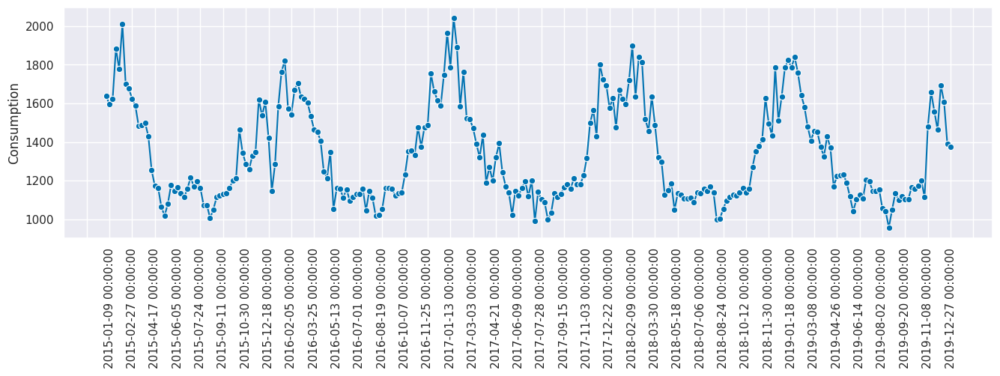

In [ ]:
fig, ax = sktime.utils.plotting.plot_series(y)
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
plt.xticks(rotation=90);

Разобьем на тренировочную и тестовую выборки:

Check splitted data size: Train: 144, Test: 117


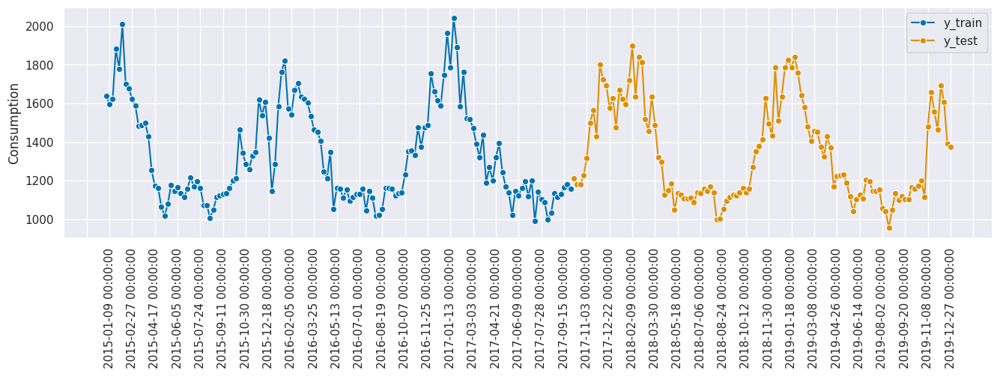

In [ ]:
TEST_SIZE = int(0.45 * y.size)

y_train, y_test = temporal_train_test_split(
    y,
    test_size=TEST_SIZE,
)

print(
    "Check splitted data size: "
    f"Train: {y_train.shape[0]}, Test: {y_test.shape[0]}"
)

fig, ax = sktime.utils.plotting.plot_series(
    y_train,
    y_test,
    labels=["y_train", "y_test"],
)
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
plt.xticks(rotation=90);

Определим горизонт предсказаний:

In [ ]:
fh = ForecastingHorizon(y_test.index, is_relative=False)
fh

ForecastingHorizon(['2017-10-06', '2017-10-13', '2017-10-20', '2017-10-27',
               '2017-11-03', '2017-11-10', '2017-11-17', '2017-11-24',
               '2017-12-01', '2017-12-08',
               ...
               '2019-10-25', '2019-11-01', '2019-11-08', '2019-11-15',
               '2019-11-22', '2019-11-29', '2019-12-06', '2019-12-13',
               '2019-12-20', '2019-12-27'],
              dtype='datetime64[ns]', length=117, freq='7D', is_relative=False)

Чтобы постоянно не повторять один и тот же код для рисунков и оценки метрики, зададим соответствующую функцию:

In [ ]:
def fit_predict_plot(forecaster) -> None:
    forecaster.fit(y_train)

    y_pred = forecaster.predict(fh)
    fig, ax = plot_series(
        y_train,
        y_test,
        y_pred,
        labels=["y_train", "y_test", "y_pred"],
    )
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
    plt.xticks(rotation=90)

    print(f"sMAPE = {smape(y_pred.values, y_test.values):.3f}")

## 2.3. По последнему значению

sMAPE = 0.163


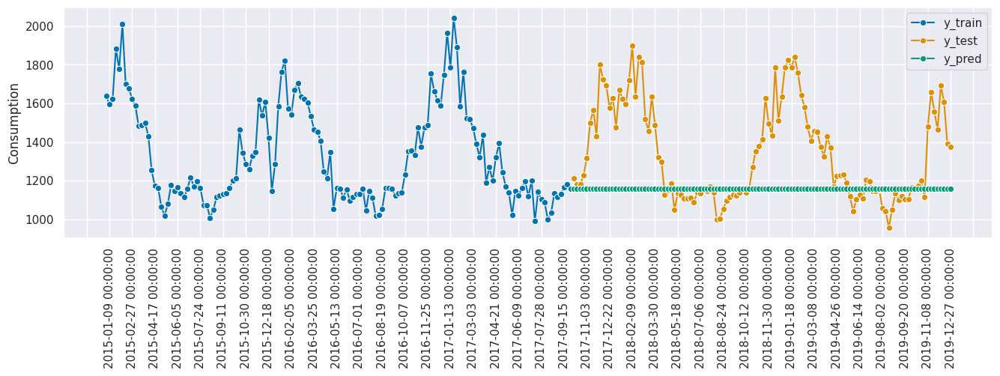

In [ ]:
forecaster = NaiveForecaster(strategy="last")
fit_predict_plot(forecaster)

### Вывод

Как и ожидалось, ошибка огромная, ну и график – откровенно мимо.

## 2.4. NaiveForecaster

Учтем сезонность (в данном случае 52, так как развертка по неделям) и посмотрим на предсказание:

sMAPE = 0.064


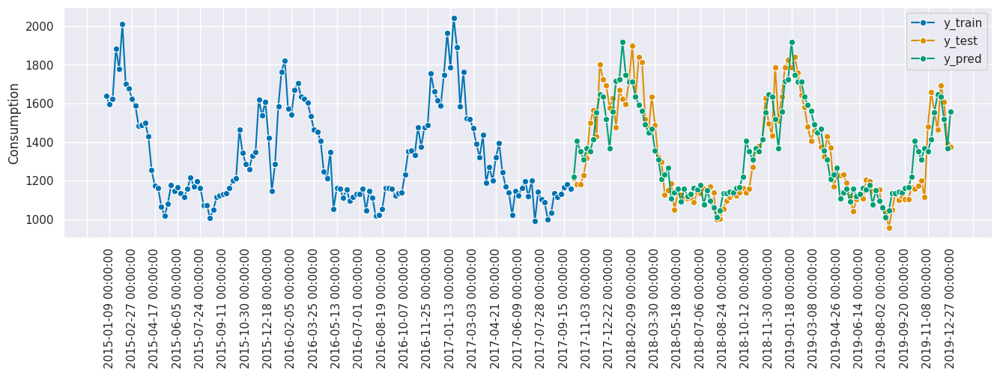

In [ ]:
SEASON = 52

forecaster = NaiveForecaster(strategy="mean", sp=SEASON)
fit_predict_plot(forecaster)

### Вывод
Ну штош, уже значительно приятнее, условно на порядок улучшили предсказание по сравнению с "бэйзлайном". Ну и график стал хотя бы частично учитывать сезонность. Не идеально, кое-где запаздывает, но в целом приемлемо.

## 2.5. Экспоненциальное сглаживание


Сначала зададим модельки и будем выбирать наиболее подходящие:

In [ ]:
ses = ExponentialSmoothing(sp=SEASON)
holt = ExponentialSmoothing(
    trend="add",
    damped_trend=False,
    sp=SEASON,
)
damped_holt = ExponentialSmoothing(
    trend="add",
    damped_trend=True,
    sp=SEASON,
)
holt_winter = ExponentialSmoothing(
    trend="add",
    seasonal="additive",
    sp=SEASON,
)
holt_winter_add_boxcox = ExponentialSmoothing(
    trend="add",
    seasonal="additive",
    use_boxcox=True,
    sp=SEASON,
)
holt_winter_mul_boxcox = ExponentialSmoothing(
    trend="mul",
    seasonal="additive",
    use_boxcox=True,
    sp=SEASON,
)
holt_winter_sadd_boxcox = ExponentialSmoothing(
    trend="add",
    seasonal="mul",
    use_boxcox=True,
    sp=SEASON,
)
holt_winter_smul_boxcox = ExponentialSmoothing(
    trend="mul",
    seasonal="mul",
    use_boxcox=True,
    sp=SEASON,
)

Предсказываем:

sMAPE = 0.071


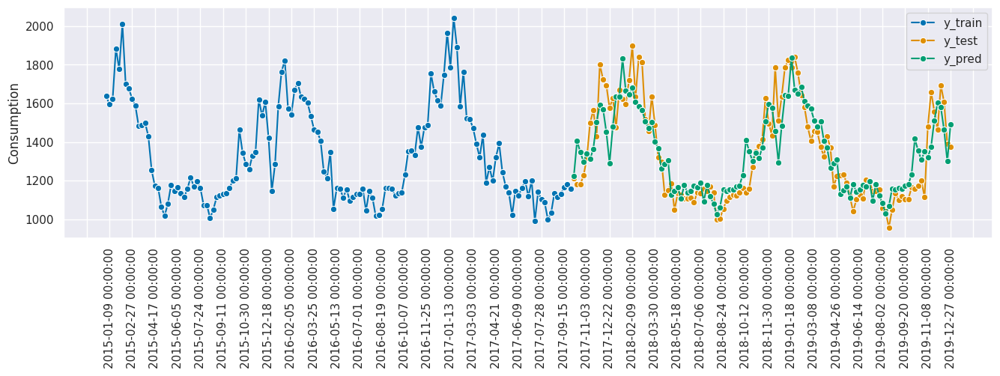

In [ ]:
forecaster = holt_winter
fit_predict_plot(forecaster)

### Вывод
В результате перебора получилось, что из представленных моделек лучше всего себя показывает классический `holt_winter` с метрикой `sMAPE = 0.071`. Тем не менее, предсказание всё ещё получилось хуже, чем в случае `NaiveForecaster` с учетом сезонности.

## 2.6. Ансамбль моделей

Переберем комбинации моделек:

sMAPE = 0.071


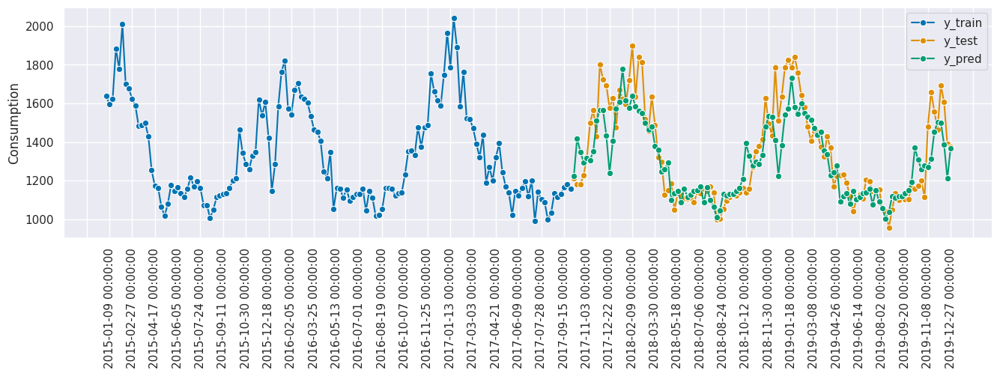

In [ ]:
forecaster = EnsembleForecaster(
    [
        # ("ses", ses),
        # ("holt", holt),
        # ("damped", damped_holt),
        ("holt-winter",holt_winter),
        # ("holt-winter, additive trend, box-cox", holt_winter_add_boxcox),
        ("holt-winter, multiplicative trend, box-cox", holt_winter_mul_boxcox),
        # ("holt-winter, multiplicative season, box-cox", holt_winter_sadd_boxcox),
        # ("holt-winter, multiplicative both, box-cox", holt_winter_smul_boxcox),
    ]
)
fit_predict_plot(forecaster)

### Вывод
Перебор не сказать, чтобы задался: улучшить метрику не получилось вообще, я смог только лишь добиться той же метрики, что и при использовании одного лишь Холтера-Винтера. Ну и метрика всё еще хуже наивного предсказания с учетом сезонности.

## 2.7. Автоподбор параметров экспоненциального сглаживания

sMAPE = 0.066


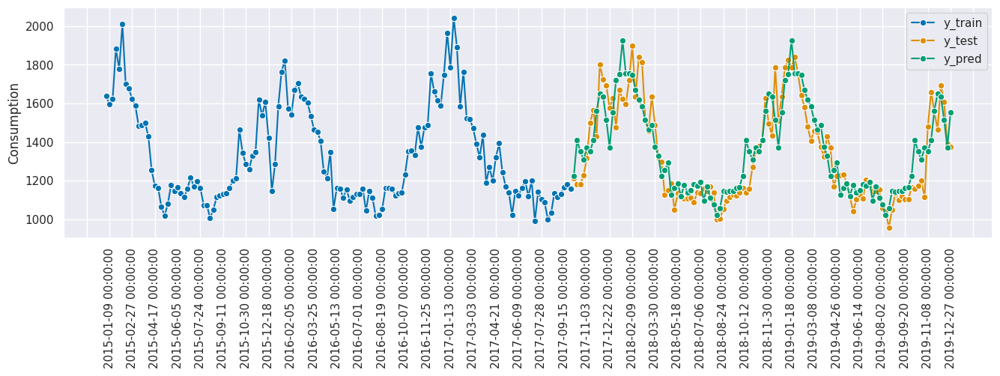

In [ ]:
from sktime.forecasting.ets import AutoETS

forecaster = AutoETS(
    auto=True,
    sp=SEASON,
    n_jobs=-1,
)
fit_predict_plot(forecaster)

### Вывод

Ну штош, параметры действительно удалось подобрать лучше, чем вручную (`sMAPE = 0.066`), но всё ещё хуже наивного предсказания с учетом сезонности (`sMAPE = 0.064`).

## 2.8. Разбиение ряда на компоненты

Сначала посмотрим для всего графика:

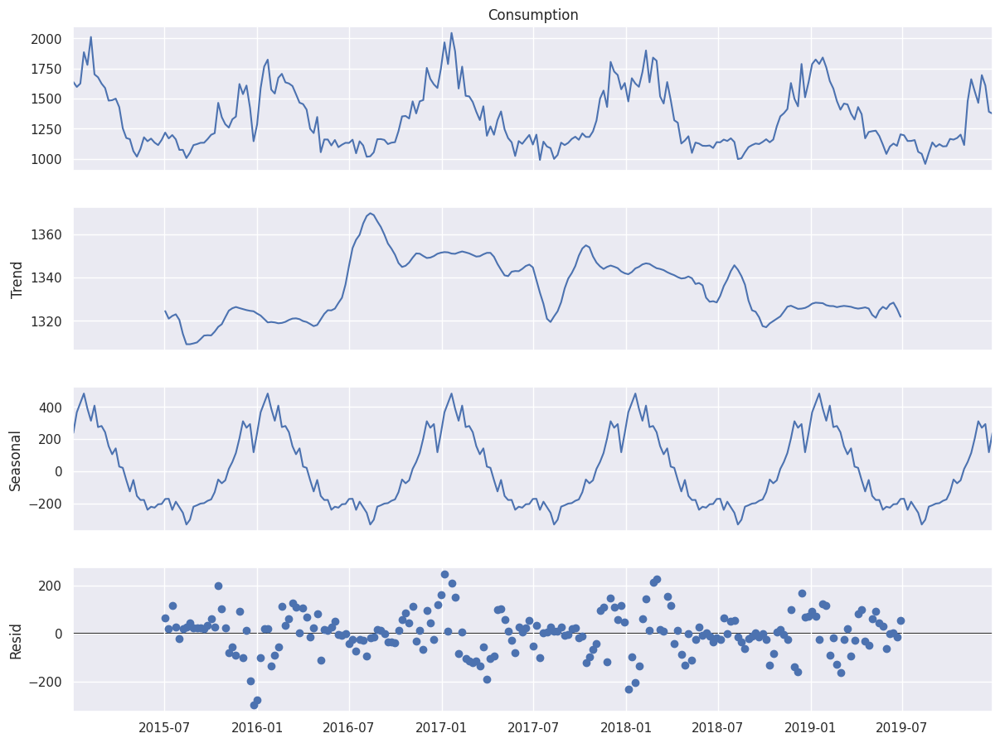

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(
    y,
    model="additive",
    period=SEASON,
)
fig = result.plot()
fig.set_size_inches((12, 10))
plt.show()

А теперь только для трейна:

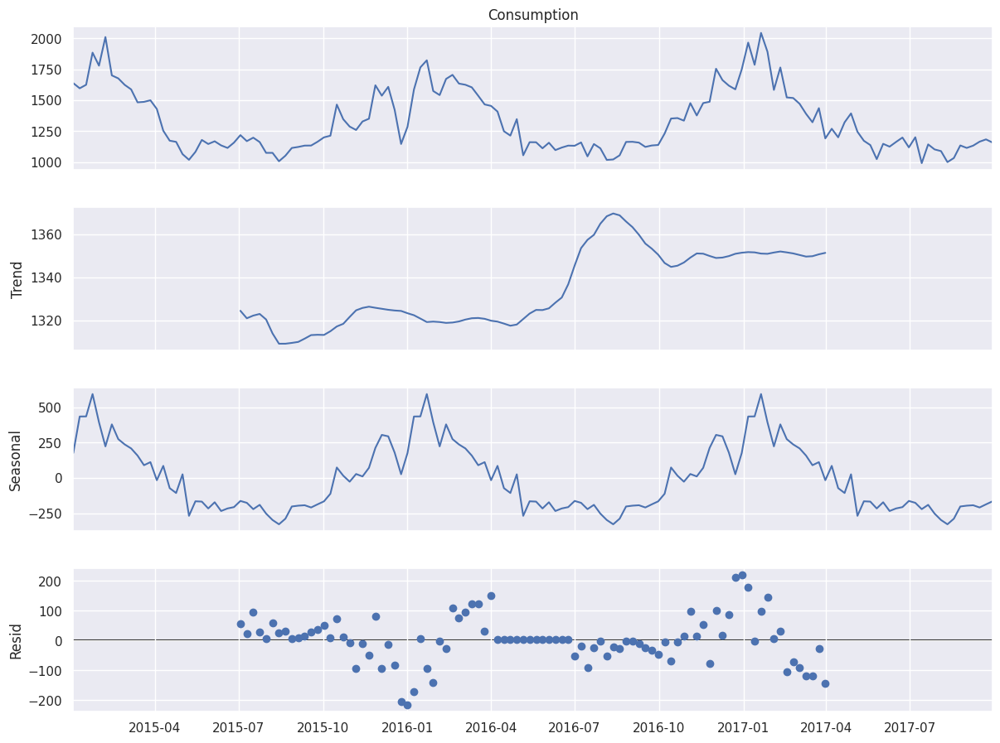

In [ ]:
result = seasonal_decompose(
    y_train,
    model="additive",
    period=SEASON,
)
fig = result.plot()
fig.set_size_inches((12, 10))
plt.show()

И ещё раз про то же самое:

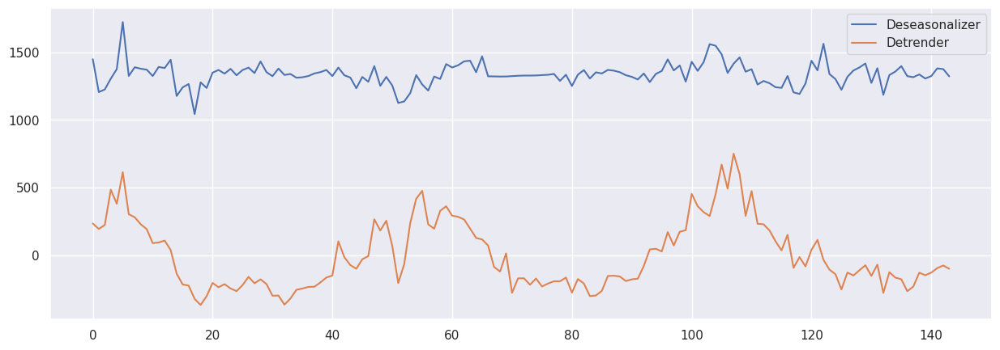

In [ ]:
deseason = Deseasonalizer(model="multiplicative", sp=SEASON)
detrend = Detrender(forecaster=PolynomialTrendForecaster(degree=1))
plt.plot(deseason.fit_transform(y_train.values), label="Deseasonalizer",)
plt.plot(detrend.fit_transform(y_train.values), label="Detrender",)
plt.legend();

Краткий вывод: я бы сказал, что тренд почти не заметен и болтается в достаточно узких пределах. Наблюдается достаточно немало остатков (хотя тут мне сложно судить, не с чем сравнивать).

### TransformedTargetForecaster

sMAPE = 0.074


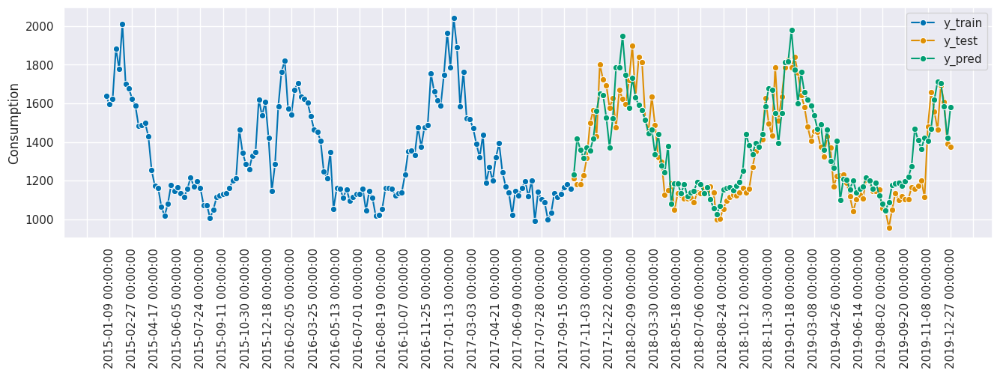

In [ ]:
fh = ForecastingHorizon(y_test.index, is_relative=False)

ses = ExponentialSmoothing()

forecaster = TransformedTargetForecaster(
    steps=[
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=SEASON)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=2))),
        ("forecaster", ses),
    ],
)
fit_predict_plot(forecaster)

### Вывод

Ну штош, чуда не случилось, метрика получилась хуже, чем в предыдущих пунктах. Пробуем следующие варианты.
> Интересно, что в некоторой степени моделька скомбинировала два зимних горба из трейна и переложила их на тест два раза с совсем небольшими изменениями.

## 2.9. KNeighborsRegressor

Попробуем ближайших соседей. Для начала подберем окно регрессии:

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

sMAPE_list = []
reg_window_list = []

for reg_window in range (1, 100 + 1):

    regressor = KNeighborsRegressor(n_neighbors=1)
    forecaster = make_reduction(
        regressor,
        window_length=reg_window,
        strategy="recursive",
    )

    forecaster.fit(y_train)

    y_pred = forecaster.predict(fh)
    sMAPE = smape(y_pred.values, y_test.values)
    sMAPE_list.append(sMAPE)
    reg_window_list.append(reg_window)
    if reg_window % 7 == 0:
        print(
            f"sMAPE = {sMAPE:.3f}, "
            f"reg_window = {reg_window}"
        )

sMAPE = 0.198, reg_window = 7
sMAPE = 0.081, reg_window = 14
sMAPE = 0.081, reg_window = 21
sMAPE = 0.081, reg_window = 28
sMAPE = 0.081, reg_window = 35
sMAPE = 0.078, reg_window = 42
sMAPE = 0.097, reg_window = 49
sMAPE = 0.077, reg_window = 56
sMAPE = 0.077, reg_window = 63
sMAPE = 0.077, reg_window = 70
sMAPE = 0.074, reg_window = 77
sMAPE = 0.077, reg_window = 84
sMAPE = 0.085, reg_window = 91
sMAPE = 0.091, reg_window = 98


Построим график метрики в зависимости от окна регрессии:

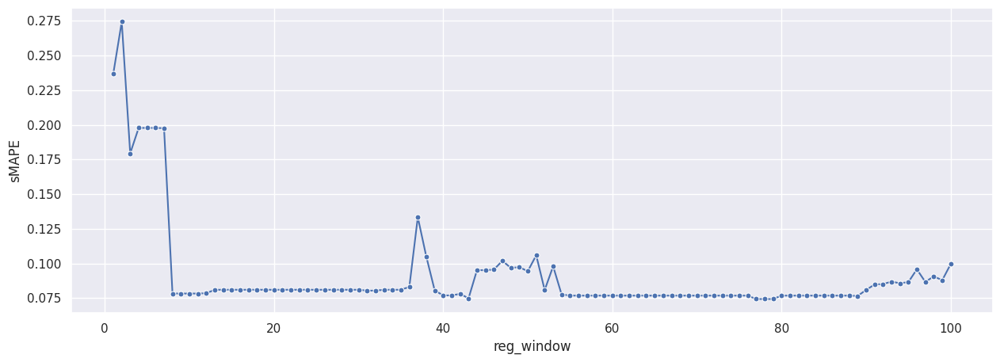

In [ ]:
sns.lineplot(
    x=reg_window_list,
    y=sMAPE_list,
    marker=".",
    markersize=10,
);
plt.xlabel("reg_window");
plt.ylabel("sMAPE");

Попробуем построить графики для наиболее интересных точек:

sMAPE = 0.274


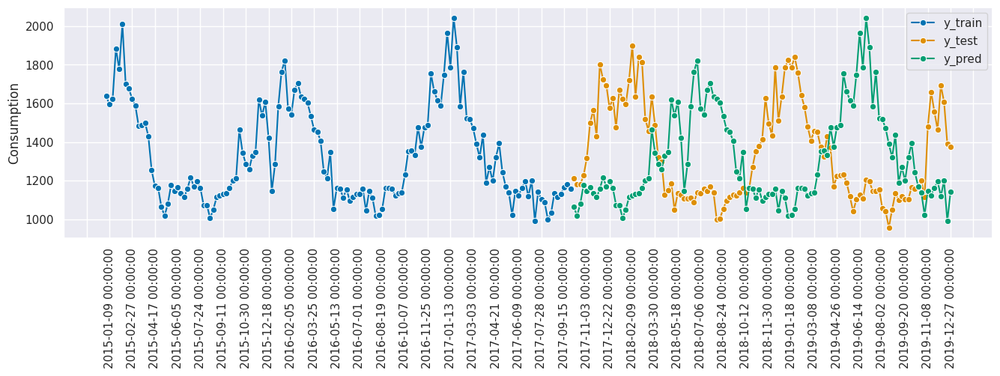

In [ ]:
REGRESSION_WINDOW = 2 # Худшая метрика

regressor = KNeighborsRegressor(n_neighbors=1)
forecaster = make_reduction(
    regressor,
    window_length=REGRESSION_WINDOW,
    strategy="recursive",
)
fit_predict_plot(forecaster)

Как всё весело)) Тут видим смещение буквально на сезон, отчего ошибка и достигает максимума.

sMAPE = 0.078


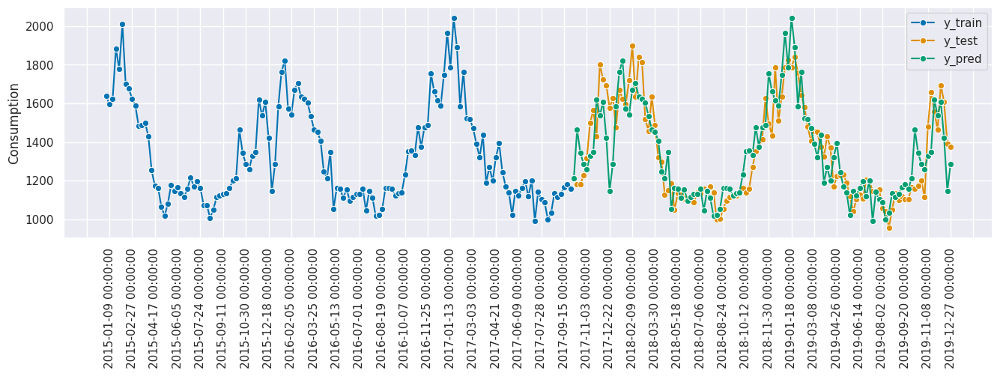

In [ ]:
REGRESSION_WINDOW = 9 # Лучшая метрика для минимального значения окна

regressor = KNeighborsRegressor(n_neighbors=1)
forecaster = make_reduction(
    regressor,
    window_length=REGRESSION_WINDOW,
    strategy="recursive",
)
fit_predict_plot(forecaster)

Ну уже лучше, но видно, что фактически тупо скопипащен паттерн с предыдущих двух горбов, причем в том же порядке.

sMAPE = 0.074


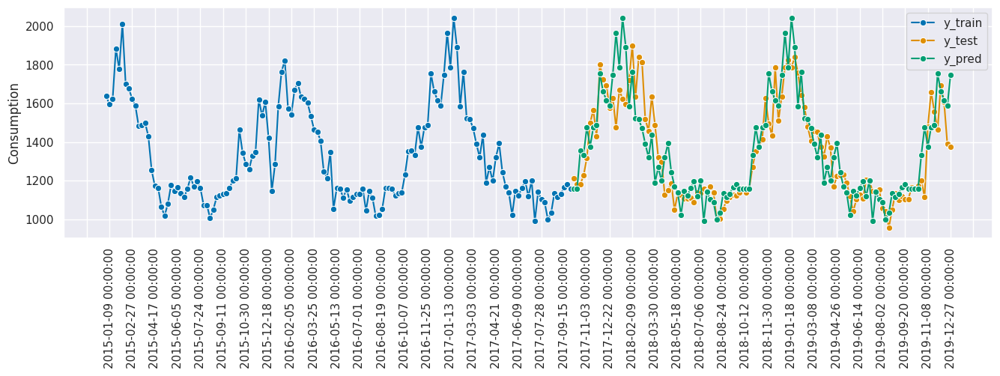

In [ ]:
REGRESSION_WINDOW = 77 # Лучшая метрика

regressor = KNeighborsRegressor(n_neighbors=1)
forecaster = make_reduction(
    regressor,
    window_length=REGRESSION_WINDOW,
    strategy="recursive",
)
fit_predict_plot(forecaster)

Здесь действительно будто бы неплохо, но уже скопипащен паттерн с последнего горба из трейна.

### Вывод

В любом случае (даже с учетом подбора параметров) регрессия ближних соседей не особо справилась и не позволила улучшить метрики относительно предыдущих запусков.

## 2.10. TBATS

sMAPE = 0.063


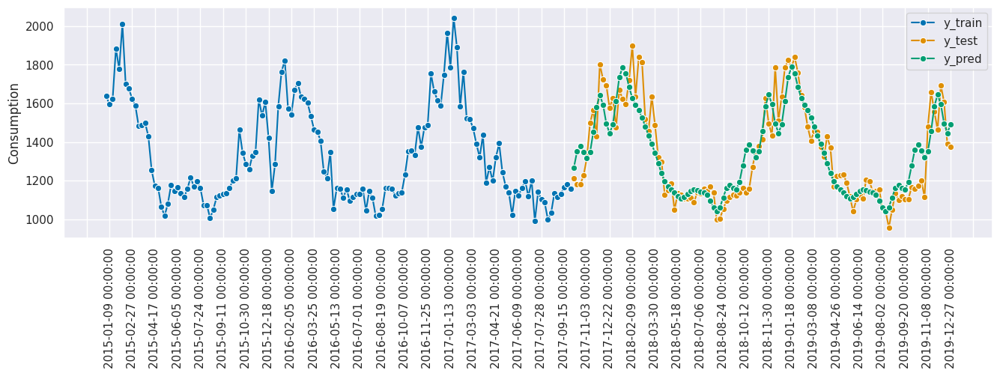

In [ ]:
forecaster = TBATS(
    use_box_cox=True,
    use_trend=True,
    use_damped_trend=True,
    sp=SEASON,
    use_arma_errors=True,
    n_jobs=-1,
)
fit_predict_plot(forecaster)

### Вывод
Оп, у нас появилось улучшение относительно наивного предсказания с учетом сезонности. Но улучшение не то, чтобы сильное, всего на 0.001 единицу sMAPE.

## 2.11. Prophet

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpesn97hf3/fz7xa1ek.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpesn97hf3/v8gy_u_p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57941', 'data', 'file=/tmp/tmpesn97hf3/fz7xa1ek.json', 'init=/tmp/tmpesn97hf3/v8gy_u_p.json', 'output', 'file=/tmp/tmpesn97hf3/prophet_modelbou863vy/prophet_model-20240101082122.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:21:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:21:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


sMAPE = 0.060


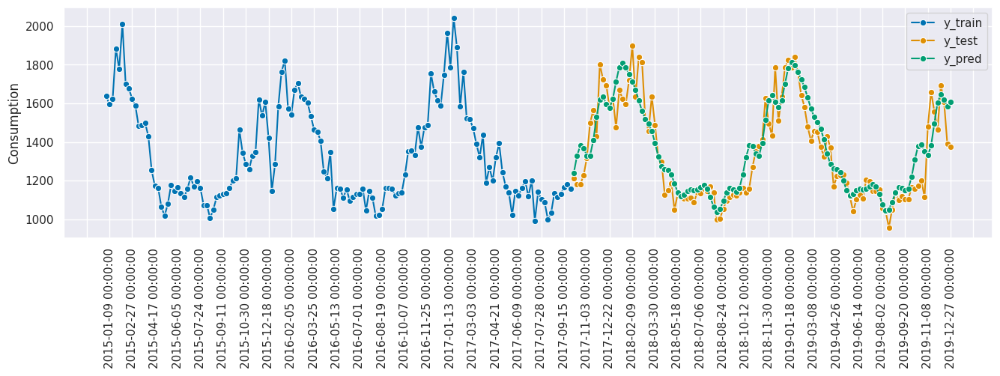

In [ ]:
forecaster = Prophet(
    seasonality_mode="additive",
    n_changepoints=int(len(y_train) / 4),
    add_country_holidays={"country_name": "France"},
    yearly_seasonality=True,
)
fit_predict_plot(forecaster)

### Вывод
Как и ожидалось, Prophet отработал лучше всего с метрикой 0.060. Но всё равно в учебном примере он отработал на 0.030.

## 2.12. Вывод по простым предсказаниям

Лучше всего справился Prophet но на удивление наивное предсказание с учетом сезонности очень долго держалось в лидерах: очень немного моделек смогли к нему подобраться.

# 3. SARIMA

## 3.1. Импорты, загрузка и разбиение датасета

In [2]:
try:
    import sktime
except:
    print("Start sktime[all_extras] instalation")
    !pip install --quiet --upgrade sktime[all_extras]
    print("sktime[all_extras] was installed")
import sktime

Start sktime[all_extras] instalation
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.7/21.7 MB 24.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.9/122.9 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.7/981.7 kB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 28.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 745.0/745.0 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 30.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 kB 4.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/1

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
import pmdarima as pm

from sktime.utils.plotting import plot_series
from sktime.forecasting.sarimax import SARIMAX
from sktime.forecasting.arima import AutoARIMA
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.model_selection import temporal_train_test_split

from sktime.performance_metrics.forecasting import  MeanAbsolutePercentageError, MeanSquaredError
smape = MeanAbsolutePercentageError(symmetric=True)
rmse  = MeanSquaredError(square_root=True)
r2_score = lambda y_pred, y_test: 1 - np.sum(np.square(y_pred - y_test)) / np.sum(
    np.square(y_test - np.mean(y_test))
)
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
warnings.filterwarnings("ignore")

In [6]:
df = pd.read_csv(
    CSV_PATH,
    parse_dates=["Date"],
    index_col="Date",
)
df.ffill(inplace=True)
df.dropna(inplace=True)
y = df.Consumption.asfreq('7d')
y

Date
2015-01-02    1637.422
2015-01-09    1595.898
2015-01-16    1624.367
2015-01-23    1884.012
2015-01-30    1778.814
                ...   
2019-11-29    1463.675
2019-12-06    1693.821
2019-12-13    1607.271
2019-12-20    1390.337
2019-12-27    1374.587
Freq: 7D, Name: Consumption, Length: 261, dtype: float64

Check splitted data size: Train: 144, Test: 117


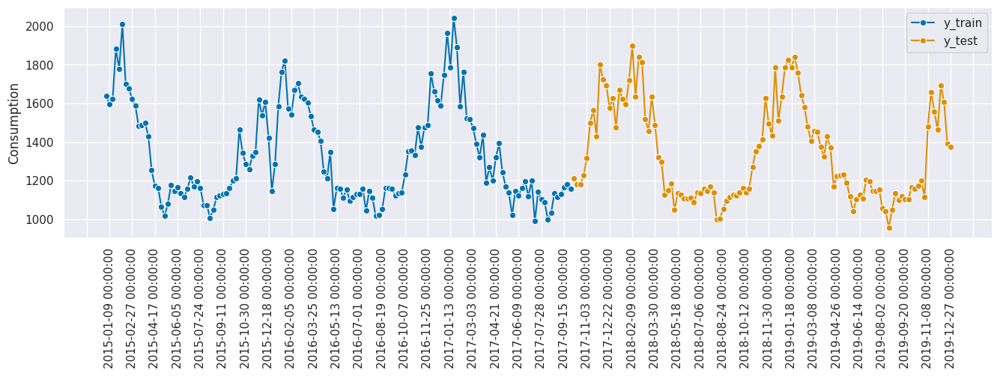

In [7]:
TEST_SIZE = int(0.45 * y.size)

y_train, y_test = temporal_train_test_split(
    y,
    test_size=TEST_SIZE,
)

print(
    "Check splitted data size: "
    f"Train: {y_train.shape[0]}, Test: {y_test.shape[0]}"
)

fig, ax = sktime.utils.plotting.plot_series(
    y_train,
    y_test,
    labels=["y_train", "y_test"],
)
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
plt.xticks(rotation=90);

In [8]:
fh = ForecastingHorizon(
    y_test.index,
    is_relative=False,
)
fhin = ForecastingHorizon(
    y_train.index[1:],
    is_relative=False,
)


def fit_predict_plot(forecaster) -> None:
    forecaster.fit(y_train)

    y_pred = forecaster.predict(fh)
    fig, ax = plot_series(
        y_train,
        y_test,
        y_pred,
        labels=["y_train", "y_test", "y_pred"],
    )
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
    plt.xticks(rotation=90)
    print(f"sMAPE = {smape(y_pred.values, y_test.values):.3f}")


def fit_predict_plot_sarima(forecaster) -> None:
    y_in_samples = forecaster.predict(fhin)

    fhout = ForecastingHorizon(
        y_test.index,
        is_relative=False,
    )
    y_out = forecaster.predict(fhout)

    fig, ax = plot_series(
        y_train,
        y_test,
        y_in_samples,
        y_out,
        labels=[
            "y_train",
            "y_test",
            "y_in_samples",
            "y_out_samples",
        ],
    )
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
    plt.xticks(rotation=90)
    print(f"sMAPE = {smape(y_out.values, y_test.values):.3f}")

## 3.2. Проверка на стационарность

Оценим визуально:

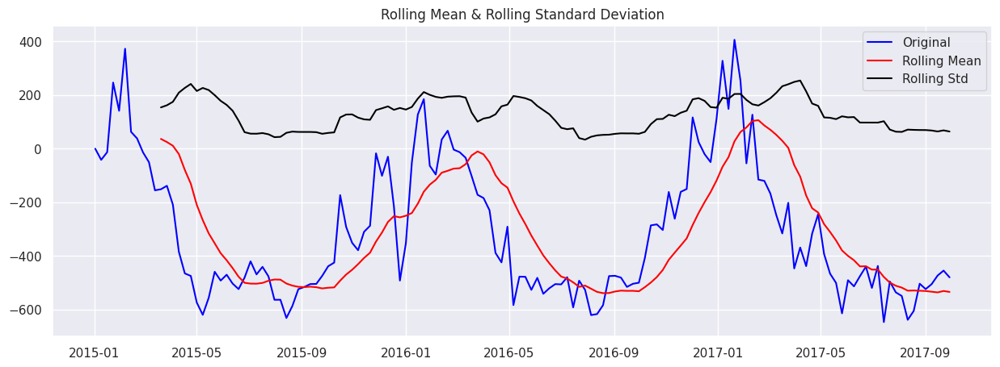

In [9]:
WINDOW = 12

rolling_mean = y_train.rolling(window=WINDOW).mean()
rolling_std = y_train.rolling(window=WINDOW).std()

plt.plot(
    y_train - y_train[0],
    color="blue",
    label="Original",
)
plt.plot(
    rolling_mean - y_train[0],
    color="red",
    label="Rolling Mean",
)
plt.plot(
    rolling_std,
    color="black",
    label="Rolling Std",
)

plt.legend(loc="best")
plt.title("Rolling Mean & Rolling Standard Deviation")
plt.show()

Теперь проведем тест на стационарность с помощью расширенного теста Дики-Фуллера:

In [10]:
P_THRESHOLD = 0.05


def check_ADF(y, p_threshold=P_THRESHOLD):
    result = adfuller(y)
    adf_value = result[0]
    p_value = result[1]
    print("ADF Statistic: {:.4f}".format(adf_value))
    print("p-value: {:.4f}".format(p_value))
    print("Critical Values:")
    for key, value in result[4].items():
        print(
            "\t{}: {:.4f}, {}".format(
                key, value, "outperformed" if adf_value > value else ""
            )
        )
    print(
        'Result: The series is '
        f'{"not " if p_value < p_threshold else ""}stationary'
    )
    return result


result = check_ADF(y_train, p_threshold=P_THRESHOLD)

ADF Statistic: -3.7848
p-value: 0.0031
Critical Values:
	1%: -3.4797, 
	5%: -2.8832, 
	10%: -2.5783, 
Result: The series is not stationary


И визуально, и согласно стат-тесту ряд не стационарен => попробуем привести его к стационарному с помощью дифференциирования:

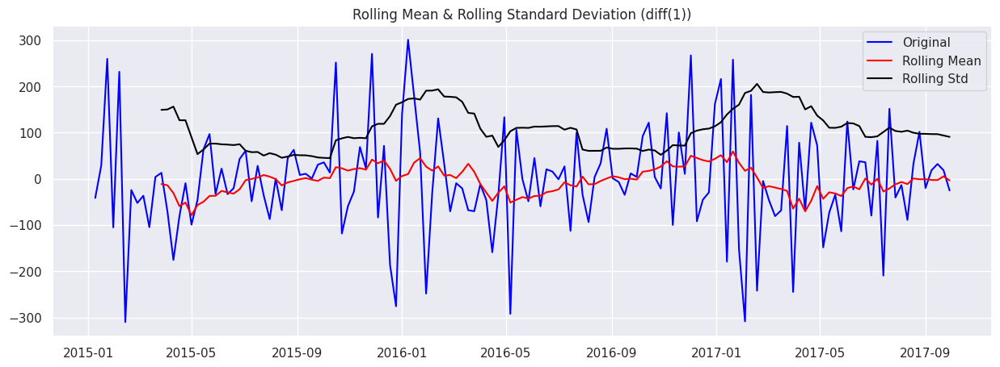

ADF Statistic: -2.9230
p-value: 0.0427
Critical Values:
	1%: -3.4797, outperformed
	5%: -2.8832, 
	10%: -2.5783, 
Result: The series is not stationary


In [11]:
y_diff = y_train[:].diff(1).dropna()

rolling_mean = y_diff.rolling(window=WINDOW).mean()
rolling_std = y_diff.rolling(window=WINDOW).std()

plt.figure()

plt.plot(
    y_diff,
    color="blue",
    label="Original",
)
plt.plot(
    rolling_mean,
    color="red",
    label="Rolling Mean",
)
plt.plot(
    rolling_std,
    color="black",
    label="Rolling Std",
)

plt.legend(loc="best")
plt.title("Rolling Mean & Rolling Standard Deviation (diff(1))")
plt.show()

result = check_ADF(y_diff)

К стационарному виду дифференциированием привести не удалось. Оно и понятно, в ряду преобладает сезонность => попробуем модель с сезонным дифференцированием:

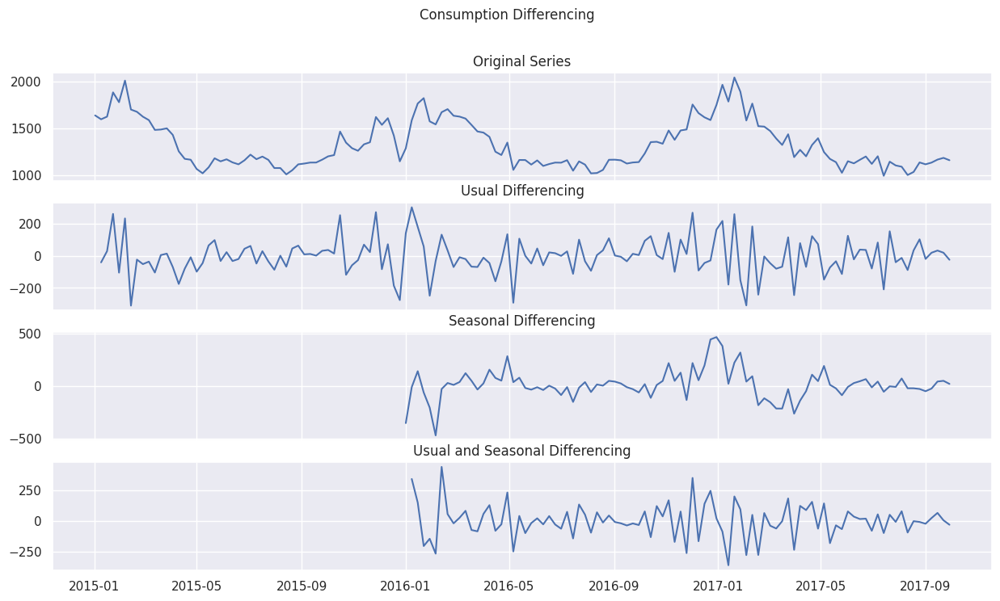

In [12]:
SEASON = 52

# Plot
fig, axes = plt.subplots(4, 1, figsize=(15, 8), sharex=True)

# Original Series
axes[0].plot(y_train[:])
axes[0].set_title("Original Series")

# Usual Differencing
axes[1].plot(y_train[:].diff(1))
axes[1].set_title("Usual Differencing")

# Seasinal Differencing
axes[2].plot(y_train[:].diff(SEASON))
axes[2].set_title("Seasonal Differencing")

# Seasinal and Usual Differencing
axes[3].plot(y_train[:].diff(1).diff(SEASON))
axes[3].set_title("Usual and Seasonal Differencing")

plt.suptitle("Consumption Differencing", fontsize=12)
plt.show()

In [14]:
y_sdif = y_train[:].diff(1).diff(SEASON).dropna()
results = check_ADF(y_sdif)

ADF Statistic: -13.5036
p-value: 0.0000
Critical Values:
	1%: -3.5052, 
	5%: -2.8942, 
	10%: -2.5842, 
Result: The series is not stationary


Хотя тест всё ещё показывает нестационарность ряда даже после обычного и сезонного дифференциирования, вспомним правило "лучше недо чем передифференциировать" и на данном этапе примем следующие порядки дифференциирования: `d=1, D=1, s=52`.

## 3.3. Подбор порядков AR / MA

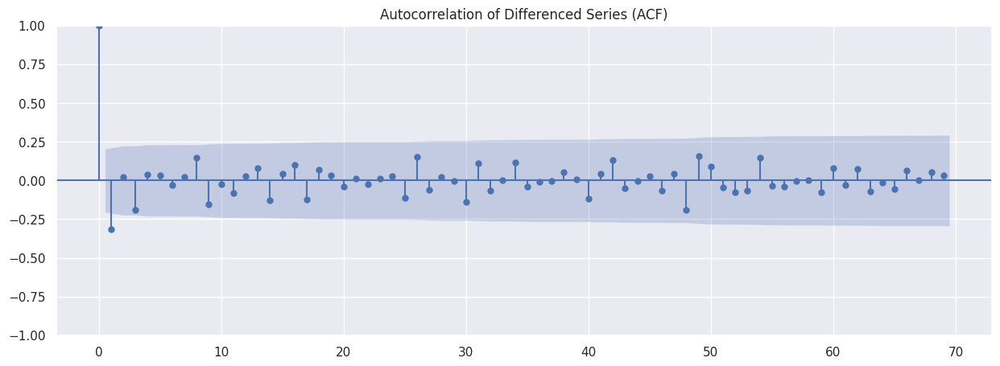

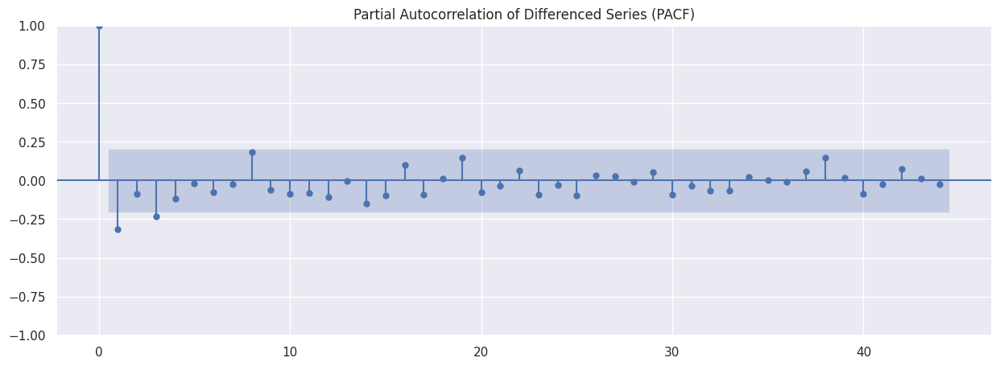

In [15]:
# Рассмотрим графики ACF и PACF.

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

# Usual Differencing
plot_acf(
    y_sdif,
    title="Autocorrelation of Differenced Series (ACF)",
    lags=np.arange(70),
)
# Usual Differencing
plot_pacf(
    y_sdif,
    title="Partial Autocorrelation of Differenced Series (PACF)",
    method="ywm",
    lags=np.arange(45),
)
plt.show()

Из графиков выше следует следующий выбор параметров `SARIMA (p, d, q) (P, D, Q) s`:

* `3` порядка AR `(p)` (1 и 3 лаги PACF ниже нуля);
* `1` порядок MA `(q)` (на ACF видна нестационарность, 1 лаг превысил интервал);
* `0` порядок SAR `(P)` (на PACF нет значимых лагов выше нуля);
* `1` порядок SMA `(Q)` (на ACF есть 1 значимый лаг ниже нуля);

Итого получаем модель `SARIMA (3, 1, 1) (0, 1, 1) 52`

___

In [17]:
forecaster = SARIMAX(order=(3, 1, 1), seasonal_order=(0, 1, 1, 52))
forecaster.fit(y_train)
print(forecaster.summary())

                                     SARIMAX Results                                      
Dep. Variable:                        Consumption   No. Observations:                  144
Model:             SARIMAX(3, 1, 1)x(0, 1, 1, 52)   Log Likelihood                -563.191
Date:                            Wed, 03 Jan 2024   AIC                           1140.383
Time:                                    17:27:37   BIC                           1157.959
Sample:                                01-02-2015   HQIC                          1147.473
                                     - 09-29-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1415      0.846      0.167      0.867      -1.518       1.801
ar.L1          0.4119      0.105   

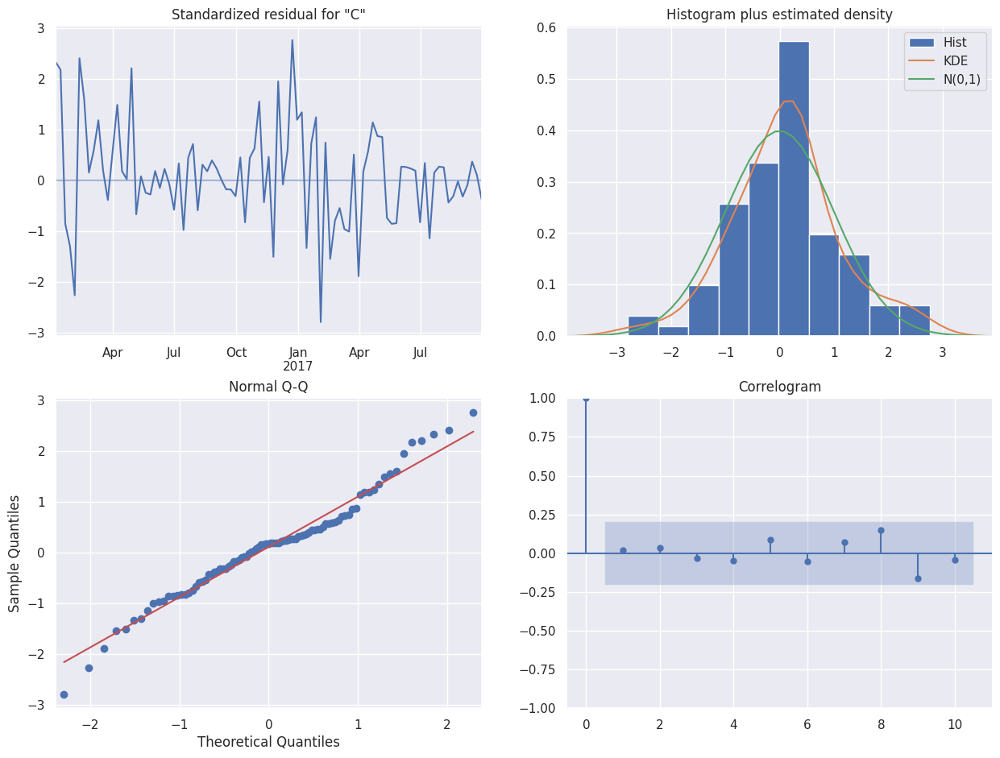

In [19]:
forecaster._fitted_forecaster.plot_diagnostics(figsize=(15, 11));

На графиках выше мы видим:

1. верхний левый график: остаточные ошибки колеблются около нулевого среднего, однако имеют заметно неравномерную дисперсию, возможно модель недодифференцирована.
1. верхний правый график: в целом всё очень прилично, довольно близко к нормальному распределению.
1. нижний правый график: график Q-Q показывает отклонения от нормального распределения, на хвостах их больше всего.
1. нижний левый график: автокорреляционная функция не показывает значительных (статистически значимых) отличий от нормального распределения.

А теперь посмотрим на метрику и картинку:

sMAPE = 0.086


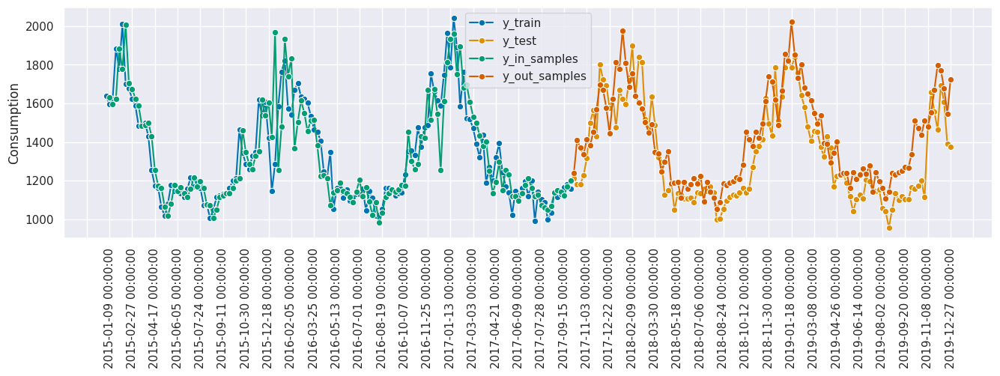

In [20]:
fit_predict_plot_sarima(forecaster)

Ну и ещё на дисперсию / доверительные интервалы:

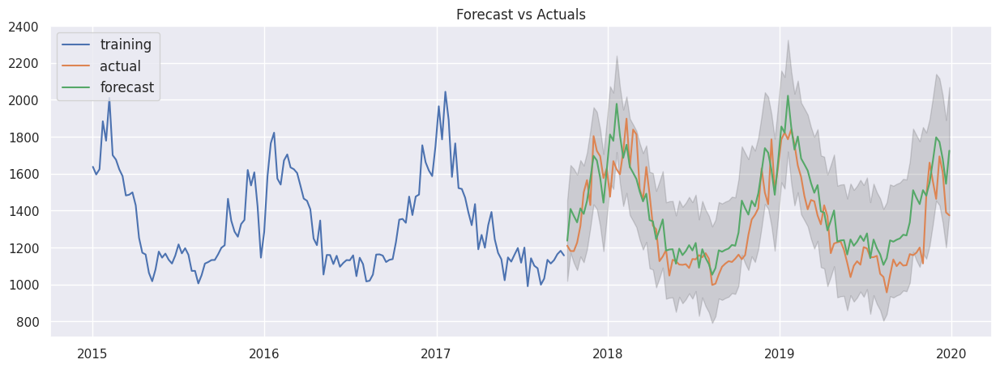

In [21]:
def ci_plot(forecaster):
    forecast_res = forecaster._fitted_forecaster.get_forecast(
        y_test.size,
        alpha=0.05,
        dynamic=False,
    )

    forecast = forecast_res.predicted_mean

    fc_series = pd.Series(forecast.values, index=y_test.index)

    lower_series = pd.Series(
        forecast_res.conf_int()["lower Consumption"],
        index=y_test.index,
    )
    upper_series = pd.Series(
        forecast_res.conf_int()["upper Consumption"],
        index=y_test.index,
    )

    plt.figure()

    plt.plot(y_train, label="training")
    plt.plot(y_test, label="actual")
    plt.plot(fc_series, label="forecast")

    plt.fill_between(
        lower_series.index,
        lower_series,
        upper_series,
        color="k",
        alpha=0.15,
    )

    plt.title("Forecast vs Actuals")
    plt.legend(loc="upper left", fontsize=12)
    plt.show()


ci_plot(forecaster)

Предсказание выглядит относительно неплохо, но ещё точно есть к чему стремиться. Попробуем взять порядки побольше.

___

In [22]:
forecaster = SARIMAX(order=(3, 1, 1), seasonal_order=(2, 1, 1, 52))
forecaster.fit(y_train)
print(forecaster.summary())

                                     SARIMAX Results                                      
Dep. Variable:                        Consumption   No. Observations:                  144
Model:             SARIMAX(3, 1, 1)x(2, 1, 1, 52)   Log Likelihood                -563.201
Date:                            Wed, 03 Jan 2024   AIC                           1144.401
Time:                                    17:31:24   BIC                           1166.999
Sample:                                01-02-2015   HQIC                          1153.518
                                     - 09-29-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.3802      2.703      0.141      0.888      -4.918       5.678
ar.L1          0.4115      0.108   

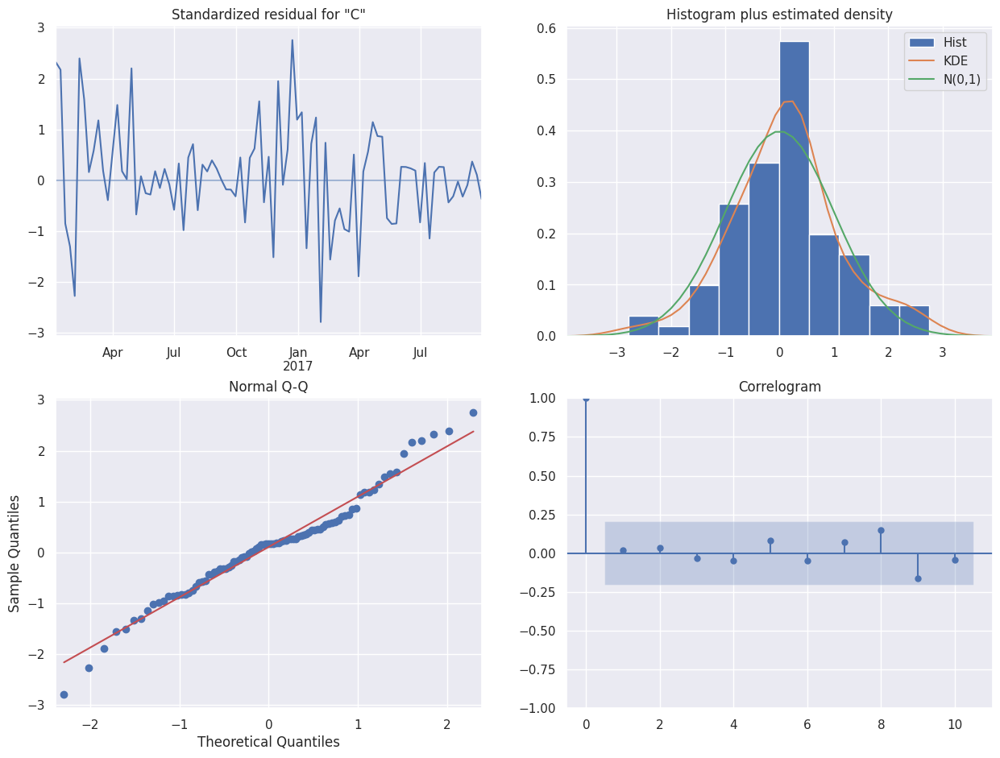

In [23]:
forecaster._fitted_forecaster.plot_diagnostics(figsize=(15, 11));

sMAPE = 0.088


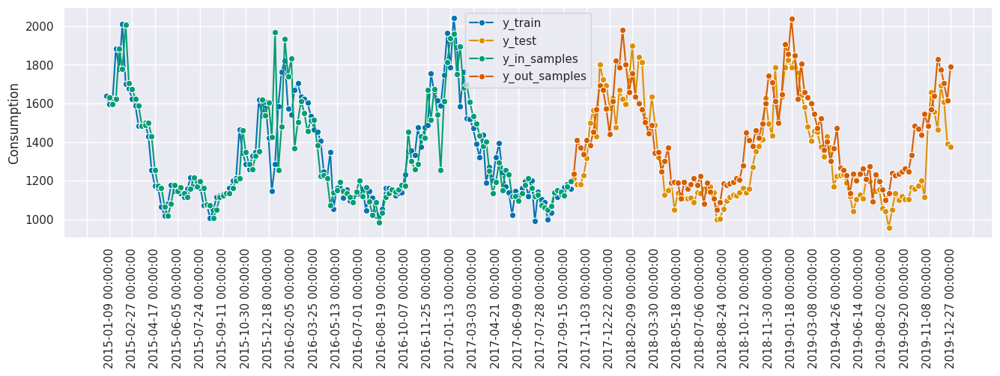

In [24]:
fit_predict_plot_sarima(forecaster)

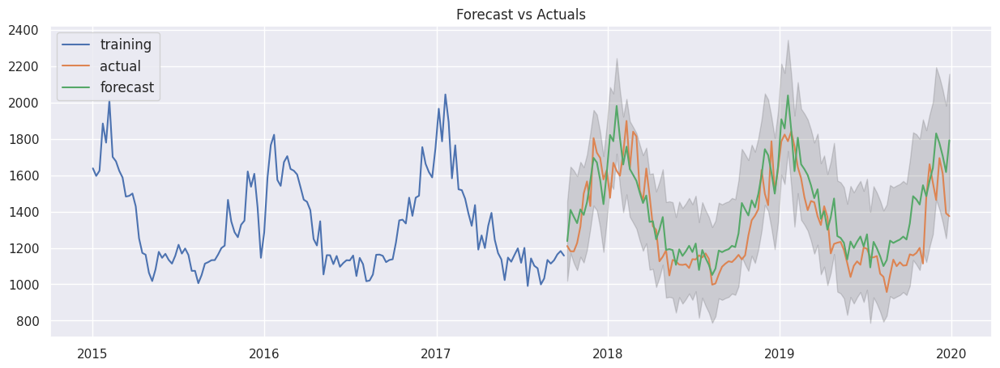

In [25]:
ci_plot(forecaster)

Ладно, с ручным подбором не вышло: метрика чуть хуже.

Попробуем автоматический подбор параметров:

In [26]:
model = AutoARIMA(
    start_p=1, # начальный порядок AR
    d=1, # Порядок производной
    start_q=0, # начальный порядок MA
    max_p=5, # конечный порядок AR
    max_q=5, # конечный порядок MA
    seasonal=True, # Использовать SARIMA
    start_P=0, # начальный порядок SAR
    start_Q=0, # начальный порядок SMA
    D=1, # Порядок сезонной производной
    sp=52, # Период сезонности
    max_order=7, # Максимальный порядок p+q+P+Q
    trace=True, # отчет он-лайн
    stepwise=True, # метод ускоренного выбора параметров.
    n_jobs=1, # для stepwise парралелизм не доступен.
    error_action="ignore",
    suppress_warnings=True,
)

model.fit(y_train)

model.summary()

Performing stepwise search to minimize aic
 ARIMA(1,1,0)(0,1,0)[52] intercept   : AIC=1149.569, Time=2.28 sec
 ARIMA(0,1,0)(0,1,0)[52] intercept   : AIC=1157.921, Time=0.56 sec
 ARIMA(1,1,0)(1,1,0)[52] intercept   : AIC=1146.217, Time=5.84 sec
 ARIMA(0,1,1)(0,1,1)[52] intercept   : AIC=1143.099, Time=12.62 sec
 ARIMA(0,1,0)(0,1,0)[52]             : AIC=1156.002, Time=0.70 sec
 ARIMA(0,1,1)(0,1,0)[52] intercept   : AIC=1145.233, Time=1.55 sec
 ARIMA(0,1,1)(1,1,1)[52] intercept   : AIC=inf, Time=33.72 sec
 ARIMA(0,1,1)(0,1,2)[52] intercept   : AIC=inf, Time=77.86 sec
 ARIMA(0,1,1)(1,1,0)[52] intercept   : AIC=1143.138, Time=6.94 sec
 ARIMA(0,1,1)(1,1,2)[52] intercept   : AIC=inf, Time=90.97 sec
 ARIMA(0,1,0)(0,1,1)[52] intercept   : AIC=1158.145, Time=13.80 sec
 ARIMA(1,1,1)(0,1,1)[52] intercept   : AIC=inf, Time=14.38 sec
 ARIMA(0,1,2)(0,1,1)[52] intercept   : AIC=1144.526, Time=14.85 sec
 ARIMA(1,1,0)(0,1,1)[52] intercept   : AIC=1146.167, Time=6.50 sec
 ARIMA(1,1,2)(0,1,1)[52] interce

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  144
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 52)   Log Likelihood                -567.559
Date:                            Wed, 03 Jan 2024   AIC                           1141.118
Time:                                    17:43:46   BIC                           1148.651
Sample:                                01-02-2015   HQIC                          1144.157
                                     - 09-29-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5147      0.085     -6.036      0.000      -0.682      -0.348
ma.S.L52      -0.3956      0.135     -2.935      0.003      -0.660      -0.131
sigma2      1.405e+04   1867.728      7.524      0.000    1.04e+04    1.77e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.44   Jarque-Bera (JB):                 3.65
Prob(Q):                              0.51   Prob(JB):                         0.16
Heteroskedasticity (H):               0.42   Skew:                            -0.22
Prob(H) (two-sided):                  0.02   Kurtosis:                         3.88
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Автоподбор автоподобрался и выдал вот такую модельку в качестве лучшей:
```
Best model:  ARIMA(0,1,1)(0,1,1)[52]          
Total fit time: 550.490 seconds
```
Попробуем использовать данные параметры для предсказания:

In [28]:
forecaster = SARIMAX(order=(0, 1, 1), seasonal_order=(0, 1, 1, 52))
forecaster.fit(y_train)
print(forecaster.summary())

                                     SARIMAX Results                                      
Dep. Variable:                        Consumption   No. Observations:                  144
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 52)   Log Likelihood                -567.550
Date:                            Wed, 03 Jan 2024   AIC                           1143.099
Time:                                    17:44:01   BIC                           1153.143
Sample:                                01-02-2015   HQIC                          1147.151
                                     - 09-29-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.7537      6.045      0.125      0.901     -11.094      12.601
ma.L1         -0.5146      0.086   

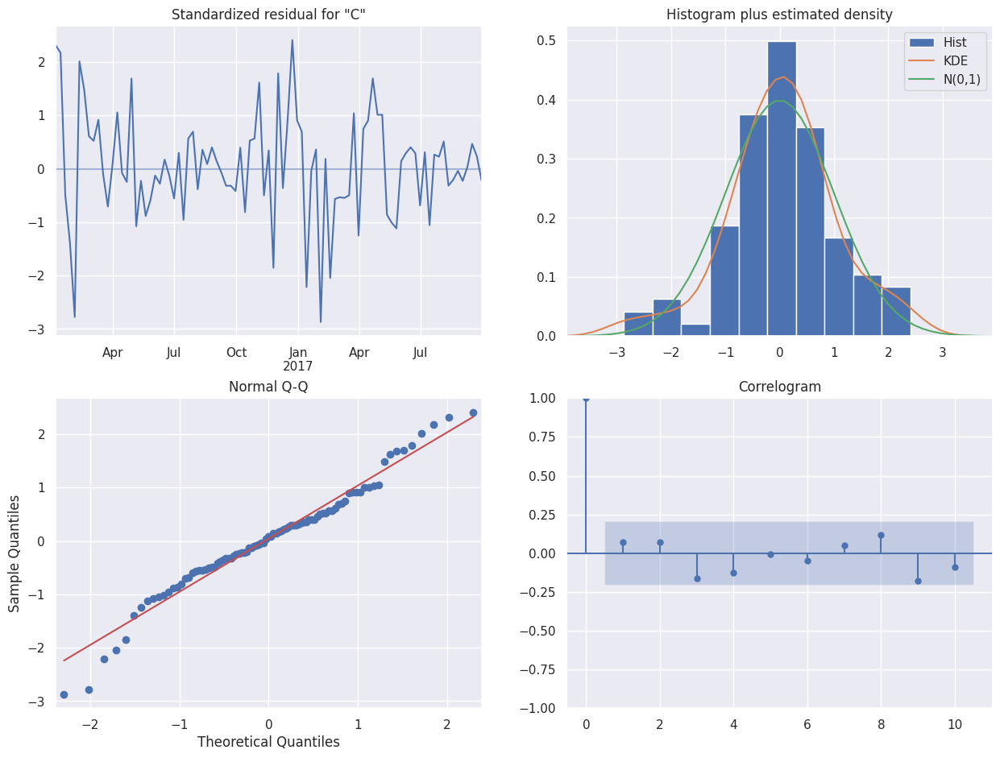

In [29]:
forecaster._fitted_forecaster.plot_diagnostics(figsize=(15, 11));

sMAPE = 0.102


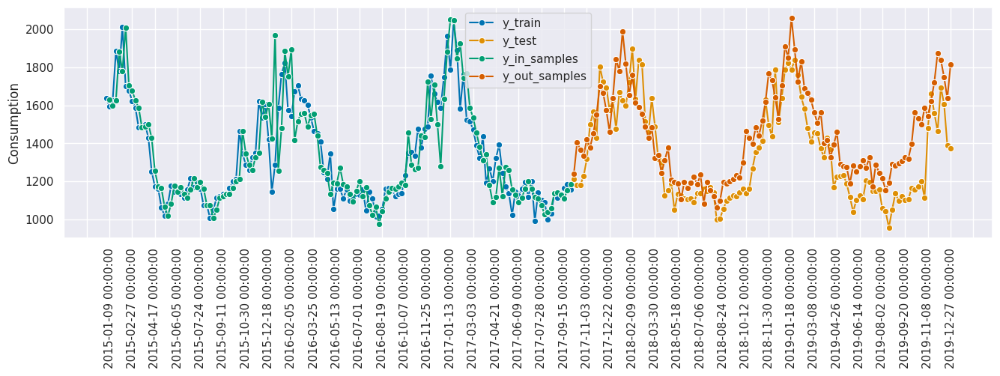

In [30]:
fit_predict_plot_sarima(forecaster)

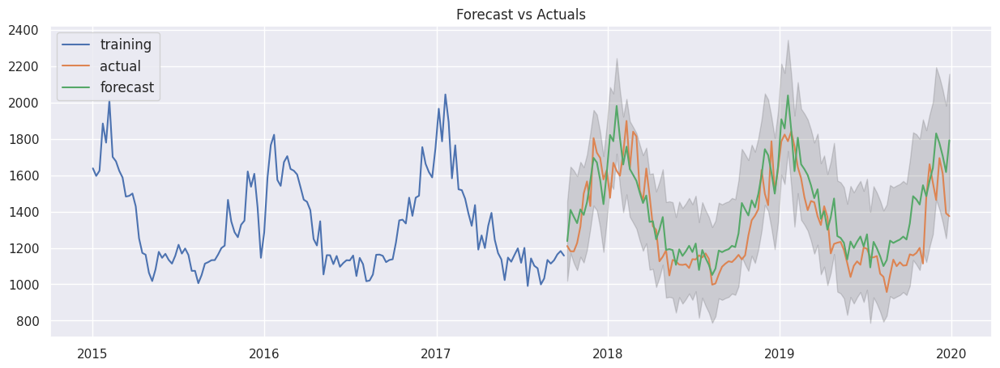

In [27]:
ci_plot(forecaster)

Мдауш, что-то не задалось с автоподбором модельки. Попробуем заранее избавиться от сезонности и уже после этого применить ARIMA:

sMAPE = 0.067


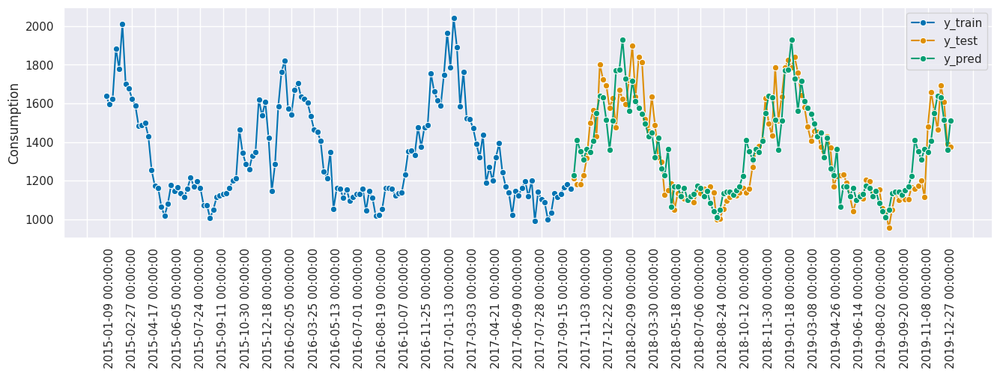

In [37]:
from sktime.forecasting.arima import ARIMA
from sktime.forecasting.compose import TransformedTargetForecaster
from sktime.transformations.series.detrend import Deseasonalizer

forecaster = TransformedTargetForecaster(
    [
        (
            "deseasonalize",
            Deseasonalizer(
                model="multiplicative",
                sp=SEASON,
            ),
        ),
        (
            "forecast",
            ARIMA(
                order=(2, 0, 0),
                seasonal_order=(0, 0, 0, 0),
            ),
        ),
    ]
)
fit_predict_plot(forecaster)

Ура, наконец-то достойная метрика. Всё ещё не лучшая, но уже близкая к Prophet и лучшая среди всех испробованных SARIMA-моделей.

## 3.4. Вывод по SARIMA

Метод, конечно, замечательный, но мне так и не удалось подобрать параметры так, чтобы превзойти методы из простых предсказаний (особенно, Prophet). Лучше всего сработало предварительное удаление сезонности (наиболее близкое к Prophet). Автоподбор параметров сработал из рук вон плохо, а ручками подбирать параметры не очень удобно, плюс с увеличением порядка дифференциирования модели начинают всё дольше учиться. В общем, впечатления у меня смешанные, но может быть просто не тот случай временного ряда.

# 4. Классификация ВР, классическое МО

## 4.1. Импорты, загрузка и разбиение датасета на времена года

In [38]:
try:
    import sktime
except:
    print("Start sktime[all_extras] instalation")
    !pip install --quiet --upgrade sktime[all_extras]
    print("sktime[all_extras] was installed")
import sktime

In [132]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sktime.transformations.panel.rocket import MiniRocket
from sktime.datasets import load_from_tsfile
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from typing import Any


RS = 42
N_EST = 100


def split_by_month(df, months):
    df_result = pd.DataFrame()
    for month in np.atleast_1d(months):
        df_result = df_result.append(df.loc[df.index.month == month])
    return df_result


def to_segments(df, column="Consumption", size=24):
    df.index.hour[0]
    start_idx = 24 - df.index.hour[0]
    df = df.iloc[start_idx:]
    val = df[[column]].values
    return val[: size * (val.size // size)].reshape(-1, size)


def extract_country(
    df_all: pd.DataFrame,
    country_code: str,
    year_min: int = None,
    year_max: int = None,
) -> pd.DataFrame:
    """Extract data for a single country"""
    # List of columns to extract
    columns = [col for col in df_all.columns if col.startswith(country_code)]
    # Extract columns and remove country codes from column labels
    columns_map = {col: col[3:] for col in columns}
    df_out = df_all[columns].rename(columns=columns_map)
    # Exclude years outside of specified range, if any
    if year_min is not None:
        df_out = df_out[df_out.index.year >= year_min]
    if year_max is not None:
        df_out = df_out[df_out.index.year <= year_max]
    return df_out


def transform_dataframe_clf(
    df: pd.DataFrame,
    cols_map: dict[str],
) -> pd.DataFrame:
    # Rename columns for convenience
    df = df[list(cols_map.keys())].rename(columns=cols_map)
    # Convert from MW to GW
    df = df / 1000
    df = df.rename_axis("Date")
    return df


def fit_predict_clf(models_with_names: list[Any, str]) -> None:

    loop_start_time = time.time()
    for clf, name in models_with_names:
        start_time = time.time()
        clf.fit(X_train, y_train)
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(
            f"Model: {name}, "
            f"test score: {clf.score(X_test, y_test):.3f}, "
            f"fit time: {elapsed_time:.3f} s"
        )
    loop_end_time = time.time()
    loop_elapsed_time = loop_end_time - loop_start_time
    print(f"\nloop_elapsed_time: {loop_elapsed_time:.3f} s")

In [141]:
URL = "https://data.open-power-system-data.org/time_series/2020-10-06"
DATAFILE = f"{URL}/time_series_60min_singleindex.csv"
df_all = pd.read_csv(
    DATAFILE,
    index_col="utc_timestamp",
    parse_dates=True,
    low_memory=False,
)

df_hrly = extract_country(
    df_all,
    country_code='FR',
    year_min=2015,
    year_max=2019,
)

cols_map = {
    "load_actual_entsoe_transparency" : "Consumption",
    "wind_onshore_generation_actual" : "Wind",
    "solar_generation_actual" : "Solar",
}
df = transform_dataframe_clf(df_hrly, cols_map)

# Compute wind + solar generation
df["Wind+Solar"] = df[["Wind", "Solar"]].sum(axis=1, skipna=False)
df.ffill(inplace=True)
df.dropna(inplace=True)
df.to_csv(CSV_CLF_PATH)
df

,Consumption,Wind,Solar,Wind+Solar
Date,,,,
2015-01-01 08:00:00+00:00,64.277,1.936,0.385,2.321
2015-01-01 09:00:00+00:00,65.100,1.927,1.053,2.980
2015-01-01 10:00:00+00:00,65.875,1.846,1.635,3.481
2015-01-01 11:00:00+00:00,67.460,1.768,1.883,3.651
2015-01-01 12:00:00+00:00,65.706,1.715,1.857,3.572
...,...,...,...,...
2019-12-31 19:00:00+00:00,64.771,2.695,0.000,2.695
2019-12-31 20:00:00+00:00,62.259,2.831,0.000,2.831
2019-12-31 21:00:00+00:00,63.774,3.031,0.000,3.031


Разбиваем датасет на классы по временам года:

In [77]:
arrays_list: list[np.ndarray] = []
for month_list in (
    [1, 2, 12],
    [3, 4, 5],
    [6, 7, 8],
    [9, 10, 11],
):
    arrays_list.append(to_segments(split_by_month(df, month_list)))
winter, spring, summer, autumn = arrays_list
print(winter.shape, spring.shape, summer.shape, autumn.shape)

(450, 24) (459, 24) (459, 24) (454, 24)


Посмотрим на зимний датасет:

In [78]:
pd.DataFrame(winter)

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,65.510,64.522,61.798,60.686,62.060,64.662,66.982,68.828,70.472,71.681,...,66.628,66.234,69.985,73.818,73.971,70.938,67.746,68.455,69.539,66.642
1,64.227,62.716,59.396,57.700,58.131,59.493,60.986,62.703,64.814,66.427,...,61.852,60.906,63.367,66.458,66.400,63.519,60.554,61.320,62.725,60.265
2,57.658,55.874,52.581,50.650,50.570,51.566,52.564,53.872,56.101,58.463,...,56.109,55.809,59.859,65.218,66.941,65.231,62.623,63.366,64.730,62.610
3,61.092,60.219,57.535,56.891,59.823,66.249,73.308,76.107,76.452,76.494,...,71.536,71.665,75.440,79.847,80.090,76.262,71.858,71.997,72.673,69.935
4,67.795,66.811,64.040,63.275,65.977,72.092,78.888,81.429,81.438,81.086,...,75.285,75.028,78.196,81.983,81.712,77.245,72.532,72.243,72.686,69.988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,52.819,51.397,48.907,48.091,49.483,52.324,55.227,57.710,59.764,61.175,...,57.925,57.331,60.279,62.763,62.439,59.630,57.070,57.526,58.563,55.886
446,53.448,52.063,49.417,48.078,48.748,50.279,52.352,54.548,56.785,58.358,...,55.141,54.838,58.552,61.497,62.219,60.173,58.302,59.698,61.205,58.941
447,56.989,55.613,53.185,52.063,52.623,53.922,55.516,57.181,59.477,61.345,...,56.045,55.801,60.039,64.336,65.937,64.448,62.679,63.851,65.287,63.016
448,61.013,60.068,57.855,57.042,58.918,62.215,65.943,68.803,71.013,70.892,...,62.065,61.734,66.019,70.598,71.444,68.576,65.849,66.976,68.149,65.601


И наконец посмотрим на графики потребления в зависимости от времени года:

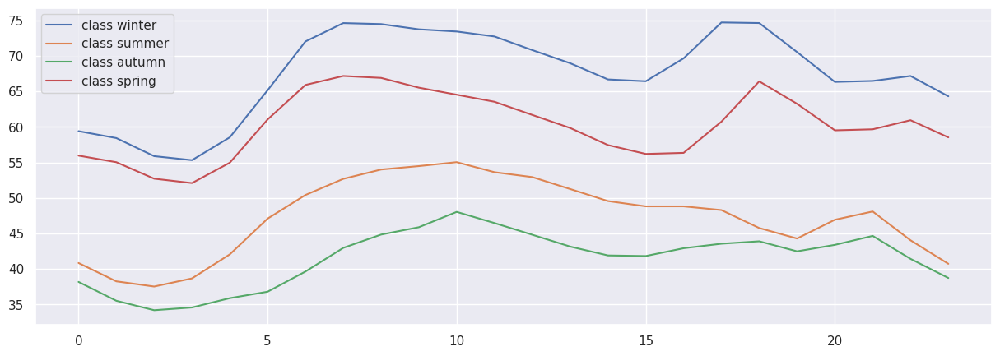

In [79]:
plt.figure()
DAY = 10
for array, label in zip(
    [winter, summer, autumn, spring],
    ["winter", "summer", "autumn", "spring"],
):
    plt.plot(array[DAY], label=f"class {label}")
plt.legend(loc="best")
plt.show()
plt.close()

Ну всё выглядит довольно неплохо, вполне может быть, что всё будет хорошо делиться. Ну помсмомтримб :)

## 4.2. Сплит на трейн/тест выборки

In [147]:
X = np.concatenate(arrays_list)
y = np.concatenate(
    [
        number * np.ones(array.shape[0])
        for number, array in zip(range(len(arrays_list)), arrays_list)
    ]
)
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    random_state=RS,
)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1275, 24) (1275,) (547, 24) (547,)


In [81]:
from sktime.datatypes import convert_to

dfs_list = []
for array in (X_train, X_test):
    dfs_list.append(
        convert_to(
            np.atleast_3d(X_train).transpose(0, 2, 1),
            to_type="nested_univ",
        )
    )
df_train, df_test = dfs_list
df_train

,var_0
0,0 40.575 1 38.208 2 37.553 3 3...
1,0 43.427 1 40.962 2 40.228 3 4...
2,0 40.579 1 38.468 2 38.027 3 3...
3,0 42.284 1 39.859 2 39.277 3 4...
4,0 61.208 1 59.501 2 56.784 3 5...
...,...
1270,0 40.274 1 38.157 2 37.808 3 3...
1271,0 34.979 1 32.575 2 31.483 3 3...
1272,0 40.904 1 38.588 2 38.141 3 4...
1273,0 36.370 1 34.435 2 34.187 3 3...


## 4.3. Классификация от sklearn

In [128]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

fit_predict_clf(
    [
        (RandomForestClassifier(n_estimators=N_EST), "RandomForestClassifier"),
        (KNeighborsClassifier(n_neighbors=1), "KNeighborsClassifier"),
    ]
)

Model: RandomForestClassifier, test score: 0.850, fit time: 0.518 s
Model: KNeighborsClassifier, test score: 0.810, fit time: 0.002 s

loop_elapsed_time: 0.571 s


### Вывод

В целом получилось неплохо, обе модельки справились на 80%+, что является очень даже хорошим результатом для четырехклассовой классификации. При этом деревья справились лучше, чем соседи, но оно в целом почти всегда так и бывает.

## 4.4. Классификация от sktime

### 4.4.1. Классификаторы на основе данных

In [129]:
from sktime.classification.distance_based import KNeighborsTimeSeriesClassifier
from sktime.classification.shapelet_based import ShapeletTransformClassifier
from sktime.classification.dictionary_based import (
    ContractableBOSS,
    IndividualBOSS,
    IndividualTDE,
    MUSE,
    WEASEL,
)

fit_predict_clf(
    [
        (
            KNeighborsTimeSeriesClassifier(
                n_neighbors=1,
                distance="dtw",
            ),
            "KNTS_Clf_dtw",
        ),
        (
            KNeighborsTimeSeriesClassifier(
                n_neighbors=1,
                distance="ddtw",
            ),
            "KNTS_Clf_ddtw",
        ),
        (
            ShapeletTransformClassifier(
                estimator=RandomForestClassifier(n_estimators=N_EST),
                n_shapelet_samples=N_EST,
                max_shapelets=N_EST,
                batch_size=20,
            ),
            "ShapeletTransformClassifier",
        ),
        (
            ContractableBOSS(random_state=RS),
            "ContractableBOSS_Clf",
        ),
        (
            IndividualBOSS(random_state=RS),
            "IndividualBOSS_Clf",
        ),
        (
            IndividualTDE(random_state=RS),
            "IndividualTDE_Clf",
        ),
        (
            MUSE(random_state=RS),
            "MUSE_Clf",
        ),
        (
            WEASEL(random_state=RS),
            "WEASEL_Clf",
        ),
    ]
)


Model: KNTS_Clf_dtw, test score: 0.790, fit time: 0.011 s
Model: KNTS_Clf_ddtw, test score: 0.936, fit time: 0.009 s
Model: ShapeletTransformClassifier, test score: 0.916, fit time: 16.442 s
Model: ContractableBOSS_Clf, test score: 0.941, fit time: 3.314 s
Model: IndividualBOSS_Clf, test score: 0.799, fit time: 0.034 s
Model: IndividualTDE_Clf, test score: 0.894, fit time: 0.859 s
Model: MUSE_Clf, test score: 0.965, fit time: 2.857 s
Model: WEASEL_Clf, test score: 0.949, fit time: 3.970 s

loop_elapsed_time: 79.420 s


#### Вывод
Ооо, тут есть модельки, которые достигают почти 97% точности (`MUSE`). Очень хорошо получилось. Но тем не менее, некоторые модельки не достигли и 80%.

### 4.4.2. Классификаторы на основе признаков

In [135]:
from sktime.classification.interval_based import (
    TimeSeriesForestClassifier,
    RandomIntervalSpectralEnsemble,
    SupervisedTimeSeriesForest,
)
from sklearn.linear_model import RidgeClassifierCV
from sktime.classification.feature_based import (
    SummaryClassifier,
    Catch22Classifier,
)
from sklearn.ensemble import RandomForestClassifier


fit_predict_clf(
    [
        (
            TimeSeriesForestClassifier(
                n_estimators=N_EST,
                random_state=RS,
            ),
            "TimeSeriesForestClassifier",
        ),
        (
            RandomIntervalSpectralEnsemble(
                n_estimators=N_EST,
                random_state=RS,
            ),
            "RandomIntervalSpectralEnsemble",
        ),
        (
            SupervisedTimeSeriesForest(
                n_estimators=N_EST,
                random_state=RS,
            ),
            "SupervisedTimeSeriesForest",
        ),
        (
            RidgeClassifierCV(),
            "RidgeClassifierCV",
        ),
        (
            SummaryClassifier(
                estimator=RandomForestClassifier(n_estimators=N_EST),
            ),
            "SummaryClassifier",
        ),
        (
            Catch22Classifier(
                estimator=RandomForestClassifier(n_estimators=N_EST),
            ),
            "Catch22Classifier",
        ),
    ]
)

Model: TimeSeriesForestClassifier, test score: 0.907, fit time: 2.339 s
Model: RandomIntervalSpectralEnsemble, test score: 0.932, fit time: 14.579 s
Model: SupervisedTimeSeriesForest, test score: 0.962, fit time: 25.321 s
Model: RidgeClassifierCV, test score: 0.905, fit time: 0.010 s
Model: SummaryClassifier, test score: 0.715, fit time: 9.538 s
Model: Catch22Classifier, test score: 0.828, fit time: 4.626 s

loop_elapsed_time: 69.038 s


#### Вывод
В данной выборке лучше всего справился `SupervisedTimeSeriesForest`

## 4.5. Вывод по классификациям с помощью классического МО

Все алгоритмы справились очень хорошо, большинство имело качество 80%+, а `MUSE` и `SupervisedTimeSeriesForest` – 95%+. Лишь пара моделек справилась на метрику меньше 80%.

# 5. Классификация, нейросеточки (TSAI)

## 5.1. Импорты, загрузка и разбиение датасета

Доустанавливаем модуль с нейросеточками:

In [138]:
try:
    from tsai.all import *
except ModuleNotFoundError:
    stable = True # Set to True for latest pip version or False for main branch in GitHub
    !pip install {"tsai -U" if stable else "git+https://github.com/timeseriesAI/tsai.git"} >> /dev/null
finally:
    from tsai.all import *

import warnings
from sklearn.model_selection import train_test_split

computer_setup()

os              : Linux-6.1.58+-x86_64-with-glibc2.35
python          : 3.10.12
tsai            : 0.3.8
fastai          : 2.7.13
fastcore        : 1.5.29
torch           : 2.1.0+cu121
device          : cpu
cpu cores       : 1
threads per cpu : 2
RAM             : 12.67 GB
GPU memory      : N/A


Загрузим датасет, разобьем на времена года и посмотрим, чтто всё в порядке:

(450, 24) (459, 24) (459, 24) (454, 24)


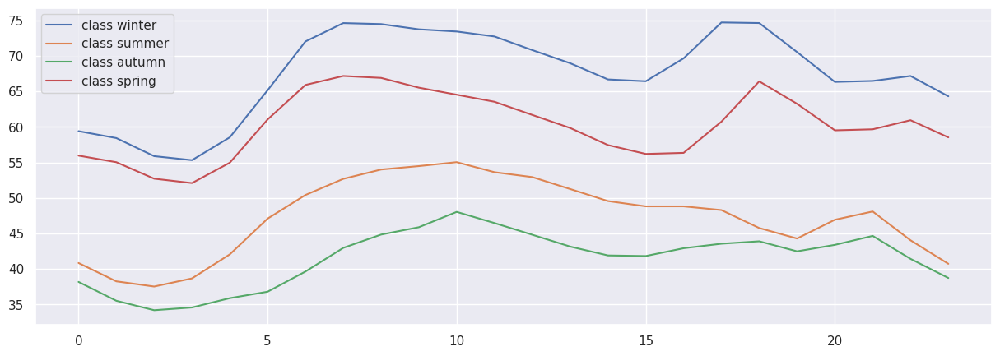

In [146]:
df = pd.read_csv(
    CSV_CLF_PATH,
    parse_dates=["Date"],
    index_col="Date",
)

arrays_list: list[np.ndarray] = []
for month_list in (
    [1, 2, 12],
    [3, 4, 5],
    [6, 7, 8],
    [9, 10, 11],
):
    arrays_list.append(to_segments(split_by_month(df, month_list)))
winter, spring, summer, autumn = arrays_list
print(winter.shape, spring.shape, summer.shape, autumn.shape)

plt.figure()
DAY = 10
for array, label in zip(
    [winter, summer, autumn, spring],
    ["winter", "summer", "autumn", "spring"],
):
    plt.plot(array[DAY], label=f"class {label}")
plt.legend(loc="best")
plt.show()
plt.close()

Разобьём на фичи и таргет:

In [148]:
X = np.concatenate(arrays_list)
y = np.concatenate(
    [
        number * np.ones(array.shape[0])
        for number, array in zip(range(len(arrays_list)), arrays_list)
    ]
)

X = np.atleast_3d(X).transpose(0, 2, 1)
y.astype(int)

array([0, 0, 0, ..., 3, 3, 3])

Перемапим таргет:

In [173]:
class_map = {
    0: "winter",
    1: "spring",
    2: "summer",
    3: "autumn",
}

labeler = ReLabeler(class_map)
y = labeler(y)
y

array(['winter', 'winter', 'winter', ..., 'autumn', 'autumn', 'autumn'],
      dtype='<U6')

Разобьём на сплиты:

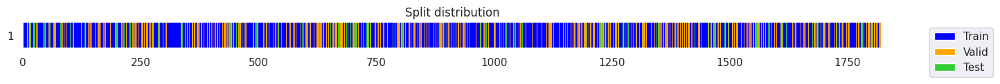

((#1094) [721,1296,1354,1655,1072,1183,1552,680,1057,775...],
 (#546) [766,871,1791,1543,253,401,666,1012,1476,1315...],
 (#182) [912,338,1134,634,88,1285,171,214,1439,706...])

In [153]:
splits = get_splits(
    y,
    n_splits=1,
    valid_size=0.3,
    test_size=0.1,
    shuffle=True,
    balance=False,
    stratify=True,
    random_state=42,
    show_plot=True,
    verbose=True,
)
splits

Формируем загрузчик данных:

In [154]:
tfms = [
    None,
    [Categorize()],
]
dsets = TSDatasets(
    X,
    y,
    tfms=tfms,
    splits=splits,
)

bs = 256
dls = TSDataLoaders.from_dsets(
    dsets.train,
    dsets.valid,
    bs=[bs, bs * 2],
)

## 5.2. Пробуем разные архитектуры нейросеток

Зададим список архитектур (закомментировал две штуки, так как на них почему-то крашится цикл):

In [157]:
archs = [
    (RNNPlus, {"n_layers": 3, "bidirectional": True}),
    (LSTMPlus, {"n_layers": 3, "bidirectional": True}),
    (GRUPlus, {"n_layers": 3, "bidirectional": True}),
    (RNNPlus, {"n_layers": 4, "bidirectional": True}),
    (RNNPlus, {"n_layers": 4, "bidirectional": False}),
    (LSTM, {"n_layers": 3, "bidirectional": False}),
    (RNN, {"n_layers": 3, "bidirectional": True}),
    (LSTM, {"n_layers": 3, "bidirectional": True}),
    (GRU, {"n_layers": 3, "bidirectional": True}),
    (ResNet, {}),
    # (xresnet1d34, {}),
    # (xresnet1d50_deeper, {}),
    (InceptionTime, {}),
    (XceptionTime, {}),
    (TCN, {}),
    (LSTM_FCN, {}),
    (TST, {}),
    (FCN, {}),
]

А теперь обучим нейросеточки и посмотрим сводную таблицу с рейтингом нейросеток:

In [158]:
from IPython.display import clear_output


results = pd.DataFrame(
    columns=[
        "arch",
        "hyperparams",
        "total params",
        "train loss",
        "valid loss",
        "accuracy",
        "time",
    ]
)

for i, (arch, k) in enumerate(archs):
    model = create_model(arch, dls=dls, **k)

    print(model.__class__.__name__)

    learn = Learner(dls, model, metrics=accuracy)
    start = time.time()
    learn.fit_one_cycle(20, 1e-3)
    elapsed = time.time() - start
    vals = learn.recorder.values[-1]
    results.loc[i] = [
        arch.__name__,
        k,
        count_parameters(model),
        vals[0],
        vals[1],
        vals[2],
        int(elapsed),
    ]
    results.sort_values(
        by="accuracy",
        ascending=False,
        ignore_index=True,
        inplace=True,
    )
    clear_output()
    display(results)

,arch,hyperparams,total params,train loss,valid loss,accuracy,time
0,ResNet,{},478724,0.348564,0.258502,0.908425,50
1,InceptionTime,{},388868,0.380998,0.283045,0.901099,84
2,XceptionTime,{},399480,0.821229,0.726833,0.824176,208
3,TST,{},411524,0.681387,0.488726,0.813187,89
4,FCN,{},264580,0.777939,0.623695,0.804029,25
5,RNNPlus,"{'n_layers': 4, 'bidirectional': False}",71304,0.848639,0.658680,0.774725,11
6,RNNPlus,"{'n_layers': 4, 'bidirectional': True}",202604,0.893614,0.702220,0.741758,27
7,LSTM_FCN,{},315380,0.874487,0.740512,0.739927,29
8,RNN,"{'n_layers': 3, 'bidirectional': True}",142204,0.899429,0.734199,0.725275,20
9,RNNPlus,"{'n_layers': 3, 'bidirectional': True}",142204,0.986095,0.852550,0.628205,33


### Вывод
Такс, ну у нас образовалось два явных лидера по точности (`ResNet` и `InceptionTime`), я бы с ними и продолжил работать.

## 5.3. ResNet

Задаем модель и подбираем скорость обучения:

SuggestedLRs(valley=0.0008317637839354575)

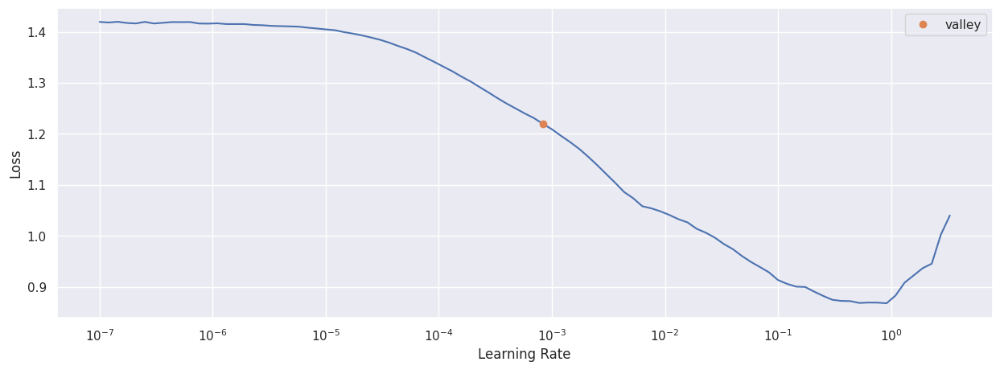

In [159]:
arch = ResNet
model = create_model(
    arch,
    dls=dls,
)
learn = ts_learner(
    dls,
    arch=model,
    metrics=accuracy,
)
learn.lr_find()

Используем подобранный параметр скорости обучения:

epoch,train_loss,valid_loss,accuracy,time
0,1.357371,1.694645,0.249084,00:05
1,1.280862,1.363691,0.205128,00:03
2,1.217819,1.294427,0.291209,00:03
3,1.168535,1.230133,0.393773,00:03
4,1.128810,1.148376,0.470696,00:02
5,1.097186,1.058037,0.540293,00:02
6,1.064430,0.972045,0.609890,00:02
7,1.030609,0.899102,0.648352,00:02
8,0.994731,0.828363,0.703297,00:06
9,0.954584,0.738310,0.736264,00:03


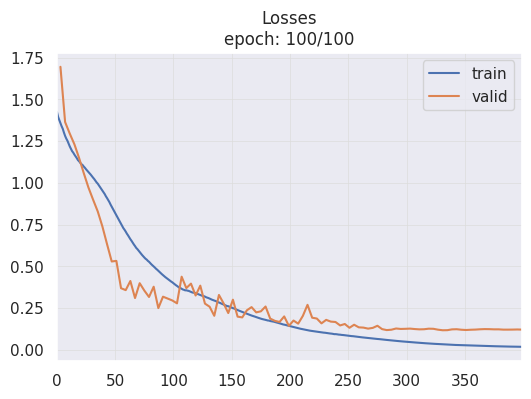

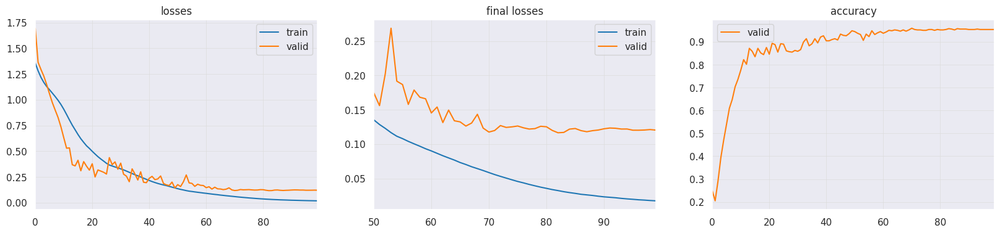

In [160]:
learn = Learner(
    dls,
    model,
    metrics=accuracy,
)
start = time.time()
learn.fit_one_cycle(
    n_epoch=100,
    lr_max=0.001,
    cbs=ShowGraph(),
)

Обучились, теперь посмотрим на картиночки с результатами обучения:

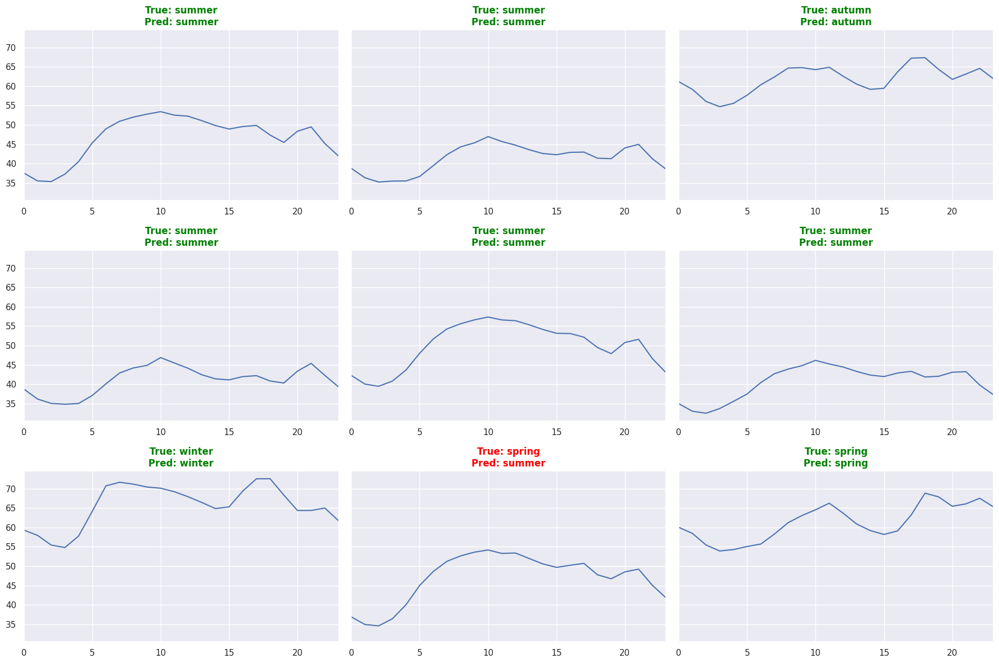

In [163]:
learn.show_results(sharey=True)

Посмотрим так же на вероятности предсказанных классов:

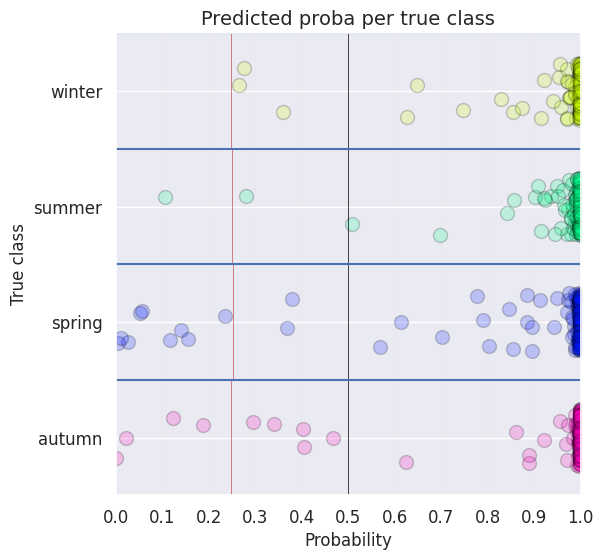

In [161]:
learn.show_probas()

Ну в целом большая часть результатов довольно плотно сидит в районе единички, здорово.

Теперь глянем на матрицу ошибок:

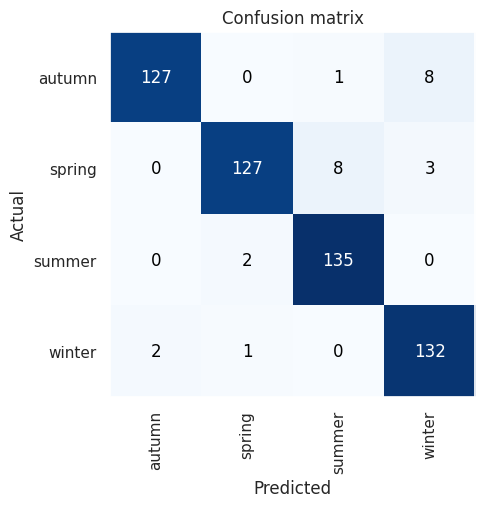

In [162]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Видим очень неплохую точность. Больше всего ошибок (по 8), когда вместо весны предсказывается лето, а вместо зимы – осень. Ну оно и понятно, очень близкие друг к другу времена года (иногда я сам бы затруднился сказать, где между ними разница). Ну и вместо весны 3 раза подсунули зиму (тоже классика).

Теперь посчитаем точность модели (мне не удалось применить метод из блокнота, но я придумал, как посчитать самостоятельно):

In [189]:
def calculate_accuracy():
    conf_matrix = interp.confusion_matrix()
    print(np.trace(conf_matrix) / conf_matrix.sum())

calculate_accuracy()

0.9542124542124543


### Вывод
95%+, очень даже приличный результат (ну оно было видно и по картиночкам).

## 5.4. InceptionTime

Повторим тот же пайплайн, но уже для архитектуры InceptionTime. Дотошно я прописывать ячейки не буду, ибо и так уже было:

SuggestedLRs(valley=0.0008317637839354575)

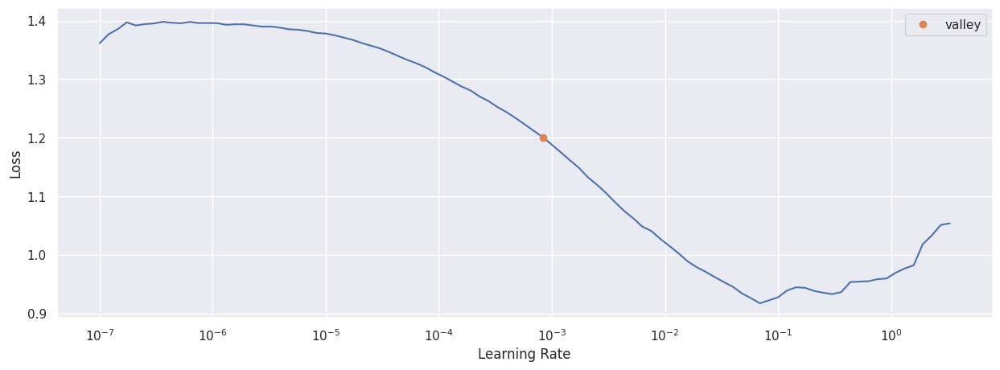

In [190]:
arch = InceptionTime
model = create_model(
    arch,
    dls=dls,
)
learn = ts_learner(
    dls,
    arch=model,
    metrics=accuracy,
)
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,time
0,1.321047,2.924429,0.249084,00:04
1,1.252522,1.786774,0.249084,00:04
2,1.201800,1.467562,0.247253,00:03
3,1.162931,1.349088,0.258242,00:03
4,1.128502,1.285412,0.289377,00:05
5,1.093451,1.235076,0.500000,00:05
6,1.057951,1.185012,0.529304,00:08
7,1.020152,1.105940,0.672161,00:03
8,0.978330,0.991221,0.756410,00:03
9,0.930268,0.817392,0.782051,00:08


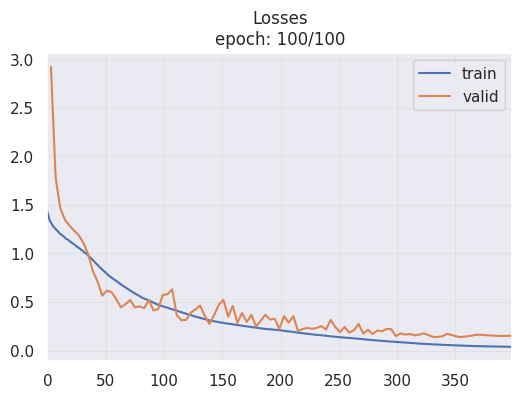

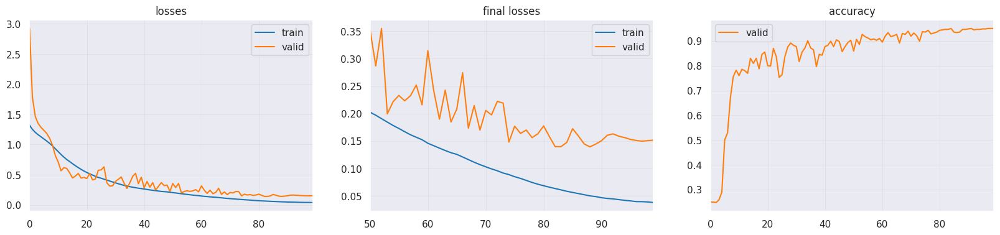

In [191]:
learn = Learner(
    dls,
    model,
    metrics=accuracy,
)
start = time.time()
learn.fit_one_cycle(
    n_epoch=100,
    lr_max=0.001,
    cbs=ShowGraph(),
)

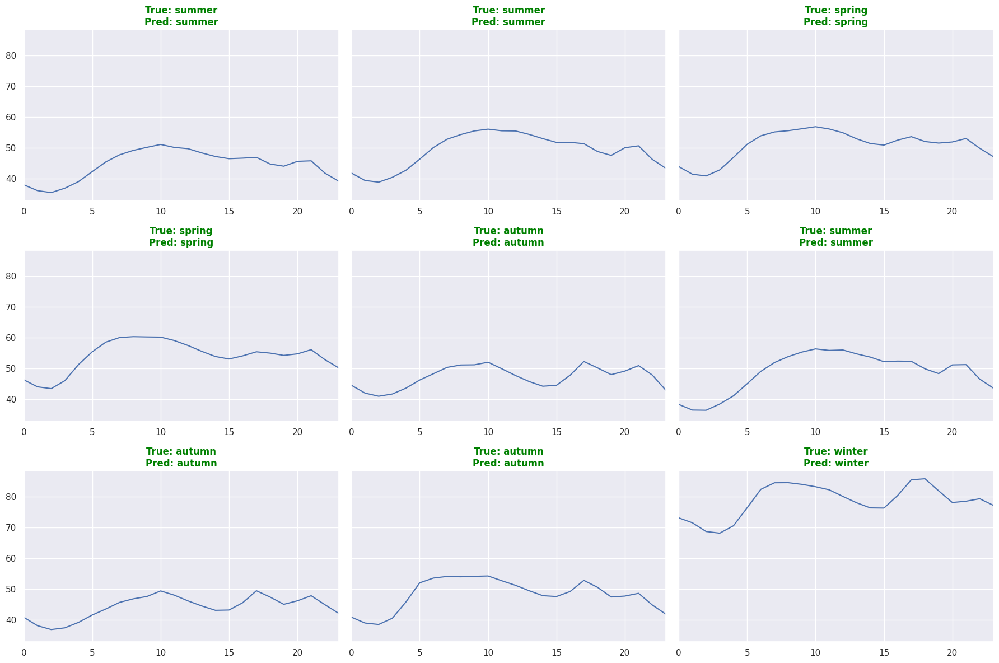

In [192]:
learn.show_results(sharey=True)

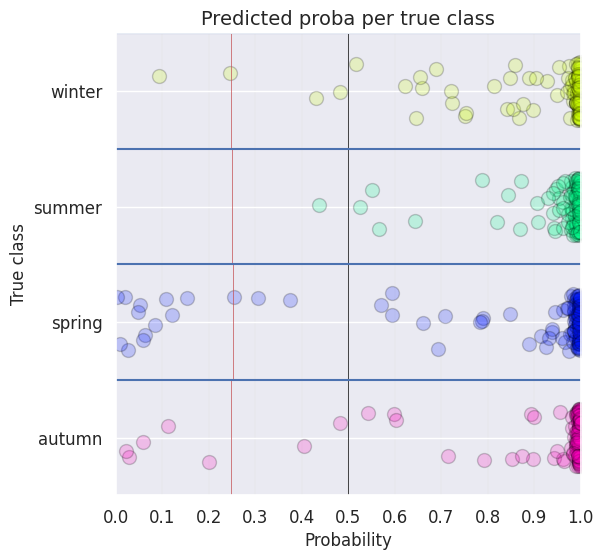

In [193]:
learn.show_probas()

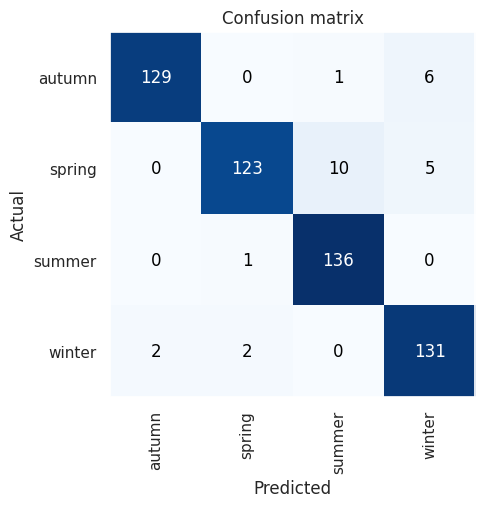

In [194]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [195]:
calculate_accuracy()

0.9505494505494505


### Вывод
Результат тоже отличный, 95%+, буквально на тысячные хуже ResNet. Ошибается InceptionTime примерно там же.

## 5.5. Вывод по классификации с помощью нейросеточек

* Прямо таки хороших нейросеточек получилось две штуки (`ResNet` и `InceptionTime`). У обеих после донастройки получилась точность 95%+. Но стоит иметь в виду, что это достаточно небыстрые в плане обучения нейросеточки.
* Большая часть нейросеток имела достаточно низкую точность (меньше 70% и вплоть до 50%).

# 6. Поиск аномалий

## 6.1. Импорты, загрузка и разбиение датасета

In [4]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
sns.set(style="whitegrid")

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import (
    ExponentialSmoothing,
    SimpleExpSmoothing,
    Holt,
)


from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import DBSCAN, KMeans

try:
    import dsatools
except ModuleNotFoundError:
    !pip install dsatools --quiet
finally:
    import dsatools

try:
    from adtk.detector import QuantileAD
    from adtk.detector import ThresholdAD
    from adtk.detector import VolatilityShiftAD
    from adtk.detector import LevelShiftAD
    from adtk.detector import SeasonalAD
    from adtk.detector import InterQuartileRangeAD
    from adtk.visualization import plot
except ModuleNotFoundError:
    !pip install adtk --quiet
finally:
    from adtk.detector import QuantileAD
    from adtk.detector import ThresholdAD
    from adtk.detector import VolatilityShiftAD
    from adtk.detector import LevelShiftAD
    from adtk.detector import SeasonalAD
    from adtk.detector import InterQuartileRangeAD
    from adtk.visualization import plot

try:
    import pyod.models
    from pyod.models.gmm import GMM
    from pyod.models.ocsvm import OCSVM
    from pyod.models.hbos import HBOS
    from pyod.models.auto_encoder import AutoEncoder
except ModuleNotFoundError:
    !pip install pyod --quiet
finally:
    import pyod.models
    from pyod.models.gmm import GMM
    from pyod.models.ocsvm import OCSVM
    from pyod.models.hbos import HBOS
    from pyod.models.auto_encoder import AutoEncoder

import warnings
warnings.filterwarnings('ignore')

In [5]:
def transform_dataframe_hrly(
    df: pd.DataFrame,
    cols_map: dict[str],
) -> pd.DataFrame:
    # Rename columns for convenience
    df = df[list(cols_map.keys())].rename(columns=cols_map)
    # Convert from MW to GW
    df = df / 1000
    df = df.rename_axis("Date")
    return df


cols_map = {
    "load_actual_entsoe_transparency" : "Consumption",
    "wind_onshore_generation_actual" : "Wind",
    "solar_generation_actual" : "Solar",
}
data = transform_dataframe_hrly(df_hrly, cols_map)

# Compute wind + solar generation
data["Wind+Solar"] = data[["Wind", "Solar"]].sum(axis=1, skipna=False)
data.ffill(inplace=True)
data.dropna(inplace=True)
data.to_csv(CSV_HRLY_PATH)
display(data)

,Consumption,Wind,Solar,Wind+Solar
Date,,,,
2015-01-01 08:00:00+00:00,64.277,1.936,0.385,2.321
2015-01-01 09:00:00+00:00,65.100,1.927,1.053,2.980
2015-01-01 10:00:00+00:00,65.875,1.846,1.635,3.481
2015-01-01 11:00:00+00:00,67.460,1.768,1.883,3.651
2015-01-01 12:00:00+00:00,65.706,1.715,1.857,3.572
...,...,...,...,...
2019-12-31 19:00:00+00:00,64.771,2.695,0.000,2.695
2019-12-31 20:00:00+00:00,62.259,2.831,0.000,2.831
2019-12-31 21:00:00+00:00,63.774,3.031,0.000,3.031


In [6]:
y = data.Consumption.values.reshape(-1, 1)
y

array([[64.277],
       [65.1  ],
       [65.875],
       ...,
       [63.774],
       [65.865],
       [64.677]])

## 6.2. Визуализации: скользящие окна, дифференцирование, разложения

Глянем на скользящие средние:

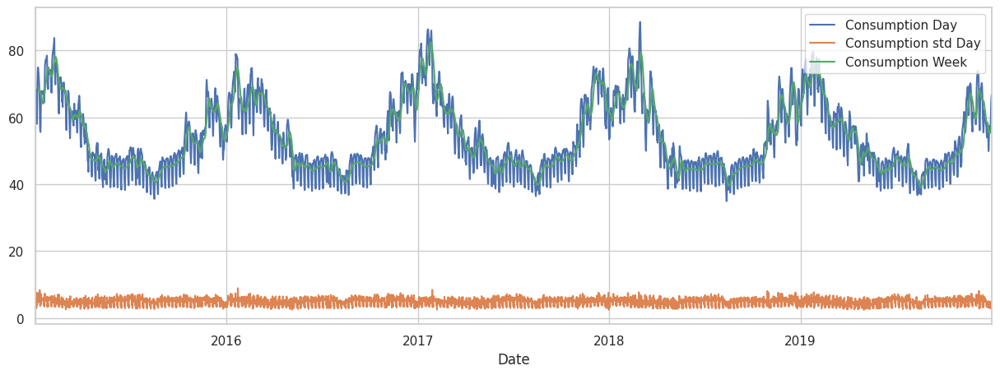

In [9]:
fig, ax = plt.subplots()
data["Consumption"].rolling(24).mean().plot(
    ax=ax,
    label="Consumption Day",
)
data["Consumption"].rolling(24).std().plot(
    ax=ax,
    label="Consumption std Day",
)
data["Consumption"].rolling(24 * 7).mean().plot(
    ax=ax,
    label="Consumption Week",
)
ax.legend();

Продифференцируем:

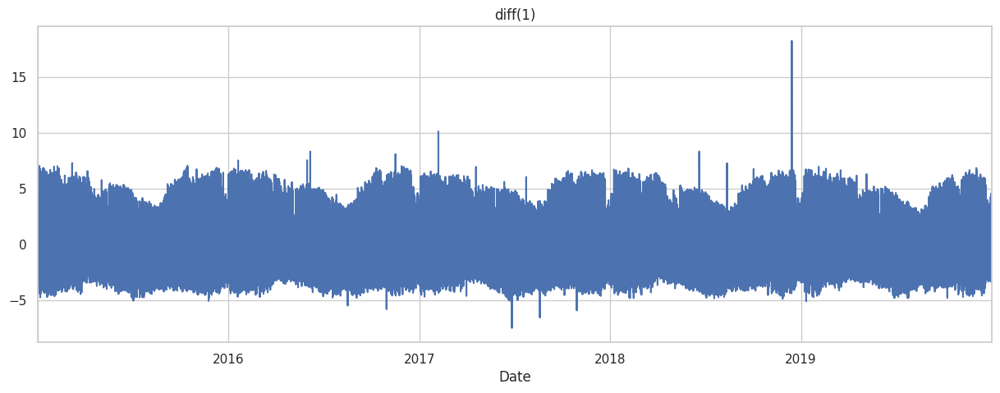

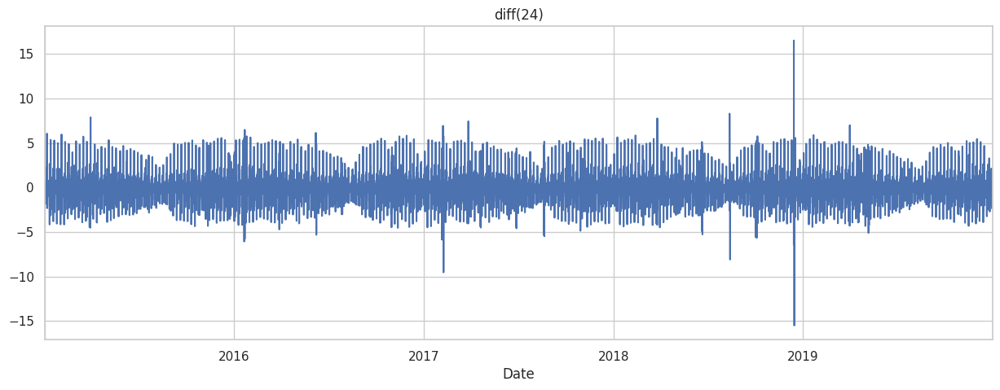

In [10]:
data["Consumption"].diff(1).plot()
plt.title(label="diff(1)")
plt.show()

data["Consumption"].diff(24).diff(1).plot();
plt.title(label="diff(24)")
plt.show()

Простое разложение:

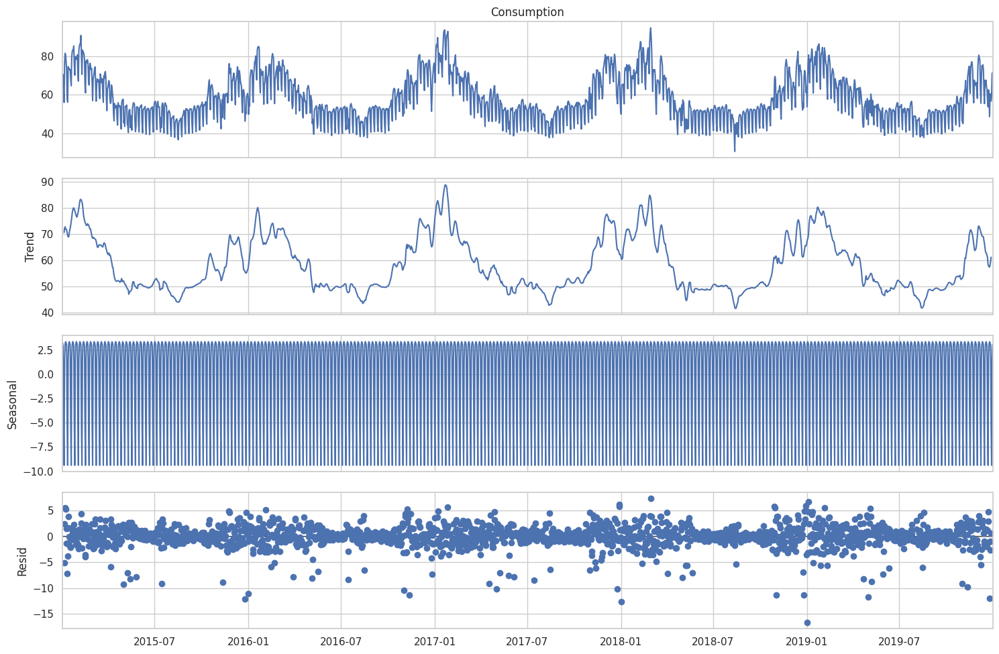

In [11]:
plt.rc("figure", figsize=(15, 10))
plt.rc("font", size=15)

data_seasonal = data.asfreq("1d")
result = seasonal_decompose(
    data_seasonal["Consumption"],
    model="additive",
)
fig = result.plot()

Прикольно, что в качестве тренда декомпозиция выбрала долгую сезонность.

Сравнение (остаток, метрика) от предсказания простой моделью:

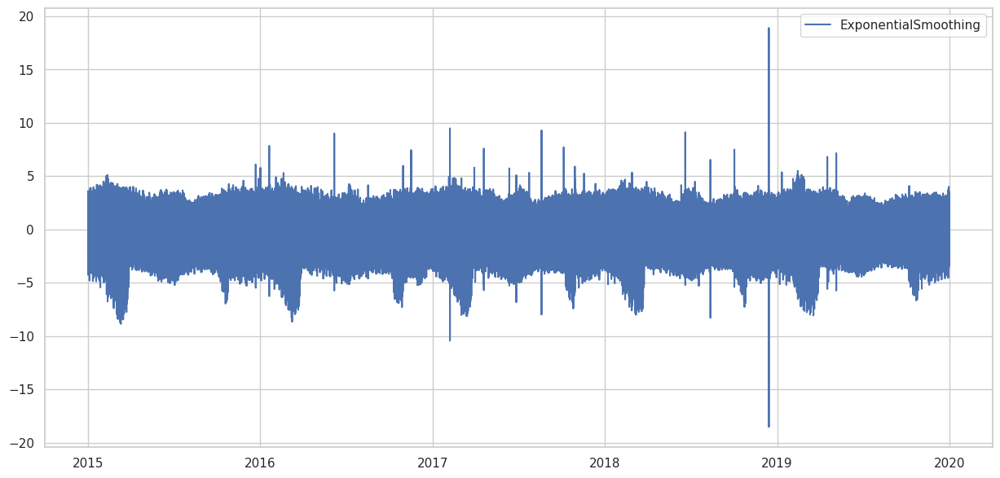

In [20]:
plt.rc("figure", figsize=(15, 7))
plt.rc("font", size=15)

forecaster = ExponentialSmoothing(
    y,
    seasonal_periods=52,
    trend="add",
    seasonal="add",
).fit()
predicts = forecaster.predict(start=0, end=len(y) - 1)
plt.plot(
    data.index,
    y.reshape(-1) - predicts,
    label="ExponentialSmoothing (s52)",
)
plt.legend();

Более тонкие разложения:

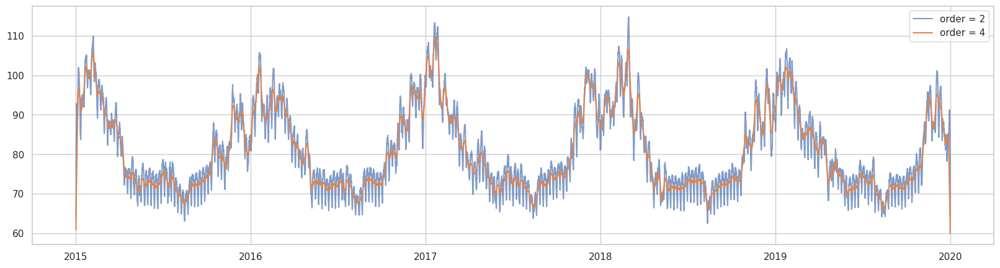

In [16]:
plt.rc("figure", figsize=(20, 5))
plt.rc("font", size=15)

y_dec = dsatools.decomposition.vmd(y.reshape(-1)[:], order=2)
plt.plot(
    data.index[1:-1],
    y_dec[0, 1:-1],
    alpha=0.7,
    label="order = 2",
);

y_dec = dsatools.decomposition.vmd(y.reshape(-1)[:], order=4)
plt.plot(
    data.index[1:-1],
    y_dec[0, 1:-1],
    alpha=1,
    label="order = 4",
);

plt.legend();

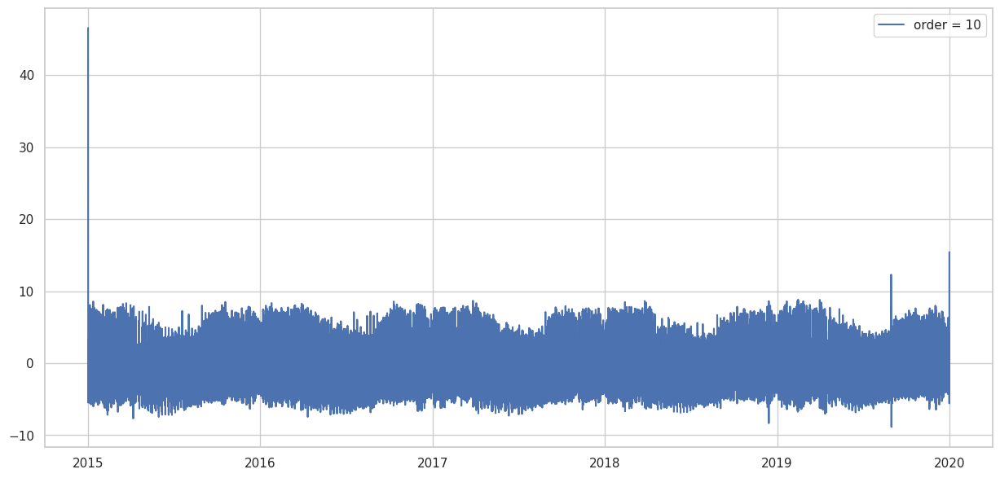

In [21]:
y_dec = dsatools.decomposition.emd(y.reshape(-1)[:], order=10)
plt.plot(
    data.index[1:-1],
    y_dec[0, 1:-1],
    label="emd, order = 10",
)
plt.legend()
plt.show()

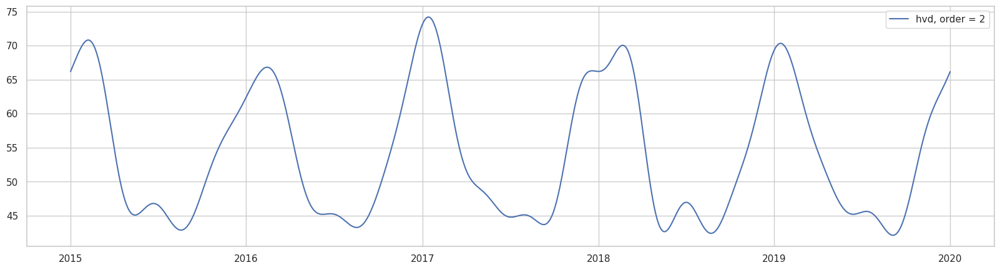

In [24]:
plt.rc("figure", figsize=(20, 5))
plt.rc("font", size=15)

y_dec = dsatools.decomposition.hvd(y.reshape(-1)[:], order=2)
plt.plot(
    data.index[1:-1],
    y_dec[0, 1:-1],
    label="hvd, order = 2",
)
plt.legend()
plt.show()

## 6.3. ADTK

### 6.3.1. QuantileAD

In [60]:
plt.rc("figure", figsize=(20, 8))
plt.rc("font", size=15)

False    42938
True       878
Name: Consumption, dtype: int64

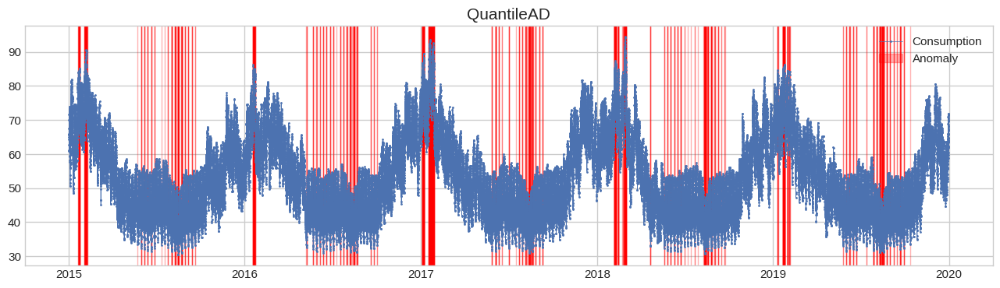

In [70]:
quantile_ad = QuantileAD(
    high=0.99,
    low=0.01,
)
target = data["Consumption"]
anomalies = quantile_ad.fit_detect(target)
display(anomalies.value_counts())
plot(
    target,
    anomaly=anomalies,
    anomaly_color="red",
)
plt.title("QuantileAD", fontsize=15);

False    42917
True       875
Name: Consumption, dtype: int64

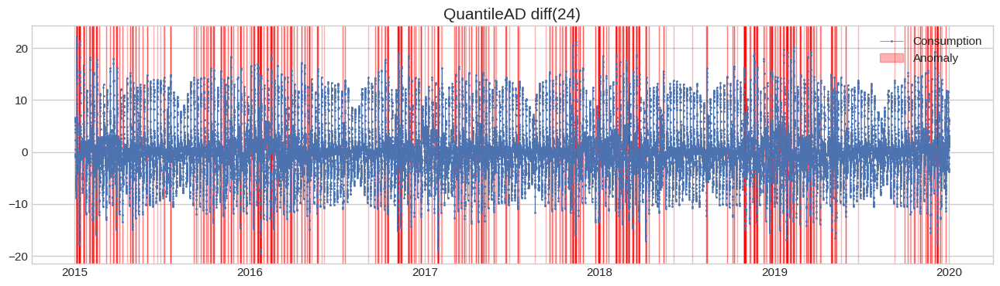

In [72]:
quantile_ad = QuantileAD(
    high=0.99,
    low=0.01,
)
target = data["Consumption"].diff(24)
anomalies = quantile_ad.fit_detect(target)
display(anomalies.value_counts())
plot(
    target,
    anomaly=anomalies,
    anomaly_color="red",
)
plt.title("QuantileAD diff(24)", fontsize=15);

#### Вывод

1. **Оригинал**. Ну в целом логично, зимой наблюдаются пиковые высокие значения, а летом – пиковые низкие. Всего в обозначенных пределах нашел почти 900 аномалий.

1. **diff(24)**. Аномалий примерно столько же, но они расположены уже совсем в других местах и более равномерно распределены по году.

### 6.3.2. ThresholdAD

False    43595
True       221
Name: Consumption, dtype: int64

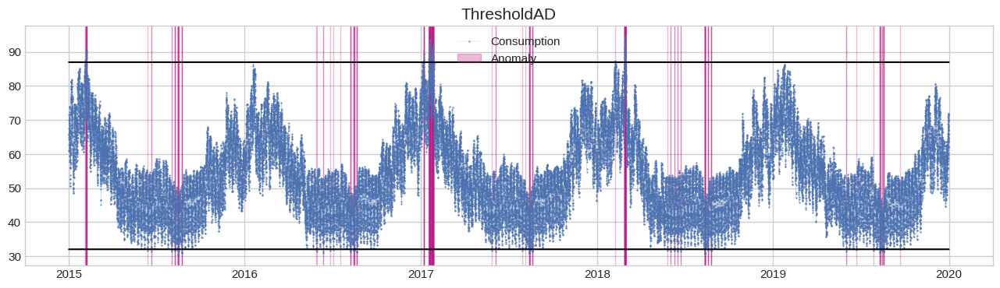

In [76]:
HIGH = 87
LOW = 32
threshold_val = ThresholdAD(
    high=HIGH,
    low=LOW,
)
target = data["Consumption"]
anomalies_thresh = threshold_val.detect(target)
display(anomalies_thresh.value_counts())
plot(
    target,
    anomaly=anomalies_thresh,
    ts_linewidth=0.1,
    ts_markersize=1,
    anomaly_markersize=5,
    anomaly_color="#ba1c87",
)
plt.title("ThresholdAD", fontsize=15);
plt.plot(data.index, [HIGH] * data.shape[0], color="black")
plt.plot(data.index, [LOW] * data.shape[0], color="black")
plt.legend(loc="upper center");

False    43566
True       226
Name: Consumption, dtype: int64

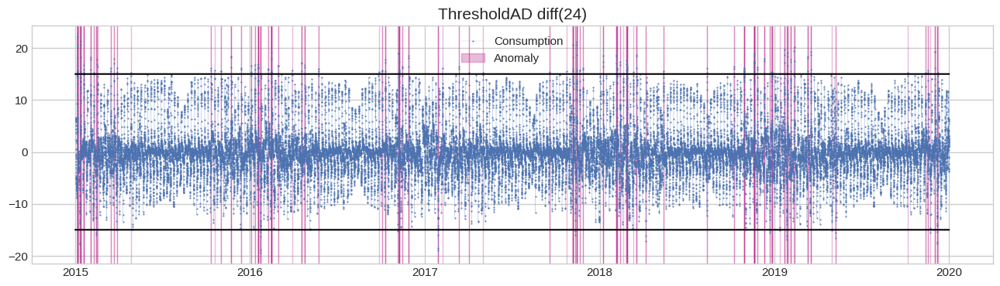

In [77]:
HIGH = 15
LOW = -HIGH
threshold_val = ThresholdAD(
    high=HIGH,
    low=LOW,
)
target = data["Consumption"].diff(24)
anomalies_thresh = threshold_val.detect(target)
display(anomalies_thresh.value_counts())
plot(
    target,
    anomaly=anomalies_thresh,
    ts_linewidth=0.1,
    ts_markersize=1,
    anomaly_markersize=5,
    anomaly_color="#ba1c87",
)
plt.title("ThresholdAD diff(24)", fontsize=15);
plt.plot(data.index, [HIGH] * data.shape[0], color="black")
plt.plot(data.index, [LOW] * data.shape[0], color="black")
plt.legend(loc="upper center");

#### Вывод

1. **Оригинал**. Тут я настроил трешхолд так, чтобы аномалий было по мень ше, их получилось 221 штука. По-хорошему, необходимо узнавать трешхолды у "заказчиков" или предметных специалистов.

1. **diff(24)**. Настроил трешхолд на примерно то же количество аномалий, но они расположены уже совсем в других местах и иначе распеделены по году: в этот раз аномалии в основном только зимой.

### 6.3.3. SeasonalAD

False    43815
True         1
Name: Consumption, dtype: int64

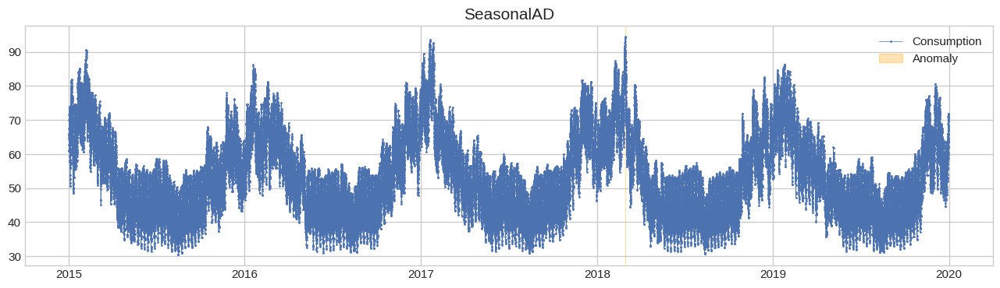

In [88]:
seasonal_vol = SeasonalAD()
target = data["Consumption"]
anomalies = seasonal_vol.fit_detect(target)
display(anomalies.value_counts())

plot(
    target,
    anomaly=anomalies,
    anomaly_color="orange",
)
plt.title("SeasonalAD", fontsize=15);

False    42860
True       932
Name: Consumption, dtype: int64

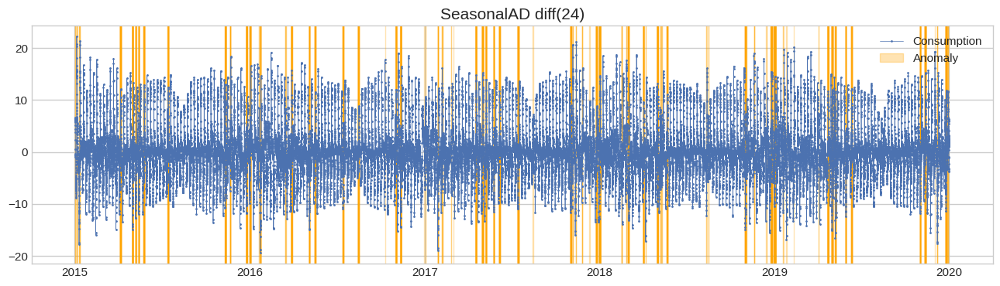

In [86]:
seasonal_vol = SeasonalAD()
target = data["Consumption"].diff(24)
anomalies = seasonal_vol.fit_detect(target)
display(anomalies.value_counts())

plot(
    target,
    anomaly=anomalies,
    anomaly_color="orange",
)
plt.title("SeasonalAD diff(24)", fontsize=15);

#### Вывод

1. **Оригинал**. Тут нашло всего одну аномалию, интересненько.

1. **diff(24)**. Здесь аномалий уже больше, но я не уверен, что данный метод в принципе правильно применять к дифференцированному ряду.

### 6.3.4. InterQuartileRangeAD

False    42293
True      1523
Name: Consumption, dtype: int64

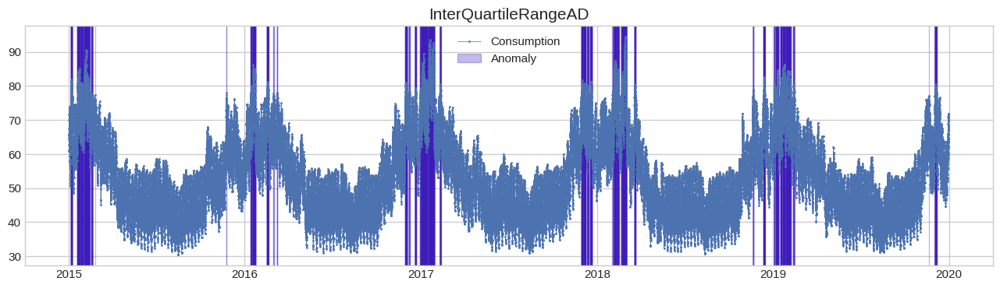

In [94]:
iqr_ad = InterQuartileRangeAD(c=0.9)
target = data["Consumption"]
anomalies = iqr_ad.fit_detect(target)
display(anomalies.value_counts())

plot(
    target,
    anomaly=anomalies,
    anomaly_color="#3e1cba",
)
plt.title("InterQuartileRangeAD", fontsize=15);

False    35122
True      8670
Name: Consumption, dtype: int64

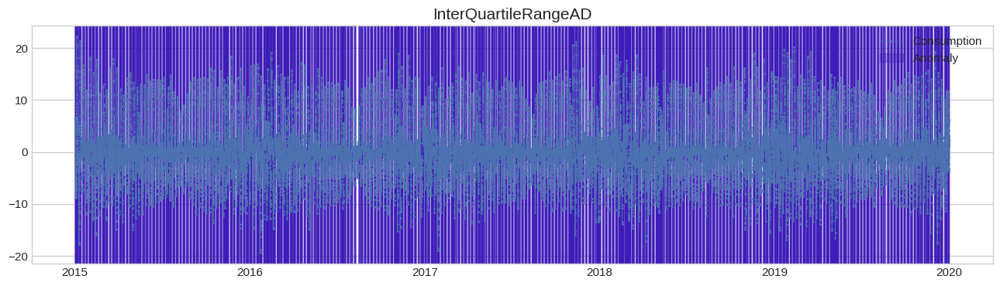

In [101]:
iqr_ad = InterQuartileRangeAD(c=0.9)
target = data["Consumption"].diff(24)
anomalies = iqr_ad.fit_detect(target)
display(anomalies.value_counts())

plot(
    target,
    anomaly=anomalies,
    anomaly_color="#3e1cba",
)
plt.title("InterQuartileRangeAD", fontsize=15);

#### Вывод

1. **Оригинал**. В данном случае нашлось целых полторы тыщщи аномалий, причем все зимой. В целом разумно, зимой и правда модет быть достаточно много выбросов.

1. **diff(24)**. "Сомнительно, ну окэй" (с). Для дифференцированного ряда такую штуку применять довольно бесполезно.

### 6.3.5. Вывод по ADTK

В целом получилось довольно ок, методы неплохо настраиваются, живем.

## 6.4. SKLEARN

### 6.4.1. IsolationForest

 1    43380
-1      436
Name: anomaly_IF, dtype: int64

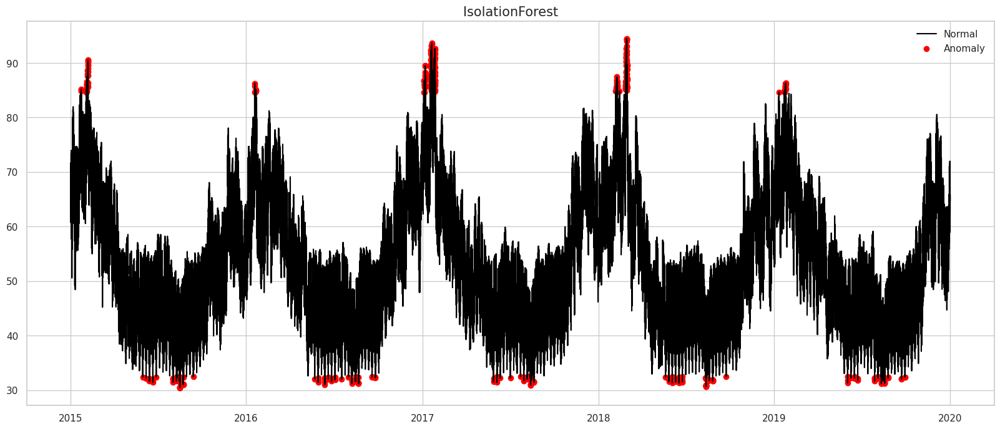

In [124]:
outliers_fraction = 0.01

model = IsolationForest(contamination=outliers_fraction)
model.fit(y)

data["anomaly_IF"] = model.predict(y)

# visualization
fig, ax = plt.subplots(figsize=(20, 8))
display(data["anomaly_IF"].value_counts())

a = data.loc[data["anomaly_IF"] == -1, ["Consumption"]]  # anomaly

ax.plot(
    data.index,
    data["Consumption"],
    color="black",
    label="Normal",
)
ax.scatter(
    a.index,
    a["Consumption"],
    color="red",
    label="Anomaly",
)
plt.title("IsolationForest", fontsize=15)
plt.legend()
plt.show()

 1    43357
-1      435
Name: anomaly_IF, dtype: int64

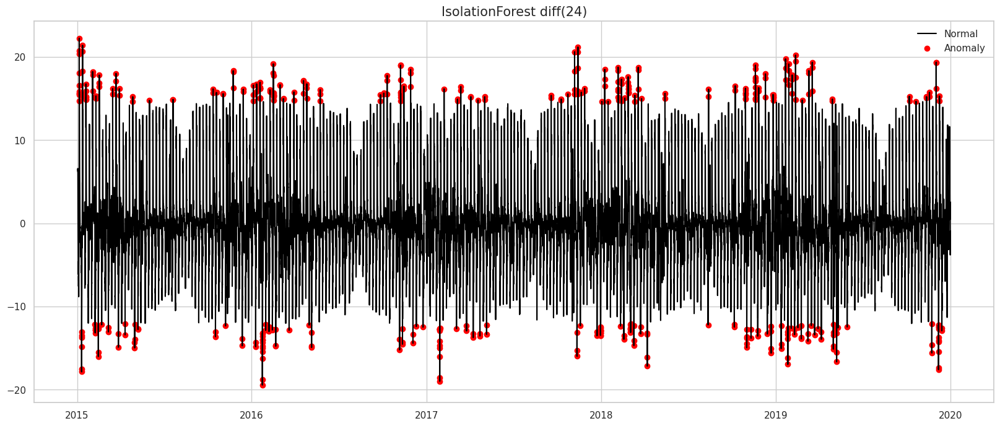

In [136]:
outliers_fraction = 0.01
target_df = data[["Consumption"]].diff(24).dropna()
target = target_df.values.reshape(-1, 1)
model = IsolationForest(contamination=outliers_fraction)
model.fit(target)

target_df["anomaly_IF"] = model.predict(target)
display(target_df["anomaly_IF"].value_counts())

a = target_df.loc[target_df["anomaly_IF"] == -1, ["Consumption"]]  # anomaly

fig, ax = plt.subplots(figsize=(20, 8))
ax.plot(
    target_df.index,
    target_df["Consumption"],
    color="black",
    label="Normal",
)
ax.scatter(
    a.index,
    a["Consumption"],
    color="red",
    label="Anomaly",
)
plt.title("IsolationForest diff(24)", fontsize=15)
plt.legend()
plt.show()

#### Вывод

1. **Оригинал**. По классике много аномалий в середине зимы и в середине лета.

1. **diff(24)**. После дифференциирования остались в основном аномалии зимой, летом почти ничего не осталось.

### 6.4.2. LocalOutlierFactor

 1    43807
-1        9
Name: anomaly_LOF, dtype: int64

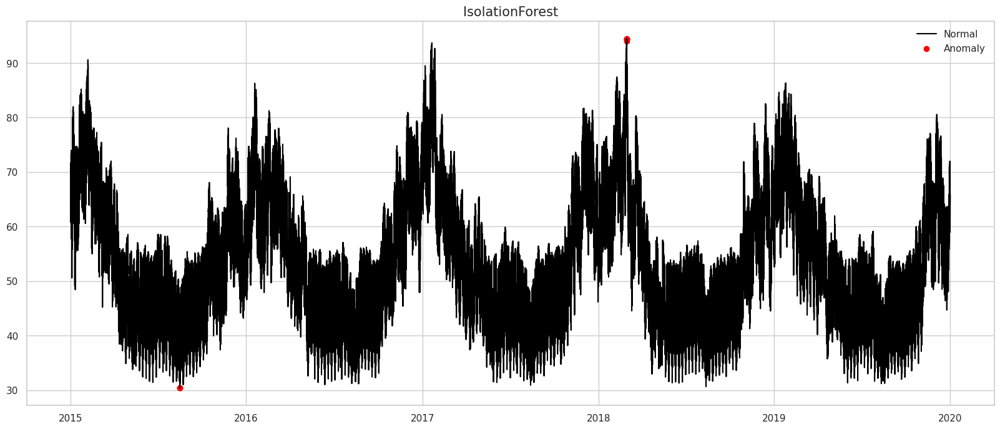

In [139]:
model = LocalOutlierFactor(novelty=True)
model.fit(y)

data["anomaly_LOF"] = model.predict(y)

# visualization
fig, ax = plt.subplots(figsize=(20, 8))
display(data["anomaly_LOF"].value_counts())

a = data.loc[data["anomaly_LOF"] == -1, ["Consumption"]]  # anomaly

ax.plot(
    data.index,
    data["Consumption"],
    color="black",
    label="Normal",
)
ax.scatter(
    a.index,
    a["Consumption"],
    color="red",
    label="Anomaly",
)
plt.title("IsolationForest", fontsize=15)
plt.legend()
plt.show()

 1    43756
-1       36
Name: anomaly_LOF, dtype: int64

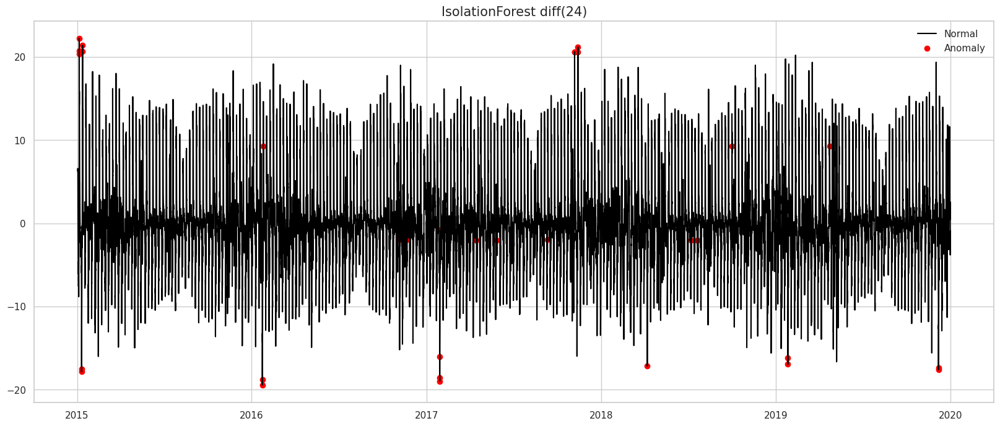

In [140]:
target_df = data[["Consumption"]].diff(24).dropna()
target = target_df.values.reshape(-1, 1)
model = LocalOutlierFactor(novelty=True)
model.fit(target)

target_df["anomaly_LOF"] = model.predict(target)
display(target_df["anomaly_LOF"].value_counts())

a = target_df.loc[target_df["anomaly_LOF"] == -1, ["Consumption"]]  # anomaly

fig, ax = plt.subplots(figsize=(20, 8))
ax.plot(
    target_df.index,
    target_df["Consumption"],
    color="black",
    label="Normal",
)
ax.scatter(
    a.index,
    a["Consumption"],
    color="red",
    label="Anomaly",
)
plt.title("IsolationForest diff(24)", fontsize=15)
plt.legend()
plt.show()

#### Вывод

1. **Оригинал**. Найдено всего лишь 9 аномалий.

1. **diff(24)**. Тут аномалий уже значительно больше (36, аж в 4 раза). Но значительно меньше, чем в предыдущих пунктах.

### 6.4.3. DBSCAN, KMeans

[1151 2732 3234 3679 4163 4686 5207 5444 6533 6987] [5 3 6 9 1 7 2 8 0 4]


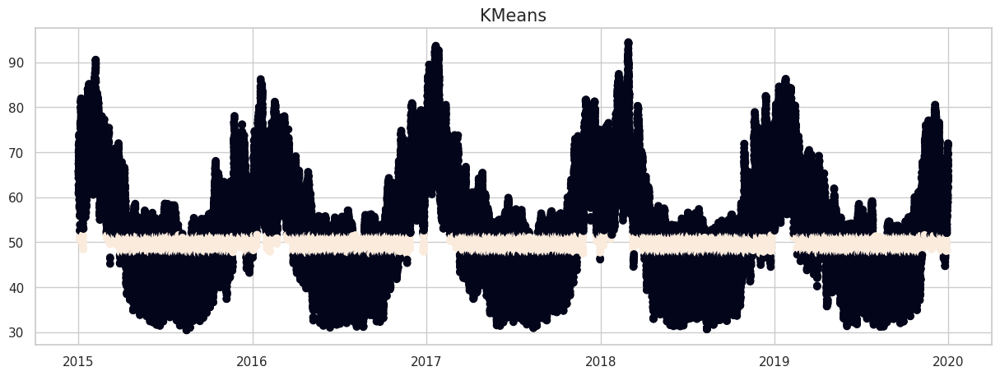

In [14]:
# model=DBSCAN(eps = 100.)
model = KMeans(n_clusters=10)

model.fit(y)
colors = model.labels_
cls,counts = np.unique(colors, return_counts=True)
sort_idx = np.argsort(counts)#[::-1]
print(counts[sort_idx], cls[sort_idx])
plt.scatter(data.index, y, c = colors == cls[sort_idx][-1])
plt.title("KMeans", fontsize=15)
plt.show()

#### Вывод

DBSCAN крашится из-за нехватки оперативки, а KMeans выдает лажу. Ну в целом и не страшно, у нас есть и другие методы для оценки.

## 6.5. PYOD

### 6.5.1. GMM

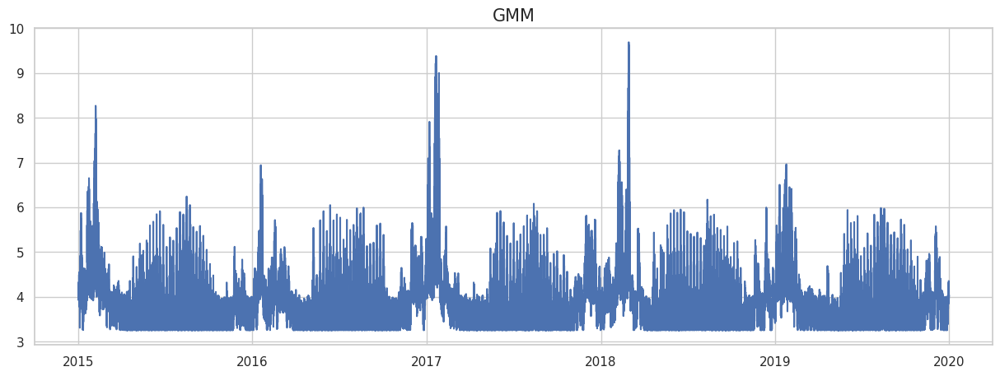

In [15]:
clf = GMM(n_components=2)
clf.fit(y)
y_scores = clf.decision_scores_
plt.plot(data.index, y_scores)
plt.title("GMM", fontsize=15)
plt.show()

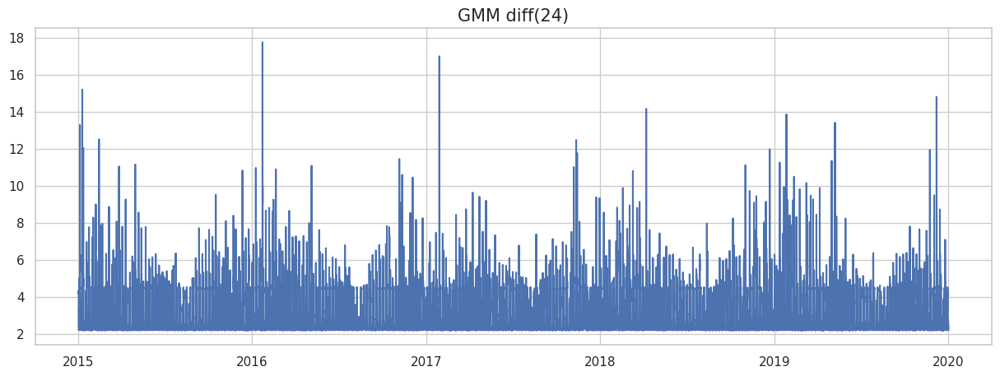

In [16]:
target_df = data[["Consumption"]].diff(24).dropna()
target = target_df.values.reshape(-1, 1)

clf = GMM(n_components=2)
clf.fit(target)
y_scores = clf.decision_scores_
plt.plot(target_df.index, y_scores)
plt.title("GMM diff(24)", fontsize=15)
plt.show()

#### Вывод

1. **Оригинал**. Если я правильно понимаю выдачу метода, то по классике у нас много аномалий в середине зимы и чуть меньше, но есть в середине лета.

1. **diff(24)**. После дифференциирования остались в основном аномалии зимой.

### 6.5.2. OCSVM

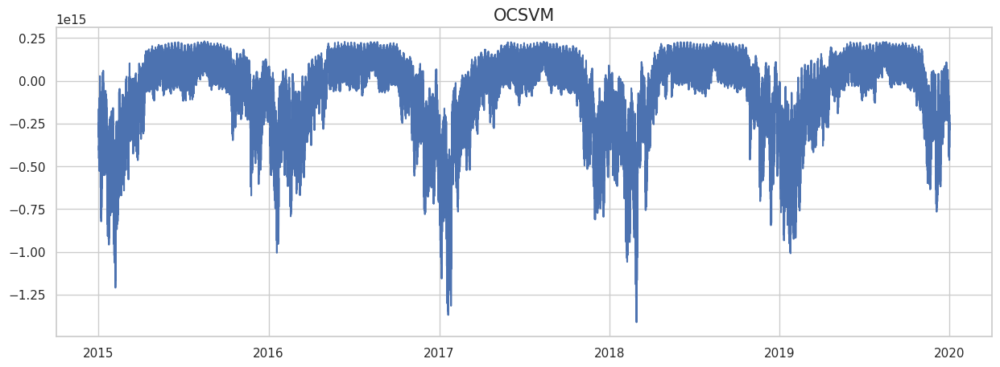

In [19]:
clf = OCSVM(kernel="poly", degree=3)
clf.fit(y)
y_scores = clf.decision_scores_
plt.plot(data.index, y_scores)
plt.title("OCSVM", fontsize=15)
plt.show()

In [ ]:
# target_df = data[["Consumption"]].diff(24).dropna()
# target = target_df.values.reshape(-1, 1)

# clf = OCSVM(kernel="poly", degree=3)
# clf.fit(target)
# y_scores = clf.decision_scores_
# plt.plot(target_df.index, y_scores)
# plt.title("OCSVM diff(24)", fontsize=15)
# plt.show()

#### Вывод

1. **Оригинал**. Если я правильно понимаю выдачу метода, то по классике у нас много аномалий в середине зимы.

1. **diff(24)**. Не захотело работать, бесконечный фит, ну и бог с ним.

Метод работает ну ооооочень долго, а интерпретировать результаты не всегда понятно как, поэтому я бы не стал использовать его на постоянной основе.

### 6.5.3. HBOS

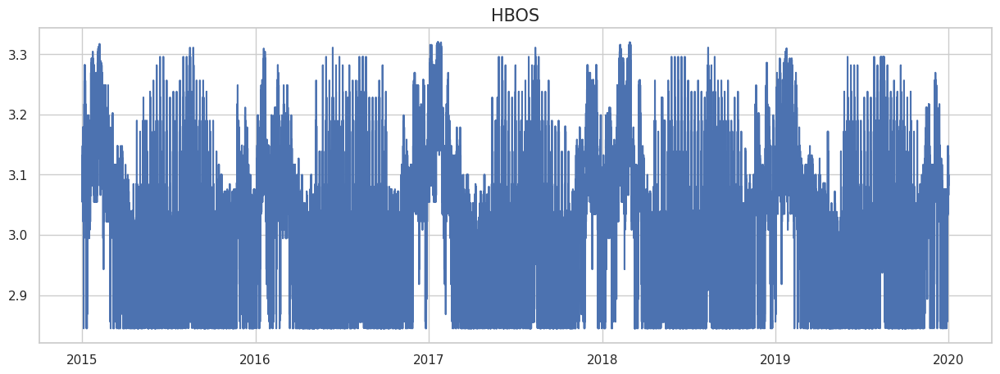

In [7]:
clf = HBOS(
    n_bins=100,
    alpha=0.1,
    tol=0.5,
    contamination=0.1,
)
clf.fit(y)
y_scores = clf.decision_scores_
plt.plot(data.index, y_scores)
plt.title("HBOS", fontsize=15)
plt.show()

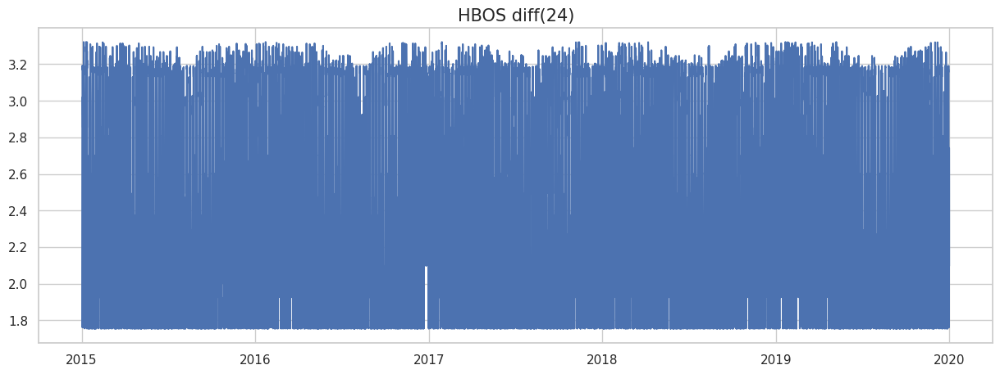

In [8]:
target_df = data[["Consumption"]].diff(24).dropna()
target = target_df.values.reshape(-1, 1)

clf = HBOS(
    n_bins=100,
    alpha=0.1,
    tol=0.5,
    contamination=0.1,
)
clf.fit(target)
y_scores = clf.decision_scores_
plt.plot(target_df.index, y_scores)
plt.title("HBOS diff(24)", fontsize=15)
plt.show()

#### Вывод

1. **Оригинал**. Графики выглядят хуже, чем в предыдущих случаях, но общую тенденцию про аномалии в середине зимы и середине лета вычленить можно.

1. **diff(24)**. Ну тут будто бы совсем непонятно, как интерпретировать.

### 6.5.4. AutoEncoder

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_21 (Dense)            (None, 1)                 2         
                                                                 
 dropout_18 (Dropout)        (None, 1)                 0         
                                                                 
 dense_22 (Dense)            (None, 1)                 2         
                                                                 
 dropout_19 (Dropout)        (None, 1)                 0         
                                                                 
 dense_23 (Dense)            (None, 1)                 2         
                                                                 
 dropout_20 (Dropout)        (None, 1)                 0         
                                                                 
 dense_24 (Dense)            (None, 125)              

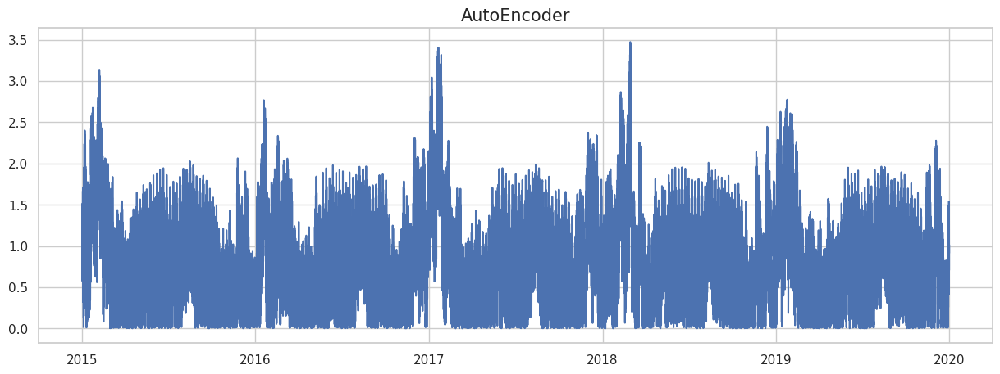

In [13]:
clf = AutoEncoder(
    hidden_neurons=[1, 125, 125, 1],
    epochs=20,
    random_state=42,
)
clf.fit(y)
y_scores = clf.decision_scores_
plt.plot(data.index, y_scores)
plt.title("AutoEncoder", fontsize=15)
plt.show()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_35 (Dense)            (None, 1)                 2         
                                                                 
 dropout_30 (Dropout)        (None, 1)                 0         
                                                                 
 dense_36 (Dense)            (None, 1)                 2         
                                                                 
 dropout_31 (Dropout)        (None, 1)                 0         
                                                                 
 dense_37 (Dense)            (None, 1)                 2         
                                                                 
 dropout_32 (Dropout)        (None, 1)                 0         
                                                                 
 dense_38 (Dense)            (None, 125)              

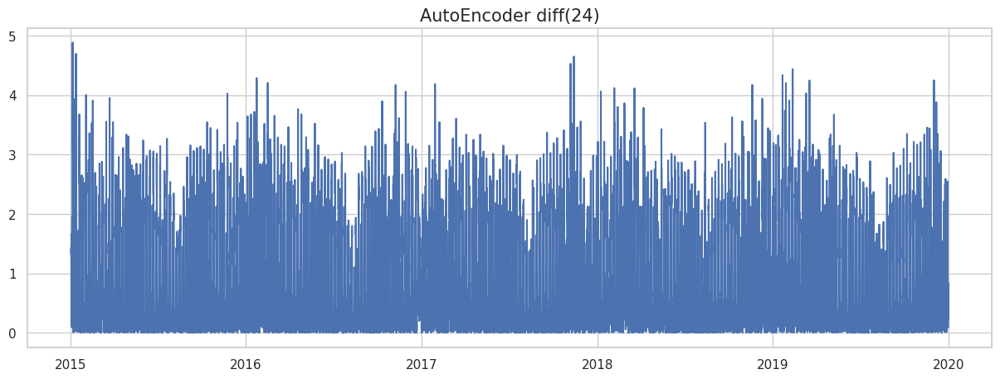

In [15]:
target_df = data[["Consumption"]].diff(24).dropna()
target = target_df.values.reshape(-1, 1)

clf = AutoEncoder(
    hidden_neurons=[1, 125, 125, 1],
    epochs=20,
    random_state=42,
)
clf.fit(target)
y_scores = clf.decision_scores_
plt.plot(target_df.index, y_scores)
plt.title("AutoEncoder diff(24)", fontsize=15)
plt.show()

#### Вывод

1. **Оригинал**. Классика: много аномалий в середине зимы и чуть меньше, но есть в середине лета.

1. **diff(24)**. Мне сложно интерпретировать данный результат.

## 6.6. Вывод по аномалиям

В целом очень многие методы неплохо справились, но были и совсем слабые результаты. В любом случае всё будет решаться в зависимости от задачи.

# 7. Общий вывод по работе

> Ну штош, это был очень увлекательный аттракцион. Проведена огромная работа по анализу общего потребления электричества во Франции за период с 2015 до 2019 года.

## Визуализация

* Мы имели дело со временным рядом с многокомпонентной сезонностью (по временам года, по дням, по часам)
* Во Франции преобладает традиционная генерация (ветра и солнца до 10% каждого)
* Заметного тренда не наблюдалось.

## Простые предсказания
* Лучше всего справился Prophet `(sMAPE = 0.060)`
* Очень хорошо (внезапно) справилось наивное предсказание с учетом сезонности `(sMAPE = 0.064)`
* Было очень много моделек с точностью, не превышающей 0.07 - 0.08

## SARIMA
* Ручым подбором удалось подобрать модель с точностью `sMAPE = 0.086`, что заметно хуже Prophet
* Автоподбор параметров SARIMA не сработал совсем, к сожалению

## Классификация ВР, классический МО
* Большая часть методов очень хорошо справилась с классификацией с метрикой точности более 90%
* Лучше всего справились модельки MUSE `(accuracy = 0.965)` и SupervisedTimeSeriesForest `(accuracy = 0.962)`

## Классификация ВР, нейросеточки
* Тут далеко не все модельки нормально справились с классификацией, многие модельки справились на 70-80% точности
* Лучше всего справились две модельки: ResNet `(accuracy = 0.954)` и InceptionTime `(accuracy = 0.951)`. Но обе модельки относительно не быстро учатся, это стоит иметь в виду.

## Поиск аномалий
* Было опробовано множество методов для поиска аномалий, большинство работает нормально, однако некоторые работают плохо / долго / не работают.
* Больше всего мне понравились методы от sklearn, меньше всего – от pyod.

Ну штош, кажется, на этом всё, спасибо за внимание!